# Housing Price - Assignment to study factors that influence Car Prices

* __Problem Statement__
A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.
 
The company is looking at prospective properties to buy to enter the market. You are required to build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.

The company wants to know:
•	Which variables are significant in predicting the price of a house, and
•	How well those variables describe the price of a house.
 
Also, determine the optimal value of lambda for ridge and lasso regression.

* __Business Goal__ 
 
You are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for management to understand the pricing dynamics of a new market.

# Approach of my analysis to the problem

__High Level Approach__
As there are different approaches in Advanced Linear Regression, I would create 2 models with Ridge and Lasso. 

* The basis for 3 models is as follows:

  1. __Multiple Linear Regression Model I:__ 
     * Scaling - Standard Scaler
     * ML Algorithm - Ridge Regression

  2. __Multiple Linear Regression Model II:__ 
     * Scaling - Standard Scaler
     * ML Algorithm - Lasso Regression
  
__Based on the inferences from each of the model, I would try to select the best model based on the significance level and other factors__


# Steps invoved in this notebook

1. Import Python Libraries for data analysis and ML 
2. Local user defined functions
3. Sourcing the Data
4. Inspect and Clean the Data
5. Visualising and Exploring the data
6. Preparing the data for modelling(train-test split, rescaling etc)
7. Model evaluation for Advanced Regression Criteria
8. Advanced Linear Regression Model I using Ridge Regression
   * Modelling, Training, Calculate Coefficents and Iteration, Residual Analysis on both test and train, Evaluate the model with Test set and summary
9. Advanced Linear Regression Model II using Lasso Regression
   * Modelling, Training, Calculate Coefficents, Selection of Features and Iteration, Residual Analysis on both test and train, Evaluate the model with Test set and summary
10. Evaluation of the 2 Models
11. Final Summary
12. Part II of the Assignment for Subjective Questions

# Import Python Functions

In [1]:
# Local classes and Local flags

# Local Classes
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'
    
# Debug flag for investigative purpose
DEBUG = 0

# Default random_state
rndm_stat = 42

In [2]:
# Python libraries for Data processing and analysis
import time as time
strt = time.time()
import pandas as pd
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 100)
pd.options.mode.use_inf_as_na = True
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import glob
from matplotlib.pyplot import figure
import warnings
import math
import itertools
warnings.filterwarnings('ignore')
sns.set_style("whitegrid")
from math import sqrt
import re
from prettytable import PrettyTable

# ML Libraries
import statsmodels
import statsmodels.api as sm
import sklearn as sk
from sklearn.model_selection import train_test_split,GridSearchCV, KFold
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder, StandardScaler,OrdinalEncoder,LabelEncoder,Normalizer,RobustScaler,PowerTransformer
from sklearn.compose import ColumnTransformer
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Local User Defined Functions

## Local functions for data overview and data cleaning

In [3]:
# local functions

# Function to read a file & Store it in Pandas
# read_file takes either csv or excel file as input and reuturns a pandas DF and
# also prints head, tail, description, info and shape of the DF
def read_file(l_fname,l_path,head=0):
    i = l_fname.split(".")
    f_path = l_path+'/'+l_fname
    print(f_path,i[0],i[1])
    if (i[1] == "xlsx"):
        l_df = pd.read_excel(f_path,header=head,encoding = "ISO-8859-1",infer_datetime_format=True)
    elif (i[1] == "csv"):
        l_df = pd.read_csv(f_path,header=head,encoding = "ISO-8859-1",infer_datetime_format=True)
    ov_df(l_df)
    return(l_df)

# Function to get the Overview of DataFrame
# take df as input and prints head, tail, description, info and shape of the DF
def ov_df(l_df):
    print(color.BOLD+color.PURPLE + 'Inspect and Explore the Dataset' + color.END)
    print("\n#####################  DataFrame Head  ######################")
    print(l_df.head(3))
    print("\n#####################  DataFrame Tail  ######################")
    print(l_df.tail(3))
    print("\n#####################  DataFrame Info  ######################")
    print(l_df.info())
    print("\n####################  DataFrame Columns  ####################")
    print(list(l_df.columns))
    print("\n####################  DataFrame Shape  ####################")
    print("No of Rows",l_df.shape[0])
    print("No of Columns",l_df.shape[1])

# Function per_col_null takes a df as input and prints summary of Null Values across Columns
def per_col_null(l_df):
    print("\n############  Missing Values of Columns in %  ############")
    col_null = round((l_df.isnull().sum().sort_values(ascending=False)/len(l_df))*100,4)
    print(col_null[col_null > 0])  

# Function to change the cast the column into different type
def col_cast(l_df,n_dtyp,*args):
    for l_c_name in args:
        l_df = l_df.astype({l_c_name:n_dtyp})
        print(l_df[l_c_name].describe())
    return(l_df)

## Functions to plot

In [4]:
# Function to plot 2 or more box plots
# m_box_plt takes a df, dimensions of subplot (no of rows and columns) and variable list of columns
# to plot multiple boxplots
def m_box_plt(l_df,n_r,n_c,*args):
    j=1
    fig_h = n_r * 4
    plt.figure(1,figsize=(13,fig_h))
    # set palette 
    palette = itertools.cycle(sns.color_palette())
    sns.set(style="whitegrid",font_scale=1,palette='RdYlGn')
    for i in args:
        plt.subplot(n_r,n_c,j)
        sns.boxplot(l_df[i],orient="v")
        #sns.swarmplot(l_df[i],color=".25",orient="v")
        plt.title('Central Tendency of {}'.format(i),fontsize=12)
        j+=1
    plt.show()
    
# Function to plot 2 or more Linear Regression plots
# reg_plt takes a df, dimensions of subplot (no of rows and columns), dependent variable and variable list of columns
# to plot multiple reg plots
def reg_plt(l_df,n_r,n_c,l_dep,*args):
    j=1
    plt.figure(1,figsize=(13,13))
    sns.set(style="whitegrid",font_scale=1,palette='Set1')
    for i in args:
        plt.subplot(n_r,n_c,j)
        ax = sns.regplot(x=i,y=l_dep,data=l_df,x_jitter=.1)
        plt.title('Linear Regression Plot of {} and {}'.format(i,l_dep),fontsize=12)
        plt.legend(loc=1)
        j+=1
    plt.show()

#  Function to plot 2 or more box plots
# comp_box_plt takes a df, dimensions of subplot (no of rows and columns), dependent variable and variable list of columns
# to plot multiple comparitive box plots
def comp_box_plt(l_df,n_r,n_c,l_dep,*args):
    j=1
    fig_h = n_r * 4
    plt.figure(1,figsize=(13,fig_h))
    # set palette 
    palette = itertools.cycle(sns.color_palette())
    sns.set(style="whitegrid",font_scale=1,palette='RdYlGn')
    for i in args:
        plt.subplot(n_r,n_c,j)
        sns.boxplot(l_df[i],orient="v")
        #sns.swarmplot(l_df[i],color=".25",orient="v")
        plt.title('Central Tendency of {}'.format(i),fontsize=12)
        j+=1
    plt.show()
    
    
#  Function to plot 2 or more box plots
# dist_plt takes a df, dimensions of subplot (no of rows and columns), variable list of columns
# to plot multiple comparitive distribution plots
def dist_plt(l_df,n_r,n_c,*args):
    j=1
    colrs = ["dummy","skyblue","red","olive","gold","teal","green","blue"]
    fig_h = n_r * 5
    plt.figure(1,figsize=(8,fig_h))
    sns.set(style="whitegrid",font_scale=0.8)
    for i in args:
        plt.subplot(n_r,n_c,j)
        ax = sns.distplot(l_df[i],bins=20,color=colrs[j])
        plt.title('Distribution of {}'.format(i),fontsize=10)
        j+=1
    plt.show()

# Function to plot 2 or more Seaborn count plots. 
# This function takes dataframe and variable no of arguments which are columns and do subplots based on the no of rows 
# and columns given
def cnt_plt(l_df,n_r,n_c,*args):
    j=1
    fig_h = n_r * 7
    plt.figure(1,figsize=(14,fig_h))
    sns.set(font_scale=1,palette='bright')
    rot = 25
    if n_c == 1:
        rot = 90
    for i in args:
        plt.subplot(n_r,n_c,j)
        ax = sns.countplot(l_df[i])
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=rot)
        total = len(l_df[i])
        plt.title('Univariate Analysis of variable {}'.format(i),fontsize=12)
        for p in ax.patches:
            percentage = '{:.1f}%'.format(100 * p.get_height()/total)
            x = p.get_x() + 0.3
            y = p.get_y() + p.get_height()
            ax.annotate(percentage, (x, y))
        j+=1
    plt.show()

# Sourcing the Data

## Read the train.csv

In [5]:
# Set the path and file name
folder=r"C:\My Folders\OneDrive\Surface\Sadguru\Lakshmi\Study\IIIB_PGDS\ML2\Advanced_Regression_Assignment"
file="train.csv"

# Read file using local functions. read_file takes either csv or excel file as input and reuturns a pandas DF and
# also prints head, tail, description, info and shape of the DF
h_df = read_file(file,folder)

C:\My Folders\OneDrive\Surface\Sadguru\Lakshmi\Study\IIIB_PGDS\ML2\Advanced_Regression_Assignment/train.csv train csv
Inspect and Explore the Dataset

#####################  DataFrame Head  ######################
   Id  MSSubClass MSZoning  LotFrontage  LotArea Street Alley LotShape  \
0   1          60       RL         65.0     8450   Pave   NaN      Reg   
1   2          20       RL         80.0     9600   Pave   NaN      Reg   
2   3          60       RL         68.0    11250   Pave   NaN      IR1   

  LandContour Utilities LotConfig LandSlope Neighborhood Condition1  \
0         Lvl    AllPub    Inside       Gtl      CollgCr       Norm   
1         Lvl    AllPub       FR2       Gtl      Veenker      Feedr   
2         Lvl    AllPub    Inside       Gtl      CollgCr       Norm   

  Condition2 BldgType HouseStyle  OverallQual  OverallCond  YearBuilt  \
0       Norm     1Fam     2Story            7            5       2003   
1       Norm     1Fam     1Story            6            8 

## Inspect the Column Data Types of c_df

In [6]:
# Analyze Categorical, Numerical and Date variables of Application Data
print(color.BOLD+"Categorical and Numerical Variables"+ color.END)
display(h_df.dtypes.value_counts())
print(color.BOLD+"Numerical Integer Variables"+ color.END)
display(h_df.select_dtypes(include='int64').dtypes)
print(color.BOLD+"Categorical Variables"+ color.END)
display(h_df.select_dtypes(include=object).dtypes)
print(color.BOLD+"Numerical Float Variables"+ color.END)
display(h_df.select_dtypes(include='float64').dtypes)

Categorical and Numerical Variables


object     43
int64      35
float64     3
dtype: int64

Numerical Integer Variables


Id               int64
MSSubClass       int64
LotArea          int64
OverallQual      int64
OverallCond      int64
YearBuilt        int64
YearRemodAdd     int64
BsmtFinSF1       int64
BsmtFinSF2       int64
BsmtUnfSF        int64
TotalBsmtSF      int64
1stFlrSF         int64
2ndFlrSF         int64
LowQualFinSF     int64
GrLivArea        int64
BsmtFullBath     int64
BsmtHalfBath     int64
FullBath         int64
HalfBath         int64
BedroomAbvGr     int64
KitchenAbvGr     int64
TotRmsAbvGrd     int64
Fireplaces       int64
GarageCars       int64
GarageArea       int64
WoodDeckSF       int64
OpenPorchSF      int64
EnclosedPorch    int64
3SsnPorch        int64
ScreenPorch      int64
PoolArea         int64
MiscVal          int64
MoSold           int64
YrSold           int64
SalePrice        int64
dtype: object

Categorical Variables


MSZoning         object
Street           object
Alley            object
LotShape         object
LandContour      object
Utilities        object
LotConfig        object
LandSlope        object
Neighborhood     object
Condition1       object
Condition2       object
BldgType         object
HouseStyle       object
RoofStyle        object
RoofMatl         object
Exterior1st      object
Exterior2nd      object
MasVnrType       object
ExterQual        object
ExterCond        object
Foundation       object
BsmtQual         object
BsmtCond         object
BsmtExposure     object
BsmtFinType1     object
BsmtFinType2     object
Heating          object
HeatingQC        object
CentralAir       object
Electrical       object
KitchenQual      object
Functional       object
FireplaceQu      object
GarageType       object
GarageFinish     object
GarageQual       object
GarageCond       object
PavedDrive       object
PoolQC           object
Fence            object
MiscFeature      object
SaleType        

Numerical Float Variables


LotFrontage    float64
MasVnrArea     float64
GarageYrBlt    float64
dtype: object

# Exploratory Data Analysis

## Inspect the Null Values in c_df

In [7]:
# Null values in the Application DF. 
# per_col_null is local function which returns the % of null columns which are non zero
per_col_null(h_df)


############  Missing Values of Columns in %  ############
PoolQC          99.5205
MiscFeature     96.3014
Alley           93.7671
Fence           80.7534
FireplaceQu     47.2603
LotFrontage     17.7397
GarageCond       5.5479
GarageType       5.5479
GarageYrBlt      5.5479
GarageFinish     5.5479
GarageQual       5.5479
BsmtExposure     2.6027
BsmtFinType2     2.6027
BsmtFinType1     2.5342
BsmtCond         2.5342
BsmtQual         2.5342
MasVnrArea       0.5479
MasVnrType       0.5479
Electrical       0.0685
dtype: float64


## Explore and Impute Null values

### Explore PoolQC

In [8]:
# Value counts of PoolQC
h_df.PoolQC.value_counts(dropna=False)

NaN    1453
Gd        3
Ex        2
Fa        2
Name: PoolQC, dtype: int64

In [9]:
# There is a column PoolArea which would give us the area
h_df.PoolArea.value_counts(dropna=False)

0      1453
738       1
648       1
576       1
555       1
519       1
512       1
480       1
Name: PoolArea, dtype: int64

In [10]:
# Check if the NAN's becuase PoolArea is 0
h_df[h_df.PoolArea==0].PoolQC.value_counts(dropna=False)

NaN    1453
Name: PoolQC, dtype: int64

__Observations and Conclusions__
* We can clearly observe that where PoolArea = 0, PoolQC = "Nan".
* The above point signifies that for the houses where PoolQC = "Nan" is due to absence of the pool and this is data quality issue.
* Here we can impute PoolQC with "NaN" as NA (No Pool) as given in the data dictionary.

In [11]:
# Impute PoolQC = "Nan" with NA
h_df["PoolQC"] = h_df.PoolQC.fillna("NA")
h_df.PoolQC.value_counts(dropna=False)

NA    1453
Gd       3
Ex       2
Fa       2
Name: PoolQC, dtype: int64

### Explore MiscFeature

In [12]:
# Value counts of MiscFeature
h_df.MiscFeature.value_counts(dropna=False)

NaN     1406
Shed      49
Gar2       2
Othr       2
TenC       1
Name: MiscFeature, dtype: int64

In [13]:
# explore MsicFeature
h_df[h_df.MiscFeature.isna()].head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NA,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NA,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NA,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NA,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NA,NaN,NaN,0,12,2008,WD,Normal,250000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NA,NaN,NaN,0,8,2007,WD,Normal,307000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NA,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,TA,5,Typ,2,TA,Attchd,1939.0,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,NA,NaN,NaN,0,1,2008,WD,Normal,118000
10,11,20,RL,70.0,11200,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,5,1965,1965,Hip,CompShg,HdBoard,HdBoard,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,906,Unf,0,134,1040,GasA,Ex,Y,SBrkr,1040,0,0,1040,1,0,1,0,3,1,TA,5,Typ,0,NaN,Detchd,1965.0,Unf,1,384,TA,TA,Y,0,0,0,0,0,0,NA,NaN,NaN,0,2,2008,WD,Normal,129500
11,12,60,RL,85.0,11924,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,2Story,9,5,2005,2006,Hip,CompShg,WdShing,Wd Shng,Stone,286.0,Ex,TA,PConc,Ex,TA,No,GLQ,998,Unf,0,177,1175,GasA,Ex,Y,SBrkr,1182,1142,0,2324

In [14]:
h_df[~h_df.MiscFeature.isna()].head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NA,MnPrv,Shed,700,10,2009,WD,Normal,143000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NA,NaN,Shed,350,11,2009,WD,Normal,200000
16,17,20,RL,NaN,11241,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,7,1970,1970,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,TA,TA,No,ALQ,578,Unf,0,426,1004,GasA,Ex,Y,SBrkr,1004,0,0,1004,1,0,1,0,2,1,TA,5,Typ,1,TA,Attchd,1970.0,Fin,2,480,TA,TA,Y,0,0,0,0,0,0,NA,NaN,Shed,700,3,2010,WD,Normal,149000
17,18,90,RL,72.0,10791,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,Duplex,1Story,4,5,1967,1967,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,Slab,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,TA,Y,SBrkr,1296,0,0,1296,0,0,2,0,2,2,TA,6,Typ,0,NaN,CarPort,1967.0,Unf,2,516,TA,TA,Y,0,0,0,0,0,0,NA,NaN,Shed,500,10,2006,WD,Normal,90000
51,52,50,RM,52.0,6240,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,BrkSide,Norm,Norm,1Fam,1.5Fin,6,6,1934,1950,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,PConc,TA,TA,No,Unf,0,Unf,0,816,816,GasA,TA,Y,SBrkr,816,0,360,1176,0,0,1,0,3,1,TA,6,Typ,1,Gd,Detchd,1985.0,Unf,2,528,TA,TA,Y,112,0,0,0,0,0,NA,MnPrv,Shed,400,9,2006,WD,Normal,114500
84,85,80,RL,NaN,8530,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,SLvl,7,5,1995,1996,Gable,CompShg,HdBoard,HdBoard,BrkFace,22.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,384,384,GasA,Gd,Y,SBrkr,804,670,0,1474,0,0,2,1,3,1,TA,7,Typ,1,TA,BuiltIn,1995.0,Fin,2,400,TA,TA,Y,120,72,0,0,0,0,NA,NaN,Shed,700,5,2009,WD,Normal,168500
95,96,60,RL,NaN,9765,Pave,NaN,IR2,Lvl,AllPub,Corner,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,8,1993,1993,Gable,CompShg,VinylSd,VinylSd,BrkFace,68.0,Ex,Gd,PConc,Gd,Gd,No,ALQ,310,Unf,0,370,680,GasA,Gd,Y,SBrkr,680,790,0,1470,0,0,2,1,3,1,TA,6,Typ,1,TA,BuiltIn,1993.0,Fin,2,420,TA,TA,Y,232,63,0,0,0,0,NA,NaN,Shed,480,4,2009,WD,Normal,185000
98,99,30,RL,85.0,10625,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,5,1920,1950,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,BrkTil,TA,TA,No,ALQ,108,Unf,0,350,458,GasA,Fa,N,SBrkr,835,0,0,835,0,0,1,0,2,1,TA,5,Typ,0,NaN,Basment,1920.0,Unf,1,366,Fa,TA,Y,0,0,77,0,0,0,NA,NaN,Shed,400,5,2010,COD,Abnorml,83000
99,100,20,RL,77.0,9320,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,4,5,1959,1959,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,569,Unf,0,381,950,GasA,Fa,Y,SBrkr,1225,0,0,1225,1,0,1,1,3,1,TA,6,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,352,0,0,0,0,0,NA,NaN,Shed,400,1,2010,WD,Normal,128950
106,107,30,RM,60.0,10800,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,1Fam,1Story,4,7,1885,1995,Mansard,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,BrkTil,Fa,TA,No,Unf,0,Unf,0,641,641,GasA,Gd,Y

In [15]:
h_df[~h_df.MiscFeature.isna()]["MiscVal"].value_counts(dropna=False)

400      11
500       8
700       5
450       4
2000      4
600       4
0         2
1200      2
480       2
2500      1
800       1
8300      1
15500     1
1150      1
1300      1
350       1
3500      1
54        1
560       1
1400      1
620       1
Name: MiscVal, dtype: int64

In [16]:
h_df[h_df.MiscFeature.isna()]["MiscVal"].value_counts(dropna=False)

0    1406
Name: MiscVal, dtype: int64

__Observations and Conclusions__
* We can clearly that its data quality issue. Though the option of NA is available, it might not have been filled for MiscFeature.
* If the MiscFeature is present, corresponding row in MiscVal should have been filled with a number but here its 0.
* The above point signifies that for the houses where MiscFeature = "Nan" is due to Misc Feature is due to None of such features and this is data quality issue.
* Here we can impute MiscFeature with "NaN" as NA (None) as given in the data disctionary.

In [17]:
# Imputing MiscFeature = "NaN" with NA
h_df["MiscFeature"] = h_df.MiscFeature.fillna("NA")
h_df.MiscFeature.value_counts(dropna=False)

NA      1406
Shed      49
Gar2       2
Othr       2
TenC       1
Name: MiscFeature, dtype: int64

### Explore Alley

In [18]:
# Value counts of Alley
h_df.Alley.value_counts(dropna=False)

NaN     1369
Grvl      50
Pave      41
Name: Alley, dtype: int64

In [19]:
# There is a column Street which would give us the area
h_df.Street.value_counts(dropna=False)

Pave    1454
Grvl       6
Name: Street, dtype: int64

In [20]:
# Check if the NAN's becuase Alley is 0
print(h_df[h_df.Alley=="Grvl"].Street.value_counts(dropna=False))
print(h_df[h_df.Alley=="Pave"].Street.value_counts(dropna=False))
print(h_df[h_df.Alley.isna()].Street.value_counts(dropna=False))

Pave    50
Name: Street, dtype: int64
Pave    41
Name: Street, dtype: int64
Pave    1363
Grvl       6
Name: Street, dtype: int64


__Observations and Conclusions__
* Pandas read_csv by default following values are interpreted as NaN: ‘’, ‘#N/A’, ‘#N/A N/A’, ‘#NA’, ‘-1.#IND’, ‘-1.#QNAN’, ‘-NaN’, ‘-nan’, ‘1.#IND’, ‘1.#QNAN’, ‘N/A’, ‘NA’, ‘NULL’, ‘NaN’, ‘n/a’, ‘nan’, ‘null’.
* Here we can impute Alley with "NaN" as "NA" (None) as given in the data disctionary.

In [21]:
# Imputing Alley = "NaN" with NA
h_df["Alley"] = h_df.Alley.fillna("NA")
h_df.Alley.value_counts(dropna=False)

NA      1369
Grvl      50
Pave      41
Name: Alley, dtype: int64

In [22]:
cols2drop = ["Alley"]

### Explore Fence

In [23]:
# Value counts of Fence
h_df.Fence.value_counts(dropna=False)

NaN      1179
MnPrv     157
GdPrv      59
GdWo       54
MnWw       11
Name: Fence, dtype: int64

__Observations and Conclusions__
* Pandas read_csv by default following values are interpreted as NaN: ‘’, ‘#N/A’, ‘#N/A N/A’, ‘#NA’, ‘-1.#IND’, ‘-1.#QNAN’, ‘-NaN’, ‘-nan’, ‘1.#IND’, ‘1.#QNAN’, ‘N/A’, ‘NA’, ‘NULL’, ‘NaN’, ‘n/a’, ‘nan’, ‘null’.
* Here we can impute Fence with "NaN" as "NA" (None) as given in the data disctionary.

In [24]:
# Imputing Fence = "NaN" with NA
h_df["Fence"] = h_df.Fence.fillna("NA")
h_df.Fence.value_counts(dropna=False)

NA       1179
MnPrv     157
GdPrv      59
GdWo       54
MnWw       11
Name: Fence, dtype: int64

### Explore FireplaceQu

In [25]:
# Value counts of FireplaceQu
h_df.FireplaceQu.value_counts(dropna=False)

NaN    690
Gd     380
TA     313
Fa      33
Ex      24
Po      20
Name: FireplaceQu, dtype: int64

__Observations and Conclusions__
* Pandas read_csv by default following values are interpreted as NaN: ‘’, ‘#N/A’, ‘#N/A N/A’, ‘#NA’, ‘-1.#IND’, ‘-1.#QNAN’, ‘-NaN’, ‘-nan’, ‘1.#IND’, ‘1.#QNAN’, ‘N/A’, ‘NA’, ‘NULL’, ‘NaN’, ‘n/a’, ‘nan’, ‘null’.
* Here we can impute FireplaceQu with "NaN" as "NA" (None) as given in the data disctionary.

In [26]:
# Imputing FireplaceQu = "NaN" with NA
h_df["FireplaceQu"] = h_df.FireplaceQu.fillna("NA")
h_df.FireplaceQu.value_counts(dropna=False)

NA    690
Gd    380
TA    313
Fa     33
Ex     24
Po     20
Name: FireplaceQu, dtype: int64

### Explore LotFrontage

In [27]:
# Value counts of LotFrontage
h_df.LotFrontage.value_counts(dropna=False)

NaN      259
60.0     143
70.0      70
80.0      69
50.0      57
75.0      53
65.0      44
85.0      40
78.0      25
21.0      23
90.0      23
68.0      19
24.0      19
64.0      19
73.0      18
72.0      17
79.0      17
63.0      17
55.0      17
100.0     16
51.0      15
66.0      15
74.0      15
52.0      14
59.0      13
71.0      12
67.0      12
57.0      12
82.0      12
43.0      12
40.0      12
76.0      11
69.0      11
53.0      10
92.0      10
88.0      10
34.0      10
86.0      10
77.0       9
35.0       9
44.0       9
84.0       9
62.0       9
93.0       8
61.0       8
98.0       8
96.0       8
107.0      7
95.0       7
120.0      7
        ... 
36.0       6
47.0       5
83.0       5
37.0       5
87.0       5
32.0       5
56.0       5
102.0      4
42.0       4
49.0       4
99.0       3
45.0       3
104.0      3
130.0      3
103.0      3
108.0      3
124.0      2
174.0      2
97.0       2
134.0      2
129.0      2
313.0      2
118.0      2
122.0      2
121.0      2
101.0      2

__Observations and Conclusions__
* Pandas read_csv by default following values are interpreted as NaN: ‘’, ‘#N/A’, ‘#N/A N/A’, ‘#NA’, ‘-1.#IND’, ‘-1.#QNAN’, ‘-NaN’, ‘-nan’, ‘1.#IND’, ‘1.#QNAN’, ‘N/A’, ‘NA’, ‘NULL’, ‘NaN’, ‘n/a’, ‘nan’, ‘null’.
* Here we can impute LotFrontage with "NaN" as "NA" (None) as given in the data disctionary.

In [28]:
# Imputing LotFrontage = "NaN" with NA
h_df["LotFrontage"] = h_df.LotFrontage.fillna(0)
h_df.LotFrontage.value_counts(dropna=False)

0.0      259
60.0     143
70.0      70
80.0      69
50.0      57
75.0      53
65.0      44
85.0      40
78.0      25
21.0      23
90.0      23
68.0      19
24.0      19
64.0      19
73.0      18
72.0      17
79.0      17
63.0      17
55.0      17
100.0     16
51.0      15
66.0      15
74.0      15
52.0      14
59.0      13
71.0      12
67.0      12
57.0      12
82.0      12
43.0      12
40.0      12
76.0      11
69.0      11
53.0      10
92.0      10
88.0      10
34.0      10
86.0      10
77.0       9
35.0       9
44.0       9
84.0       9
62.0       9
93.0       8
61.0       8
98.0       8
96.0       8
107.0      7
95.0       7
120.0      7
        ... 
36.0       6
47.0       5
83.0       5
37.0       5
87.0       5
32.0       5
56.0       5
102.0      4
42.0       4
49.0       4
99.0       3
45.0       3
104.0      3
130.0      3
103.0      3
108.0      3
124.0      2
174.0      2
97.0       2
134.0      2
129.0      2
313.0      2
118.0      2
122.0      2
121.0      2
101.0      2

### Explore GarageYrBlt

In [29]:
# Value counts of GarageYrBlt
h_df.GarageYrBlt.value_counts(dropna=False)

NaN       81
2005.0    65
2006.0    59
2004.0    53
2003.0    50
2007.0    49
1977.0    35
1998.0    31
1999.0    30
1976.0    29
2008.0    29
2000.0    27
2002.0    26
1968.0    26
1950.0    24
1993.0    22
1962.0    21
2009.0    21
1966.0    21
1965.0    21
1958.0    21
1970.0    20
1996.0    20
1957.0    20
2001.0    20
1997.0    19
1978.0    19
1960.0    19
1954.0    19
1974.0    18
1995.0    18
1994.0    18
1964.0    18
1959.0    17
1956.0    16
1990.0    16
1963.0    16
1979.0    15
1980.0    15
1967.0    15
1969.0    15
1973.0    14
1920.0    14
1988.0    14
1940.0    14
1972.0    14
1961.0    13
1992.0    13
1971.0    13
1955.0    13
1953.0    12
1987.0    11
1948.0    11
1985.0    10
1989.0    10
1941.0    10
1925.0    10
1981.0    10
1991.0     9
1939.0     9
1975.0     9
1984.0     8
1930.0     8
1949.0     8
1983.0     7
1986.0     6
1926.0     6
1951.0     6
1916.0     5
1922.0     5
1936.0     5
1945.0     4
1946.0     4
1982.0     4
1931.0     4
1928.0     4
1935.0     4

__Observations and Conclusions__
* Pandas read_csv by default following values are interpreted as NaN: ‘’, ‘#N/A’, ‘#N/A N/A’, ‘#NA’, ‘-1.#IND’, ‘-1.#QNAN’, ‘-NaN’, ‘-nan’, ‘1.#IND’, ‘1.#QNAN’, ‘N/A’, ‘NA’, ‘NULL’, ‘NaN’, ‘n/a’, ‘nan’, ‘null’.
* Here we can impute GarageYrBlt with "NaN" as "NA" (None) as given in the data disctionary.

In [30]:
# Imputing GarageYrBlt = "NaN" with NA
h_df["GarageYrBlt"] = h_df.GarageYrBlt.fillna(2019)
h_df.GarageYrBlt.value_counts(dropna=False)

2019.0    81
2005.0    65
2006.0    59
2004.0    53
2003.0    50
2007.0    49
1977.0    35
1998.0    31
1999.0    30
2008.0    29
1976.0    29
2000.0    27
2002.0    26
1968.0    26
1950.0    24
1993.0    22
1965.0    21
1958.0    21
2009.0    21
1966.0    21
1962.0    21
2001.0    20
1970.0    20
1996.0    20
1957.0    20
1954.0    19
1960.0    19
1997.0    19
1978.0    19
1964.0    18
1995.0    18
1974.0    18
1994.0    18
1959.0    17
1956.0    16
1990.0    16
1963.0    16
1980.0    15
1979.0    15
1967.0    15
1969.0    15
1940.0    14
1920.0    14
1988.0    14
1972.0    14
1973.0    14
1971.0    13
1992.0    13
1961.0    13
1955.0    13
1953.0    12
1987.0    11
1948.0    11
1985.0    10
1925.0    10
1981.0    10
1941.0    10
1989.0    10
1975.0     9
1939.0     9
1991.0     9
1984.0     8
1949.0     8
1930.0     8
1983.0     7
1951.0     6
1926.0     6
1986.0     6
1922.0     5
1916.0     5
1936.0     5
1928.0     4
1931.0     4
1946.0     4
1982.0     4
1945.0     4
1935.0     4

### Explore GarageCond

In [31]:
# Value counts of GarageCond
h_df.GarageCond.value_counts(dropna=False)

TA     1326
NaN      81
Fa       35
Gd        9
Po        7
Ex        2
Name: GarageCond, dtype: int64

__Observations and Conclusions__
* Pandas read_csv by default following values are interpreted as NaN: ‘’, ‘#N/A’, ‘#N/A N/A’, ‘#NA’, ‘-1.#IND’, ‘-1.#QNAN’, ‘-NaN’, ‘-nan’, ‘1.#IND’, ‘1.#QNAN’, ‘N/A’, ‘NA’, ‘NULL’, ‘NaN’, ‘n/a’, ‘nan’, ‘null’.
* Here we can impute GarageCond with "NaN" as "NA" (None) as given in the data disctionary.

In [32]:
# Imputing GarageCond = "NaN" with NA
h_df["GarageCond"] = h_df.GarageCond.fillna("NA")
h_df.GarageCond.value_counts(dropna=False)

TA    1326
NA      81
Fa      35
Gd       9
Po       7
Ex       2
Name: GarageCond, dtype: int64

### Explore GarageType

In [33]:
# Value counts of GarageType
h_df.GarageType.value_counts(dropna=False)

Attchd     870
Detchd     387
BuiltIn     88
NaN         81
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: int64

__Observations and Conclusions__
* Pandas read_csv by default following values are interpreted as NaN: ‘’, ‘#N/A’, ‘#N/A N/A’, ‘#NA’, ‘-1.#IND’, ‘-1.#QNAN’, ‘-NaN’, ‘-nan’, ‘1.#IND’, ‘1.#QNAN’, ‘N/A’, ‘NA’, ‘NULL’, ‘NaN’, ‘n/a’, ‘nan’, ‘null’.
* Here we can impute GarageType with "NaN" as "NA" (None) as given in the data disctionary.

In [34]:
# Imputing GarageType = "NaN" with NA
h_df["GarageType"] = h_df.GarageType.fillna("NA")
h_df.GarageType.value_counts(dropna=False)

Attchd     870
Detchd     387
BuiltIn     88
NA          81
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: int64

### Explore GarageFinish

In [35]:
# Value counts of GarageFinish
h_df.GarageFinish.value_counts(dropna=False)

Unf    605
RFn    422
Fin    352
NaN     81
Name: GarageFinish, dtype: int64

__Observations and Conclusions__
* Pandas read_csv by default following values are interpreted as NaN: ‘’, ‘#N/A’, ‘#N/A N/A’, ‘#NA’, ‘-1.#IND’, ‘-1.#QNAN’, ‘-NaN’, ‘-nan’, ‘1.#IND’, ‘1.#QNAN’, ‘N/A’, ‘NA’, ‘NULL’, ‘NaN’, ‘n/a’, ‘nan’, ‘null’.
* Here we can impute GarageFinish with "NaN" as "NA" (None) as given in the data disctionary.

In [36]:
# Imputing GarageFinish = "NaN" with NA
h_df["GarageFinish"] = h_df.GarageFinish.fillna("NA")
h_df.GarageFinish.value_counts(dropna=False)

Unf    605
RFn    422
Fin    352
NA      81
Name: GarageFinish, dtype: int64

### Explore GarageQual

In [37]:
# Value counts of GarageQual
h_df.GarageQual.value_counts(dropna=False)

TA     1311
NaN      81
Fa       48
Gd       14
Po        3
Ex        3
Name: GarageQual, dtype: int64

__Observations and Conclusions__
* Pandas read_csv by default following values are interpreted as NaN: ‘’, ‘#N/A’, ‘#N/A N/A’, ‘#NA’, ‘-1.#IND’, ‘-1.#QNAN’, ‘-NaN’, ‘-nan’, ‘1.#IND’, ‘1.#QNAN’, ‘N/A’, ‘NA’, ‘NULL’, ‘NaN’, ‘n/a’, ‘nan’, ‘null’.
* Here we can impute GarageQual with "NaN" as "NA" (None) as given in the data disctionary.

In [38]:
# Imputing GarageQual = "NaN" with NA
h_df["GarageQual"] = h_df.GarageQual.fillna("NA")
h_df.GarageQual.value_counts(dropna=False)

TA    1311
NA      81
Fa      48
Gd      14
Po       3
Ex       3
Name: GarageQual, dtype: int64

### Explore GarageCond

In [39]:
# Value counts of GarageCond
h_df.GarageCond.value_counts(dropna=False)

TA    1326
NA      81
Fa      35
Gd       9
Po       7
Ex       2
Name: GarageCond, dtype: int64

__Observations and Conclusions__
* Pandas read_csv by default following values are interpreted as NaN: ‘’, ‘#N/A’, ‘#N/A N/A’, ‘#NA’, ‘-1.#IND’, ‘-1.#QNAN’, ‘-NaN’, ‘-nan’, ‘1.#IND’, ‘1.#QNAN’, ‘N/A’, ‘NA’, ‘NULL’, ‘NaN’, ‘n/a’, ‘nan’, ‘null’.
* Here we can impute GarageCond with "NaN" as "NA" (None) as given in the data disctionary.

In [40]:
# Imputing GarageCond = "NaN" with NA
h_df["GarageCond"] = h_df.GarageCond.fillna("NA")
h_df.GarageCond.value_counts(dropna=False)

TA    1326
NA      81
Fa      35
Gd       9
Po       7
Ex       2
Name: GarageCond, dtype: int64

### Explore BsmtFinType2

In [41]:
# Value counts of BsmtFinType2
h_df.BsmtFinType2.value_counts(dropna=False)

Unf    1256
Rec      54
LwQ      46
NaN      38
BLQ      33
ALQ      19
GLQ      14
Name: BsmtFinType2, dtype: int64

__Observations and Conclusions__
* Pandas read_csv by default following values are interpreted as NaN: ‘’, ‘#N/A’, ‘#N/A N/A’, ‘#NA’, ‘-1.#IND’, ‘-1.#QNAN’, ‘-NaN’, ‘-nan’, ‘1.#IND’, ‘1.#QNAN’, ‘N/A’, ‘NA’, ‘NULL’, ‘NaN’, ‘n/a’, ‘nan’, ‘null’.
* Here we can impute BsmtFinType2 with "NaN" as "NA" (None) as given in the data disctionary.

In [42]:
# Imputing BsmtFinType2 = "NaN" with NA
h_df["BsmtFinType2"] = h_df.BsmtFinType2.fillna("NA")
h_df.BsmtFinType2.value_counts(dropna=False)

Unf    1256
Rec      54
LwQ      46
NA       38
BLQ      33
ALQ      19
GLQ      14
Name: BsmtFinType2, dtype: int64

### Explore BsmtExposure

In [43]:
# Value counts of BsmtExposure
h_df.BsmtExposure.value_counts(dropna=False)

No     953
Av     221
Gd     134
Mn     114
NaN     38
Name: BsmtExposure, dtype: int64

__Observations and Conclusions__
* Pandas read_csv by default following values are interpreted as NaN: ‘’, ‘#N/A’, ‘#N/A N/A’, ‘#NA’, ‘-1.#IND’, ‘-1.#QNAN’, ‘-NaN’, ‘-nan’, ‘1.#IND’, ‘1.#QNAN’, ‘N/A’, ‘NA’, ‘NULL’, ‘NaN’, ‘n/a’, ‘nan’, ‘null’.
* Here we can impute BsmtExposure with "NaN" as "NA" (None) as given in the data disctionary.

In [44]:
# Imputing BsmtExposure = "NaN" with NA
h_df["BsmtExposure"] = h_df.BsmtExposure.fillna("NA")
h_df.BsmtExposure.value_counts(dropna=False)

No    953
Av    221
Gd    134
Mn    114
NA     38
Name: BsmtExposure, dtype: int64

### Explore BsmtQual

In [45]:
# Value counts of BsmtQual
h_df.BsmtQual.value_counts(dropna=False)

TA     649
Gd     618
Ex     121
NaN     37
Fa      35
Name: BsmtQual, dtype: int64

In [46]:
# Following record seems to be inconsistent
h_df[(h_df.BsmtFinType2=="NA") & (h_df.BsmtQual=="Gd") ]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
332,333,20,RL,85.0,10655,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8,5,2003,2004,Gable,CompShg,VinylSd,VinylSd,BrkFace,296.0,Gd,TA,PConc,Gd,TA,No,GLQ,1124,NA,479,1603,3206,GasA,Ex,Y,SBrkr,1629,0,0,1629,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2003.0,RFn,3,880,TA,TA,Y,0,0,0,0,0,0,NA,NA,NA,0,10,2009,WD,Normal,284000


* As we observe BsmtFinType2 is NA which says that No Basement but Basement Quality is Good. The data is not good here and inconsistent. Hence I decide to drop the row

In [47]:
h_df = h_df[~(h_df.Id==333)]

__Observations and Conclusions__
* Pandas read_csv by default following values are interpreted as NaN: ‘’, ‘#N/A’, ‘#N/A N/A’, ‘#NA’, ‘-1.#IND’, ‘-1.#QNAN’, ‘-NaN’, ‘-nan’, ‘1.#IND’, ‘1.#QNAN’, ‘N/A’, ‘NA’, ‘NULL’, ‘NaN’, ‘n/a’, ‘nan’, ‘null’.
* Here we can impute BsmtQual with "NaN" as "NA" (None) as given in the data disctionary.

In [48]:
# Imputing BsmtQual = "NaN" with NA
h_df["BsmtQual"] = h_df.BsmtQual.fillna("NA")
h_df.BsmtQual.value_counts(dropna=False)

TA    649
Gd    617
Ex    121
NA     37
Fa     35
Name: BsmtQual, dtype: int64

### Explore BsmtFinType1

In [49]:
# Value counts of BsmtFinType1
h_df.BsmtFinType1.value_counts(dropna=False)

Unf    430
GLQ    417
ALQ    220
BLQ    148
Rec    133
LwQ     74
NaN     37
Name: BsmtFinType1, dtype: int64

__Observations and Conclusions__
* Pandas read_csv by default following values are interpreted as NaN: ‘’, ‘#N/A’, ‘#N/A N/A’, ‘#NA’, ‘-1.#IND’, ‘-1.#QNAN’, ‘-NaN’, ‘-nan’, ‘1.#IND’, ‘1.#QNAN’, ‘N/A’, ‘NA’, ‘NULL’, ‘NaN’, ‘n/a’, ‘nan’, ‘null’.
* Here we can impute BsmtFinType1 with "NaN" as "NA" (None) as given in the data disctionary.

In [50]:
# Imputing BsmtFinType1 = "NaN" with NA
h_df["BsmtFinType1"] = h_df.BsmtFinType1.fillna("NA")
h_df.BsmtFinType1.value_counts(dropna=False)

Unf    430
GLQ    417
ALQ    220
BLQ    148
Rec    133
LwQ     74
NA      37
Name: BsmtFinType1, dtype: int64

### Explore BsmtCond

In [51]:
# Value counts of BsmtCond
h_df.BsmtCond.value_counts(dropna=False)

TA     1310
Gd       65
Fa       45
NaN      37
Po        2
Name: BsmtCond, dtype: int64

__Observations and Conclusions__
* Pandas read_csv by default following values are interpreted as NaN: ‘’, ‘#N/A’, ‘#N/A N/A’, ‘#NA’, ‘-1.#IND’, ‘-1.#QNAN’, ‘-NaN’, ‘-nan’, ‘1.#IND’, ‘1.#QNAN’, ‘N/A’, ‘NA’, ‘NULL’, ‘NaN’, ‘n/a’, ‘nan’, ‘null’.
* Here we can impute BsmtCond with "NaN" as "NA" (None) as given in the data disctionary.

In [52]:
# Imputing BsmtCond = "NaN" with NA
h_df["BsmtCond"] = h_df.BsmtCond.fillna("NA")
h_df.BsmtCond.value_counts(dropna=False)

TA    1310
Gd      65
Fa      45
NA      37
Po       2
Name: BsmtCond, dtype: int64

### Explore BsmtExposure

In [53]:
# Value counts of BsmtExposure
h_df.BsmtExposure.value_counts(dropna=False)

No    952
Av    221
Gd    134
Mn    114
NA     38
Name: BsmtExposure, dtype: int64

__Observations and Conclusions__
* Pandas read_csv by default following values are interpreted as NaN: ‘’, ‘#N/A’, ‘#N/A N/A’, ‘#NA’, ‘-1.#IND’, ‘-1.#QNAN’, ‘-NaN’, ‘-nan’, ‘1.#IND’, ‘1.#QNAN’, ‘N/A’, ‘NA’, ‘NULL’, ‘NaN’, ‘n/a’, ‘nan’, ‘null’.
* Here we can impute BsmtExposure with "NaN" as "NA" (None) as given in the data disctionary.

In [54]:
# Imputing BsmtExposure = "NaN" with NA
h_df["BsmtExposure"] = h_df.BsmtExposure.fillna("NA")
h_df.BsmtExposure.value_counts(dropna=False)

No    952
Av    221
Gd    134
Mn    114
NA     38
Name: BsmtExposure, dtype: int64

### Explore MasVnrType and MasVnrArea

In [55]:
# Value counts of MasVnrType
h_df.MasVnrType.value_counts(dropna=False)

None       864
BrkFace    444
Stone      128
BrkCmn      15
NaN          8
Name: MasVnrType, dtype: int64

In [56]:
# Value counts of MasVnrArea
h_df.MasVnrArea.value_counts(dropna=False)

0.0       861
72.0        8
180.0       8
NaN         8
108.0       8
120.0       7
16.0        7
106.0       6
80.0        6
340.0       6
200.0       6
132.0       5
170.0       5
360.0       5
84.0        5
320.0       5
270.0       4
183.0       4
178.0       4
168.0       4
252.0       4
100.0       4
246.0       4
196.0       4
288.0       4
216.0       4
160.0       4
220.0       4
336.0       4
210.0       4
76.0        4
300.0       4
40.0        4
268.0       4
456.0       4
42.0        3
44.0        3
99.0        3
74.0        3
420.0       3
82.0        3
110.0       3
208.0       3
169.0       3
90.0        3
148.0       3
166.0       3
350.0       3
145.0       3
186.0       3
         ... 
230.0       1
86.0        1
541.0       1
115.0       1
921.0       1
96.0        1
448.0       1
244.0       1
408.0       1
368.0       1
88.0        1
228.0       1
632.0       1
378.0       1
114.0       1
32.0        1
63.0        1
51.0        1
154.0       1
14.0        1
53.0  

In [57]:
# explore both MasVnrArea and MasVnrType
h_df[["MasVnrArea","MasVnrType"]].isnull()

,MasVnrArea,MasVnrType
0,False,False
1,False,False
2,False,False
3,False,False
4,False,False
5,False,False
6,False,False
7,False,False
8,False,False
9,False,False


__Observations and Conclusions__
* Pandas read_csv by default following values are interpreted as NaN: ‘’, ‘#N/A’, ‘#N/A N/A’, ‘#NA’, ‘-1.#IND’, ‘-1.#QNAN’, ‘-NaN’, ‘-nan’, ‘1.#IND’, ‘1.#QNAN’, ‘N/A’, ‘NA’, ‘NULL’, ‘NaN’, ‘n/a’, ‘nan’, ‘null’.
* Here we can impute MasVnrArea and MasVnrType with "NaN" as "NA" (None) as given in the data disctionary.

In [58]:
# Imputing MasVnrType = "NaN" with NA
h_df["MasVnrType"] = h_df.MasVnrType.fillna(h_df["MasVnrType"].mode()[0])
h_df.MasVnrType.value_counts(dropna=False)

None       872
BrkFace    444
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64

In [59]:
# Imputing MasVnrArea = "NaN" with NA
h_df["MasVnrArea"] = h_df.MasVnrArea.fillna(h_df["MasVnrArea"].mode()[0])
h_df.MasVnrArea.value_counts(dropna=False)

0.0       869
72.0        8
180.0       8
108.0       8
120.0       7
16.0        7
80.0        6
200.0       6
106.0       6
340.0       6
170.0       5
360.0       5
84.0        5
320.0       5
132.0       5
168.0       4
100.0       4
246.0       4
216.0       4
160.0       4
183.0       4
178.0       4
270.0       4
300.0       4
268.0       4
210.0       4
252.0       4
196.0       4
336.0       4
288.0       4
220.0       4
456.0       4
40.0        4
76.0        4
148.0       3
70.0        3
90.0        3
104.0       3
42.0        3
420.0       3
44.0        3
208.0       3
82.0        3
169.0       3
85.0        3
226.0       3
99.0        3
110.0       3
50.0        3
272.0       3
         ... 
209.0       1
109.0       1
275.0       1
760.0       1
921.0       1
119.0       1
96.0        1
448.0       1
244.0       1
408.0       1
368.0       1
88.0        1
228.0       1
86.0        1
114.0       1
218.0       1
32.0        1
63.0        1
51.0        1
154.0       1
14.0  

### Explore Electrical

In [60]:
# Value counts of Electrical
h_df.Electrical.value_counts(dropna=False)

SBrkr    1333
FuseA      94
FuseF      27
FuseP       3
Mix         1
NaN         1
Name: Electrical, dtype: int64

In [61]:
h_df[h_df.Electrical.isnull()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1379,1380,80,RL,73.0,9735,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,SLvl,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,384,384,GasA,Gd,Y,NaN,754,640,0,1394,0,0,2,1,3,1,Gd,7,Typ,0,NA,BuiltIn,2007.0,Fin,2,400,TA,TA,Y,100,0,0,0,0,0,NA,NA,NA,0,5,2008,WD,Normal,167500


__Observations and Conclusions__
* Pandas read_csv by default following values are interpreted as NaN: ‘’, ‘#N/A’, ‘#N/A N/A’, ‘#NA’, ‘-1.#IND’, ‘-1.#QNAN’, ‘-NaN’, ‘-nan’, ‘1.#IND’, ‘1.#QNAN’, ‘N/A’, ‘NA’, ‘NULL’, ‘NaN’, ‘n/a’, ‘nan’, ‘null’.
* Here we can impute Electrical with "NaN" as "NA" (None) as given in the data disctionary.

In [62]:
# Imputing Electrical = "NaN" with NA
h_df["Electrical"] = h_df.Electrical.fillna(h_df.Electrical.mode()[0])
h_df.Electrical.value_counts(dropna=False)

SBrkr    1334
FuseA      94
FuseF      27
FuseP       3
Mix         1
Name: Electrical, dtype: int64

In [63]:
per_col_null(h_df)


############  Missing Values of Columns in %  ############
Series([], dtype: float64)


## Analyze Categorical Columns of the c_df

In [64]:
# Create a list of numerical and categorical variables for future analysis
h_num_li = list(h_df.select_dtypes(include=np.number).columns)
h_cat_li = list(h_df.select_dtypes(exclude=np.number).columns)
print(color.BOLD+"\nNumerical Columns -"+color.END,h_num_li)
print(color.BOLD+"\nCategorical Columns -"+color.END,h_cat_li)


Numerical Columns - ['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']

Categorical Columns - ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'Firep

In [65]:
# Inspect the Categorical columns
h_df[h_cat_li].head()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NA,Attchd,RFn,TA,TA,Y,NA,NA,NA,WD,Normal
1,RL,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NA,NA,NA,WD,Normal
2,RL,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NA,NA,NA,WD,Normal
3,RL,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,NA,NA,NA,WD,Abnorml
4,RL,Pave,NA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NA,NA,NA,WD,Normal


## Analyze Numerical Columns of the h_df

In [66]:
# Inspect the Numerical columns
h_df[h_num_li].head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.0,9600,6,8,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.0,11250,7,5,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.0,9550,7,5,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.0,14260,8,5,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000


* As per the data dictionary, MSSubClass,OverallQual,OverallCond should be ordered categorical variable but it is numerical. Hence it needs to be converted to categorical.

## Transformations

In [67]:
# Convert symboling into categorical using local user defined function
h_df = col_cast(h_df,"category",*["MSSubClass","OverallQual","OverallCond"])

count     1459
unique      15
top         20
freq       535
Name: MSSubClass, dtype: int64
count     1459
unique      10
top          5
freq       397
Name: OverallQual, dtype: int64
count     1459
unique       9
top          5
freq       820
Name: OverallCond, dtype: int64


In [68]:
# Update the list of numerical and categorical variables for future analysis
h_num_li = list(h_df.select_dtypes(include=np.number).columns)
h_cat_li = list(h_df.select_dtypes(exclude=np.number).columns)
print(color.BOLD+"\nNumerical Columns -"+color.END,h_num_li)
print(color.BOLD+"\nCategorical Columns -"+color.END,h_cat_li)


Numerical Columns - ['Id', 'LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']

Categorical Columns - ['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'Firep

In [69]:
# Inspect the Categorical columns
h_df[h_num_li].head()

,Id,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,65.0,8450,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,2,80.0,9600,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,3,68.0,11250,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,4,60.0,9550,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,5,84.0,14260,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000


## Transformations of columns with Year

* YearBuilt,YearRemodAdd,GarageYrBlt and YrSold are Columns with year. Hence it would be good to convert them into no of years wrt current year.

In [70]:
cur_yr = 2019

In [71]:
# Transform the years into age
h_df[["BuiltAge","RemodAge","GarageAge","SoldAge"]] = h_df[["YearBuilt","YearRemodAdd","GarageYrBlt","YrSold"]].applymap(lambda x: (cur_yr-x))

In [72]:
# Drop the columns which are transformed
h_df.drop(columns=["YearBuilt","YearRemodAdd","GarageYrBlt","YrSold","MoSold"],inplace=True)

In [73]:
h_df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,SaleType,SaleCondition,SalePrice,BuiltAge,RemodAge,GarageAge,SoldAge
0,1,60,RL,65.0,8450,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NA,Attchd,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NA,NA,NA,0,WD,Normal,208500,16,16,16.0,11
1,2,20,RL,80.0,9600,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NA,NA,NA,0,WD,Normal,181500,43,43,43.0,12
2,3,60,RL,68.0,11250,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NA,NA,NA,0,WD,Normal,223500,18,17,18.0,11
3,4,70,RL,60.0,9550,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NA,NA,NA,0,WD,Abnorml,140000,104,49,21.0,13
4,5,60,RL,84.0,14260,Pave,NA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NA,NA,NA,0,WD,Normal,250000,19,19,19.0,11
5,6,50,RL,85.0,14115,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NA,Attchd,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NA,MnPrv,Shed,700,WD,Normal,143000,26,24,26.0,10
6,7,20,RL,75.0,10084,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NA,NA,NA,0,WD,Normal,307000,15,14,15.0,12
7,8,60,RL,0.0,10382,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NA,NA,Shed,350,WD,Normal,200000,46,46,46.0,10
8,9,50,RM,51.0,6120,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NA,NA,NA,0,WD,Abnorml,129900,88,69,88.0,11
9,10,190,RL,50.0,7420,Pave,NA,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,TA,5,Typ,2,TA,Attchd,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,NA,NA,NA,0,WD,Normal,118000,80,69,80.0,11


In [74]:
# Update the list of numerical and categorical variables for future analysis
h_num_li = list(h_df.select_dtypes(include=np.number).columns)
h_cat_li = list(h_df.select_dtypes(exclude=np.number).columns)
print(color.BOLD+"\nNumerical Columns -"+color.END,h_num_li)
print(color.BOLD+"\nCategorical Columns -"+color.END,h_cat_li)


Numerical Columns - ['Id', 'LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'SalePrice', 'BuiltAge', 'RemodAge', 'GarageAge', 'SoldAge']

Categorical Columns - ['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'Garage

## Outlier detection in Numerical Variables

In [75]:
# Create a list with quantiles
q_li = [0.01,0.05,0.25,0.75,0.95,0.99,0.995]

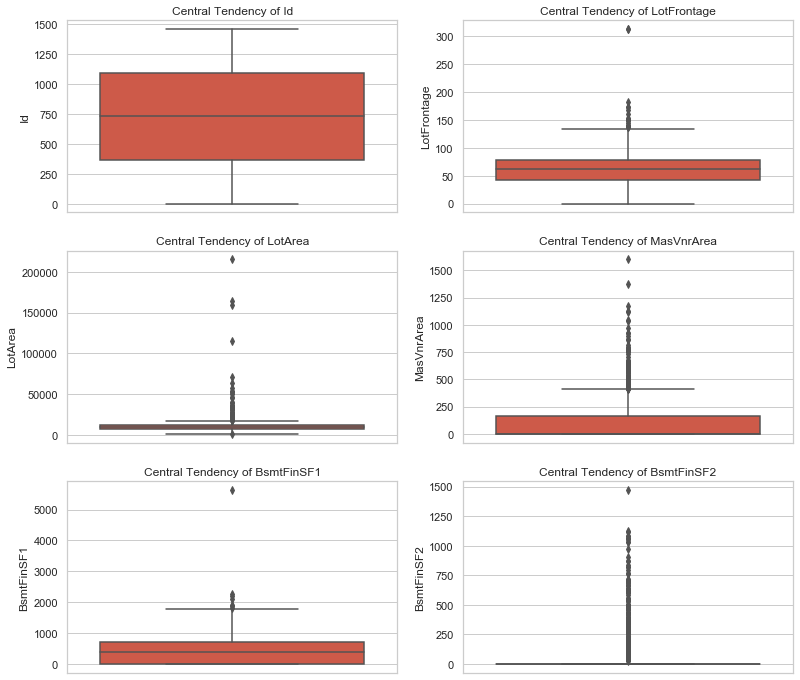

In [76]:
# m_box_plt is local function which takes a df, rows, columns of subplot and name of columns as an argument and 
# plots box plots
# Part-1
m_box_plt(h_df,3,2,*list(h_num_li[0:6]))

In [77]:
# Inspect the columns more in detail for outliers
h_df[["LotFrontage","LotArea","MasVnrArea","BsmtFinSF1","BsmtFinSF2"]].describe(q_li)

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2
count,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000
mean,57.604524,10516.733379,102.984921,443.173406,46.252913
std,34.668772,9984.686620,180.722710,455.906182,160.976401
min,0.000000,1300.000000,0.000000,0.000000,0.000000
1%,0.000000,1680.000000,0.000000,0.000000,0.000000
5%,0.000000,3307.400000,0.000000,0.000000,0.000000
25%,42.000000,7549.000000,0.000000,0.000000,0.000000
50%,63.000000,9477.000000,0.000000,383.000000,0.000000
75%,79.000000,11603.000000,164.000000,712.000000,0.000000
95%,104.000000,17402.300000,456.000000,1274.000000,391.500000


__Observations__
  * As we observe, across all the columns there is sharp rise more than a standard deviation after 99.5th percentile. Hence I tried to drop all the rows beyond 99.5th percentile

In [78]:
# dorp the rows beyond 99.5 percentile
h_df = h_df[(h_df.LotArea < 37197) & (h_df.LotFrontage < 152) & (h_df.MasVnrArea < 1000) & (h_df.BsmtFinSF1 < 1754)  & (h_df.BsmtFinSF2 < 1050)]

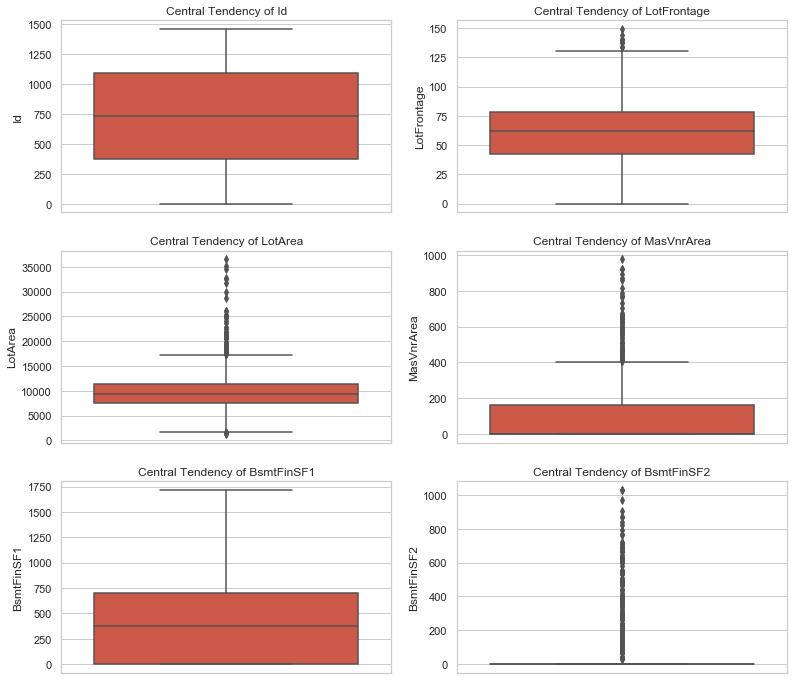

In [79]:
# m_box_plt is local function which takes a df, rows, columns of subplot and name of columns as an argument and 
# plots box plots
# Part-1
m_box_plt(h_df,3,2,*list(h_num_li[0:6]))

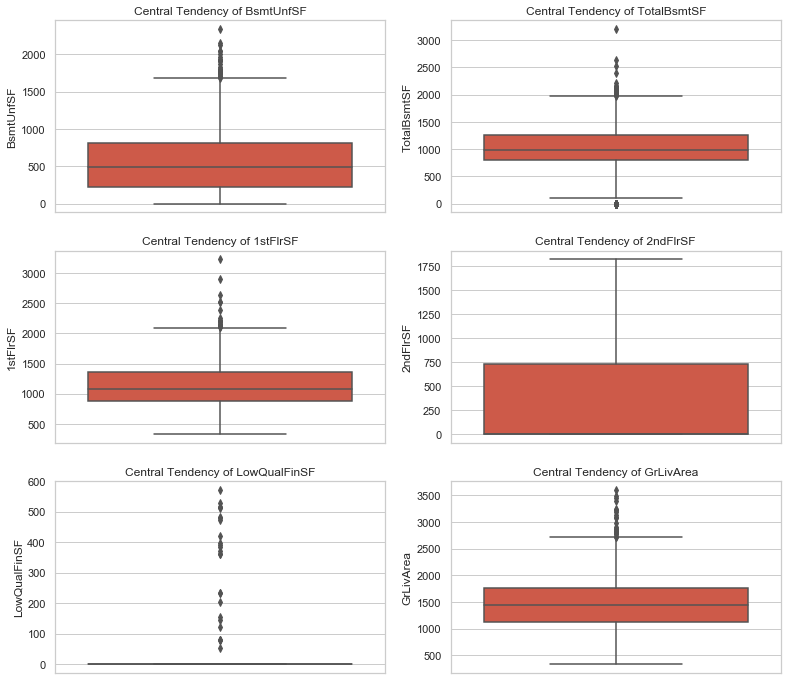

In [80]:
# Part-2
m_box_plt(h_df,3,2,*list(h_num_li[6:12]))

In [81]:
# Inspect the columns more in detail for outliers
h_df[["BsmtUnfSF","TotalBsmtSF","1stFlrSF","LowQualFinSF","GrLivArea"]].describe(q_li)

,BsmtUnfSF,TotalBsmtSF,1stFlrSF,LowQualFinSF,GrLivArea
count,1419.000000,1419.000000,1419.000000,1419.000000,1419.000000
mean,571.563777,1038.069767,1146.598309,5.737139,1493.684989
std,442.681551,398.708051,362.141165,48.233060,486.861846
min,0.000000,0.000000,334.000000,0.000000,334.000000
1%,0.000000,0.000000,520.000000,0.000000,691.540000
5%,0.000000,502.100000,672.000000,0.000000,848.000000
25%,226.000000,793.000000,876.000000,0.000000,1124.500000
50%,484.000000,982.000000,1077.000000,0.000000,1452.000000
75%,811.000000,1267.500000,1368.000000,0.000000,1763.000000
95%,1468.200000,1728.000000,1795.000000,0.000000,2414.300000


__Observations__
  * As we observe, across all the columns there is sharp rise more than a standard deviation after 99.5th percentile. Hence I tried to drop all the rows beyond 99.5th percentile

In [82]:
# drop the rows beyond 99.5 percentile
h_df = h_df[(h_df.TotalBsmtSF < 2200) & (h_df["1stFlrSF"] < 2216) & (h_df.LowQualFinSF < 350)]

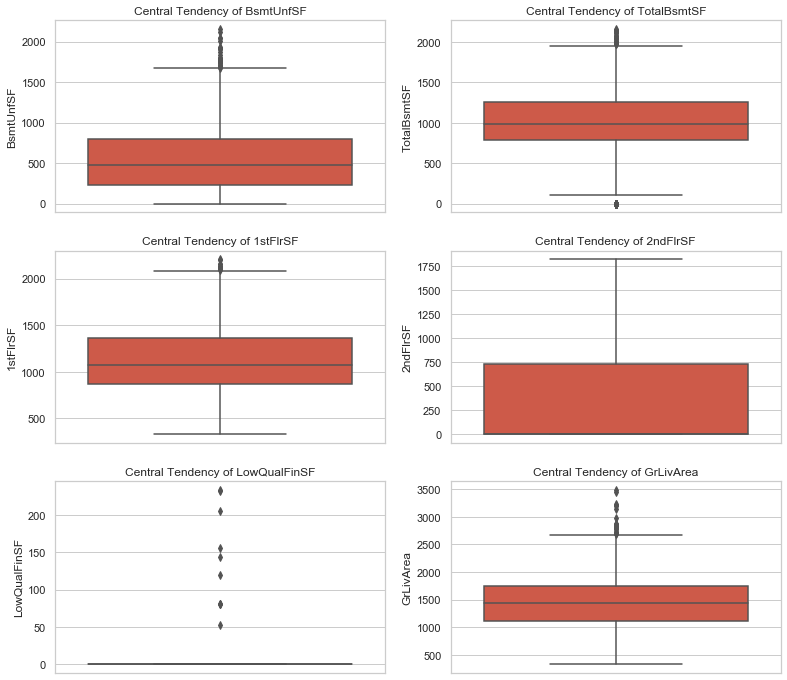

In [83]:
# Part-2
m_box_plt(h_df,3,2,*list(h_num_li[6:12]))

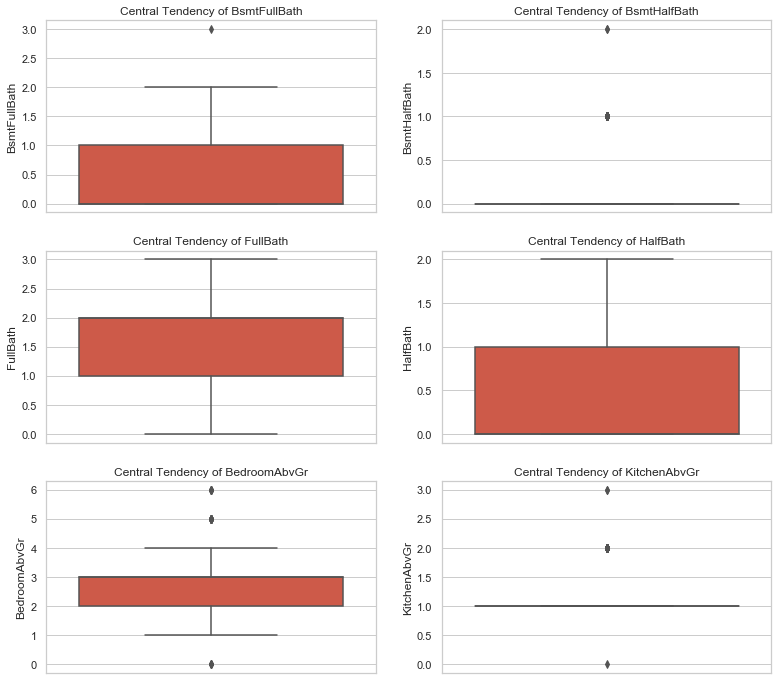

In [84]:
# Part-3
m_box_plt(h_df,3,2,*list(h_num_li[12:18]))

* __Observation:__
  1. __Features 'stroke','compressionratio', 'horsepower', 'peakrpm', 'citympg', 'highwaympg', 'price' have data spreading above 95th percentile and stroke and compressionratio have data below 5th percentile.__
  2. __The data here is one of the charactersistic of the car and can be extreme in sports cars or luxirious cars or very low in economical cars.Hence I dont consider them as outliers__
  3. __As our customer Geely Auto would like to have the price prediction of the car based on competitors and as we exactly do not know how Geely would like to introduce premium range of cars or low range of cars, I would keep the data as it is to get the best predictable model__

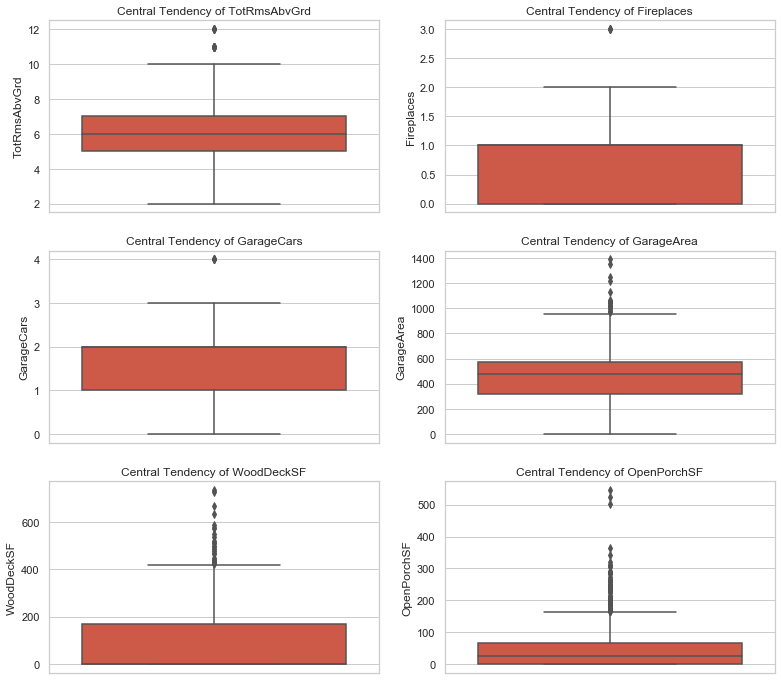

In [85]:
# Part-4
m_box_plt(h_df,3,2,*list(h_num_li[18:24]))

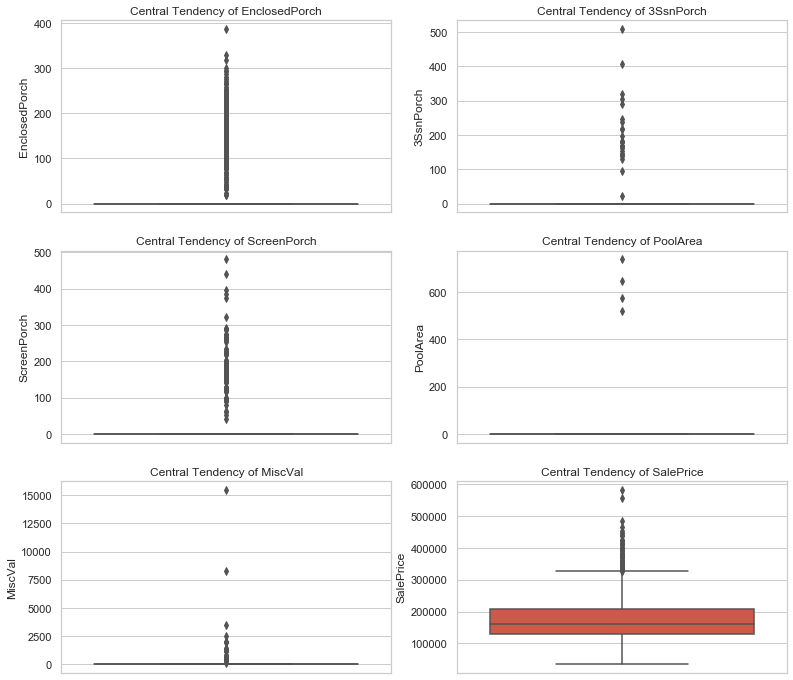

In [86]:
# Part-5
m_box_plt(h_df,3,2,*list(h_num_li[24:30]))

In [87]:
# Inspect the columns more in detail for outliers
h_df[h_num_li[24:30]].describe(q_li)

,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice
count,1396.000000,1396.000000,1396.000000,1396.000000,1396.000000,1396.000000
mean,21.431948,3.565903,14.279370,1.777221,44.336676,176449.622493
std,59.355068,29.972998,53.932754,33.454358,506.751932,71081.218806
min,0.000000,0.000000,0.000000,0.000000,0.000000,34900.000000
1%,0.000000,0.000000,0.000000,0.000000,0.000000,62313.850000
5%,0.000000,0.000000,0.000000,0.000000,0.000000,88000.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,129500.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,160000.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,208350.000000
95%,177.750000,0.000000,153.250000,0.000000,0.000000,319225.000000


__Observations__
  * As we observe, across all the columns there is sharp rise more than a standard deviation after 99.5th percentile. Hence I tried to drop all the rows beyond 99.5th percentile

In [88]:
# drop the rows beyond 99.5 percentile
h_df = h_df[(h_df.EnclosedPorch < 280) & (h_df["3SsnPorch"] < 217) & (h_df.ScreenPorch < 290) & (h_df.PoolArea < 400)]

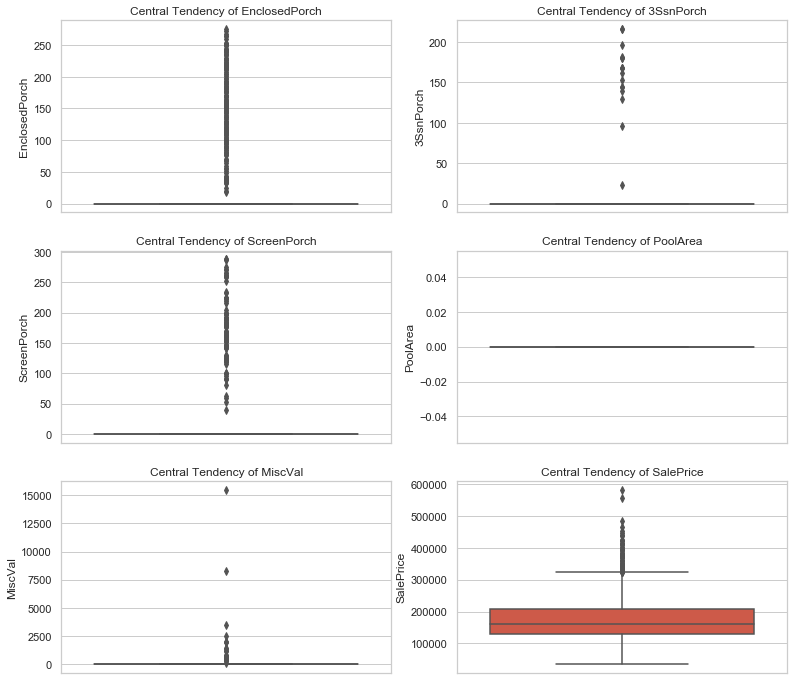

In [89]:
# Part-5
m_box_plt(h_df,3,2,*list(h_num_li[24:30]))

## Univariate analysis

### Univariate Analysis of Categorical Variables

In [90]:
# Inspect list of categorical variables
print(h_cat_li) 

['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']


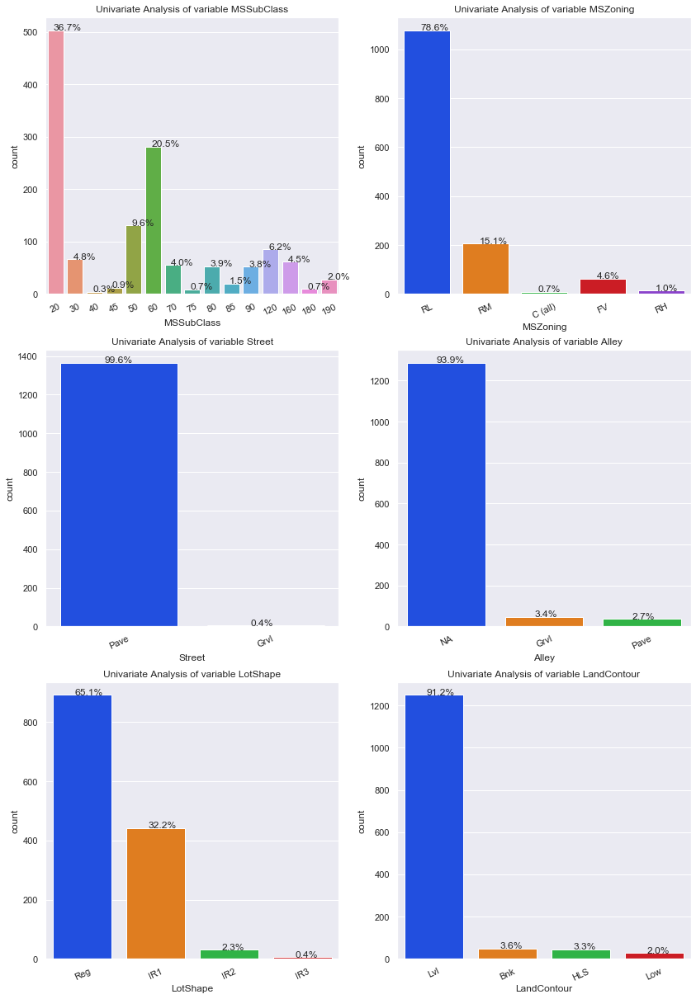

In [91]:
# cnt_plt is local function which takes a df, rows, columns of subplot and name of columns as an argument and 
# plots frequency  plots
# Part-1
cnt_plt(h_df,3,2,*h_cat_li[0:6])

__Inferences__
1. Majority of the houses are 1-STORY 1946 & NEWER ALL STYLES. 
2. 80% of the houses are in Residential Low Density
3. 99% of the houses can be accessed by Pavement. Hence this is not very important feature and this would be dropped.
4. Very few houses are accessed by Alley and need to check the correlation before dropping this feature.
5. 65% of the houses have regular shaping while 34% have irregular shaping
6. 91% of the flats are built with flat surface and very few have irregular surface.

In [92]:
# create a list of columns which needs to be dropped. These are the columns which might not add any value to our model
cols2drop= ["MSSubClass"]

# create a list of columns which correlation needs to be checked with target variable and then drop them
obs2drop = ["LandContour"]

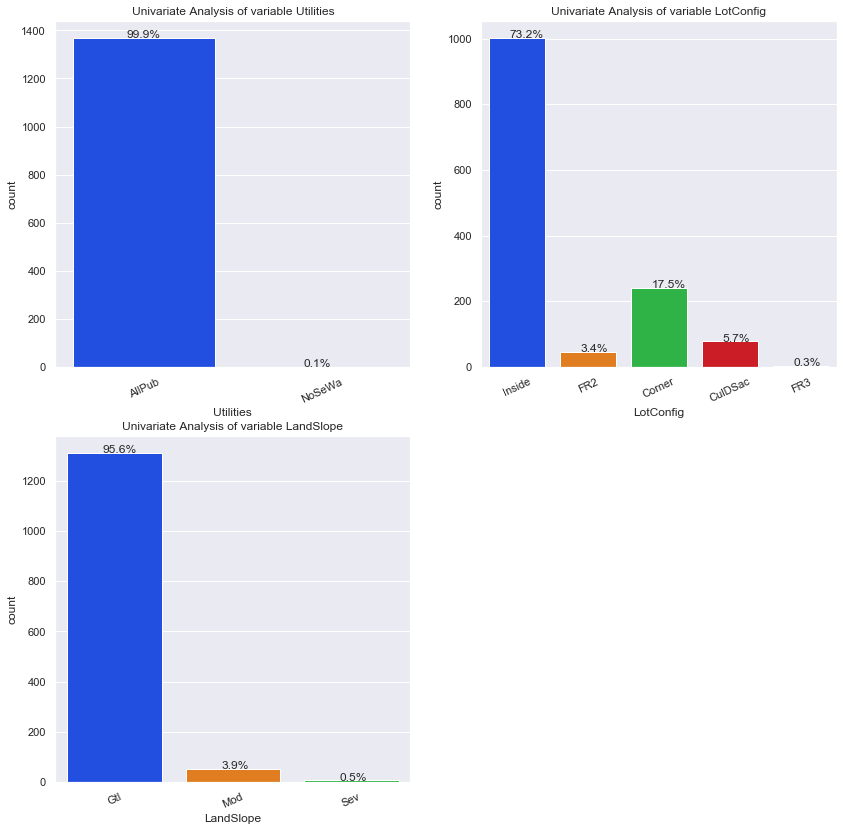

In [93]:
# Part 2
cnt_plt(h_df,2,2,*h_cat_li[6:9])

__Inferences__
1. 99% of the houses have Public utilities and only 1% of the houses do not have public utilities. Hence this can be dropped.
2. 75% of the houses have inside lot and remaining are distributed with others.
3. 95% of the hourse have gentle slope while others have moderate slope.

In [94]:
# update the list of the columns that needs to be dropped and also correlation needs to be checked
cols2drop.extend(["Utilities"])
obs2drop.extend(["LandSlope"])

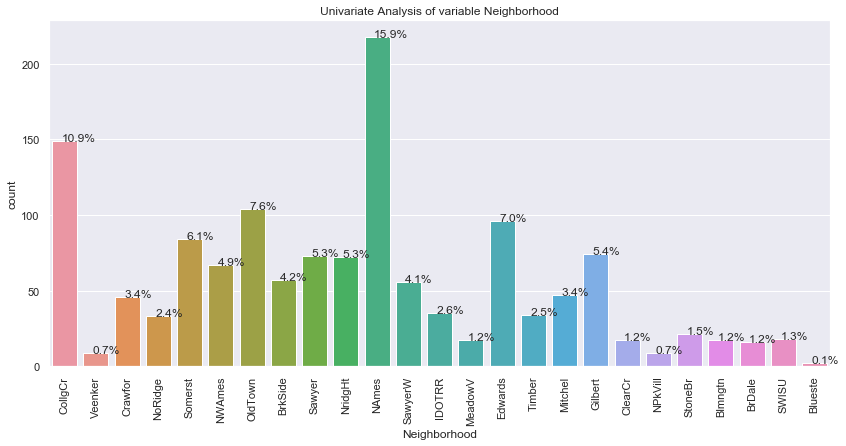

In [95]:
# Part 3
cnt_plt(h_df,2,1,h_cat_li[9])

__Inferences__
   1. North Ames has 16% of the total houses followed by College Creek. Remaining houses are distributed.

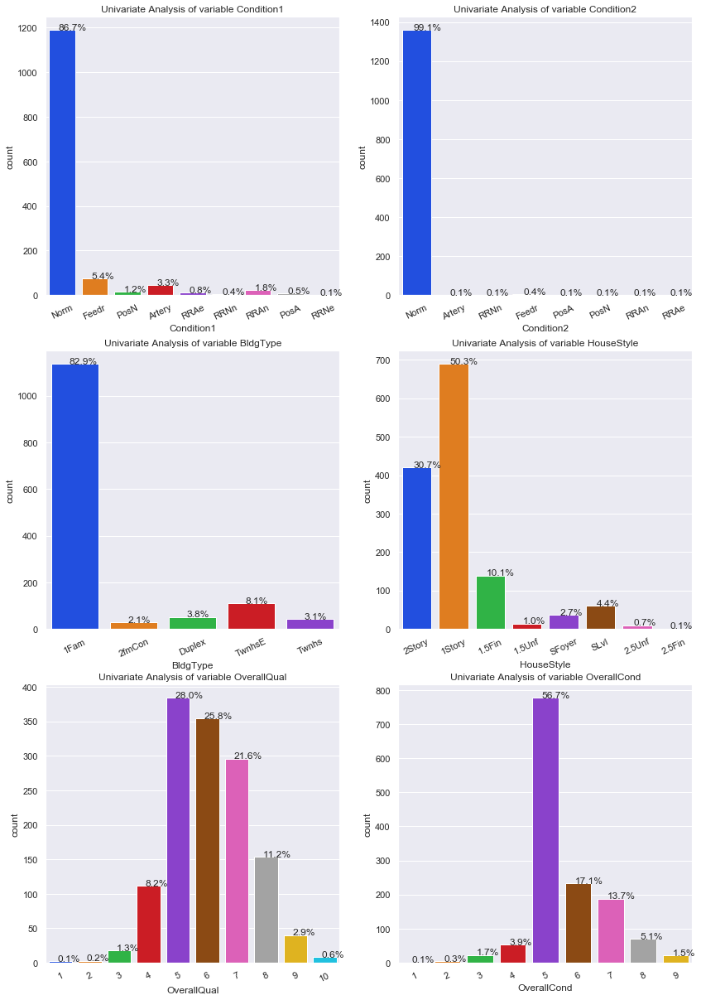

In [96]:
# Part 3
cnt_plt(h_df,3,2,*h_cat_li[10:16])

__Inferences__
1. Majority of the houses condition1 is Normal proximity. 
2. 99% of the houses have condition2 as Normal proximity. As there is no much variance, this column can be dropped.
3. 86% of the houses are single family detached and 8.1% are Townhouse end unit.
4. While 50% of the houses are 1 stroied, 31% of the houses are 2 storied followed by 1.5 storied.
5. Overall Quality of the houses is normally distributed with most of them peaked at averge and followed by littlie above average.
6. Nearly 95% of the houses condition is above average.

In [97]:
# update the list of the columns
cols2drop.extend(["Condition2"])

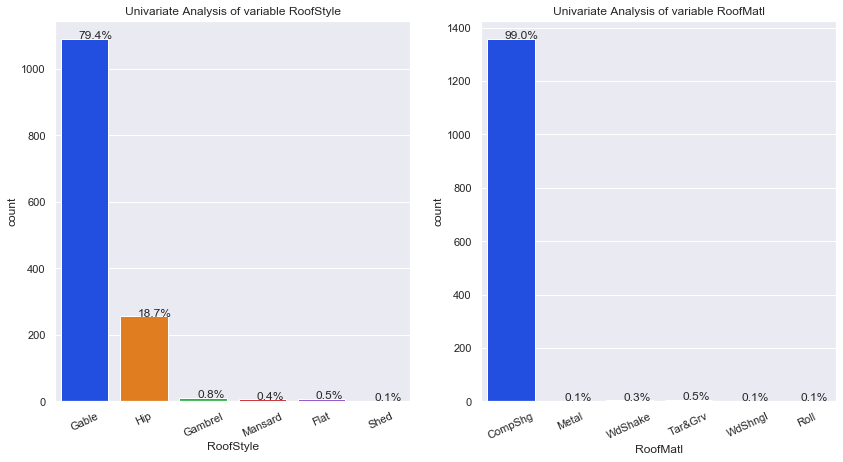

In [98]:
# Part 4
cnt_plt(h_df,1,2,*h_cat_li[16:18])

__Inferences__
1. 80% of the houses have Gabel roof and 19% of them have Hip style. 
2. 99% of the houses have Roof Material as Standard (Composite) Shingle. As there is no much variance, this column can be dropped.

In [99]:
# update the list of the columns
cols2drop.extend(["RoofMatl"])

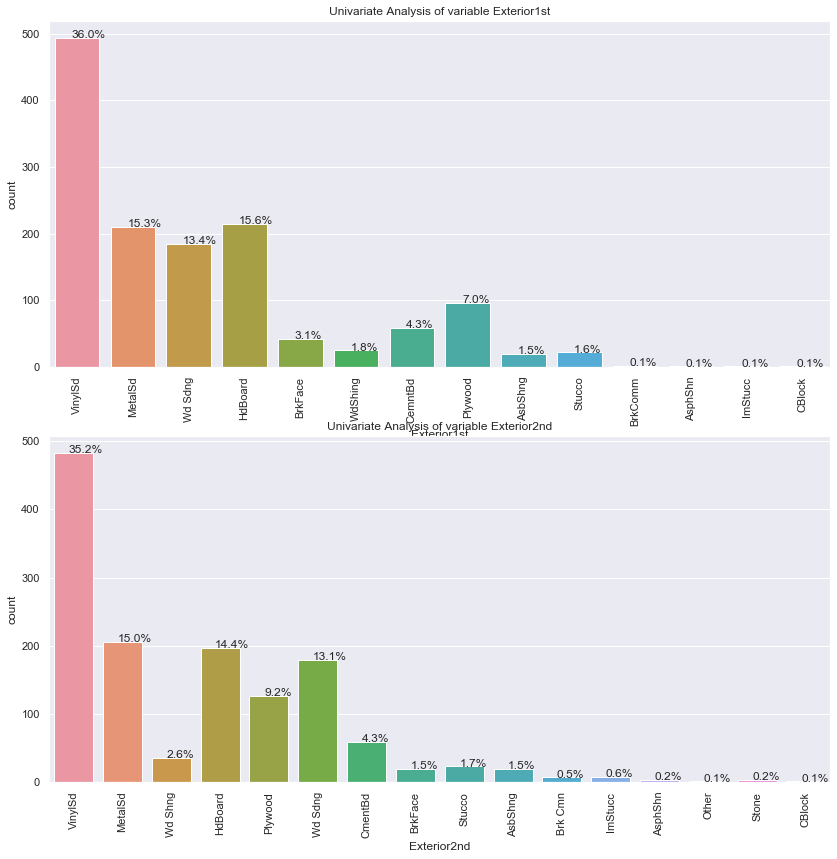

In [100]:
# Part 5
cnt_plt(h_df,2,1,*h_cat_li[18:20])

__Inferences__
1. Both Exterior1st and Exterior2nd have similar pattern with 36% of the houses with Vinyl Siding. We need to check with the target variable to see if there is any relation or not. If the relation is similar acorss both, one of the feature can be dropped.

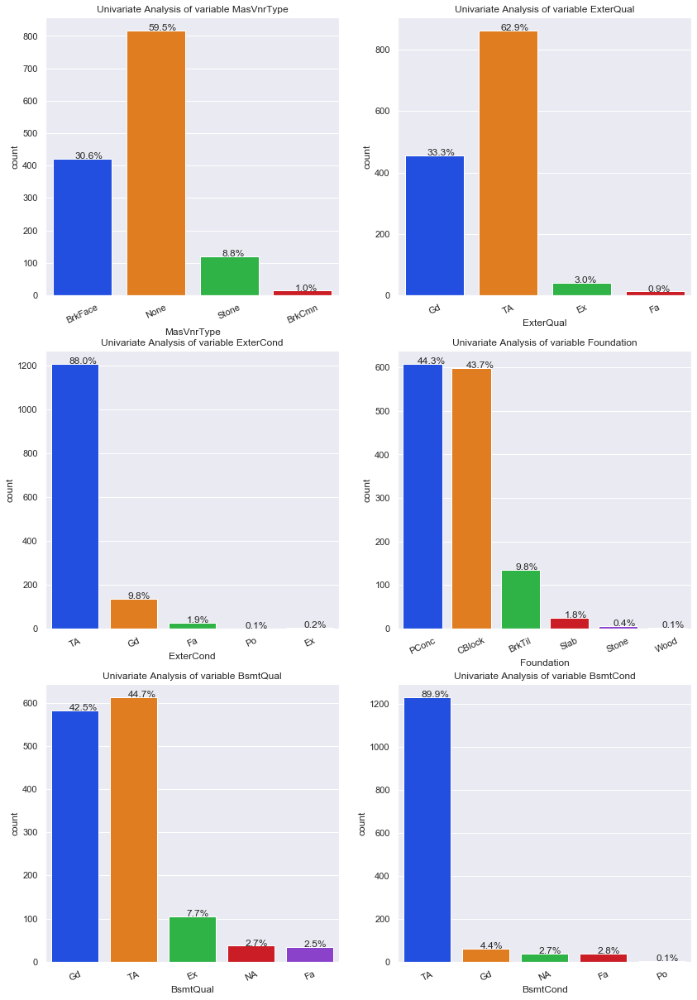

In [101]:
# Part 5
cnt_plt(h_df,3,2,*h_cat_li[20:26])

__Inferences__
1. While close to 60% of the houses dont have Masonry veneer type, 30% of them have Brick Face and 9% of them have Stone.
2. 95% of the houses have Exterior Quality either above average or good.Need to check the correlation with the target variable for Exteriar Quality variable.
3.  97% of the houses have Exterior Condition either above average or good.Need to check the correlation with the target variable for Exteriar Condition variable..
4. While 44% of the houses have Brick & Tile Foundation, 43% have Cinder Block foundation.
5. Close to 95% of the houses have height of the Basement from 80 to 100 CM.
6. Nearly 90% of the houses condition is above average. 

In [102]:
# update the list of the columns that needs to be dropped and also correlation needs to be checked
obs2drop.extend(["BsmtQual","BsmtCond"])

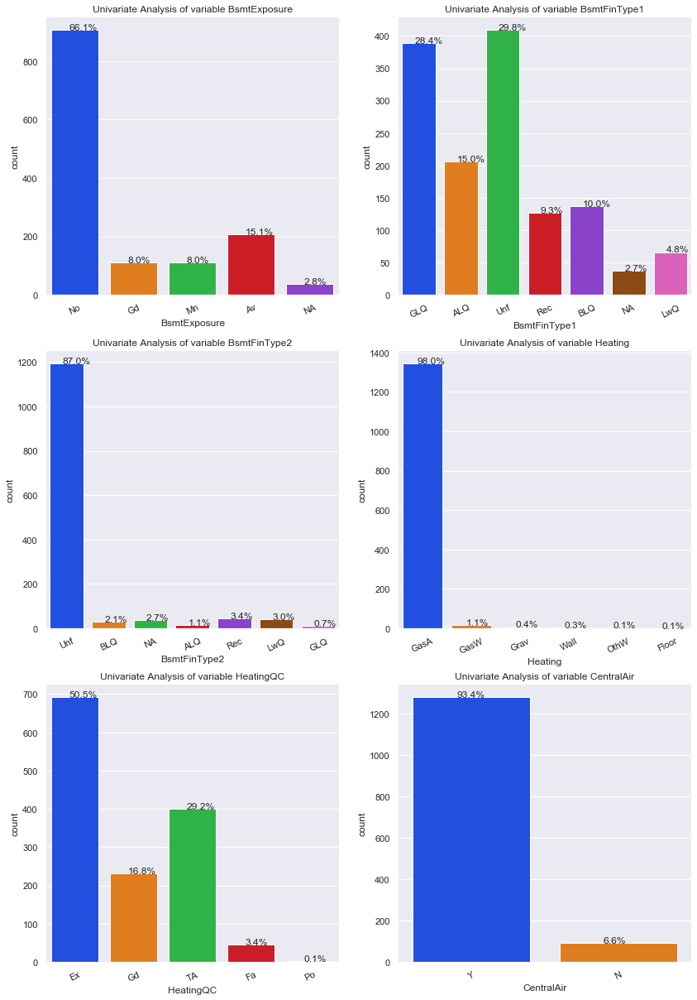

In [103]:
# Part 6
cnt_plt(h_df,3,2,*h_cat_li[26:32])

In [104]:
# update the list of the columns to be dropped
cols2drop.extend(["BsmtFinType2","Heating","CentralAir"])

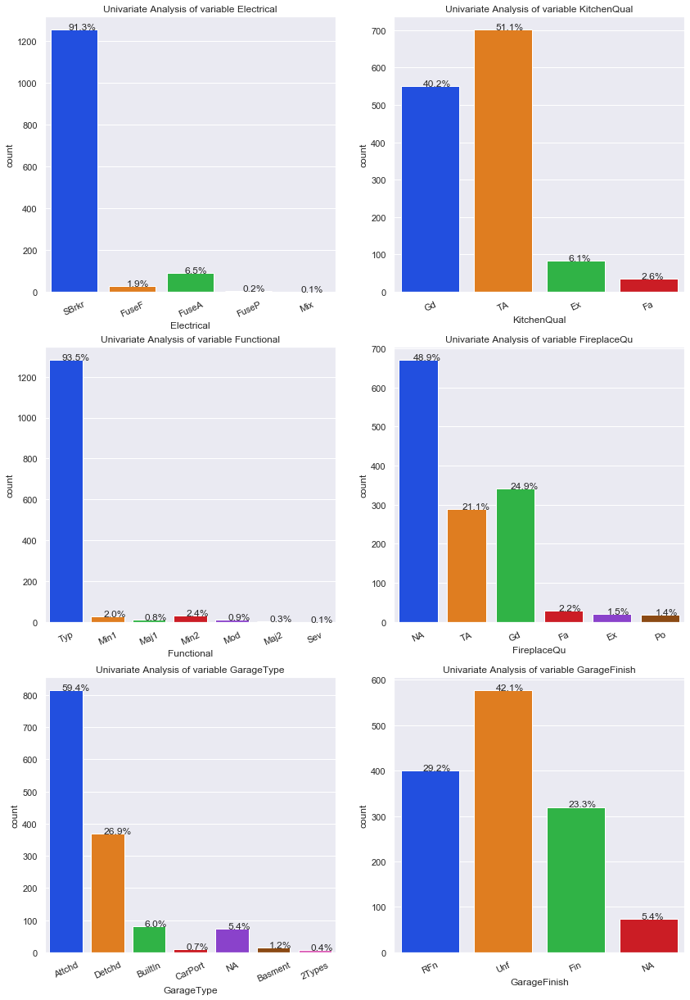

In [105]:
# Part 7
cnt_plt(h_df,3,2,*h_cat_li[32:38])

In [106]:
# update the list of the columns to be dropped
cols2drop.extend(["Electrical","Functional"])

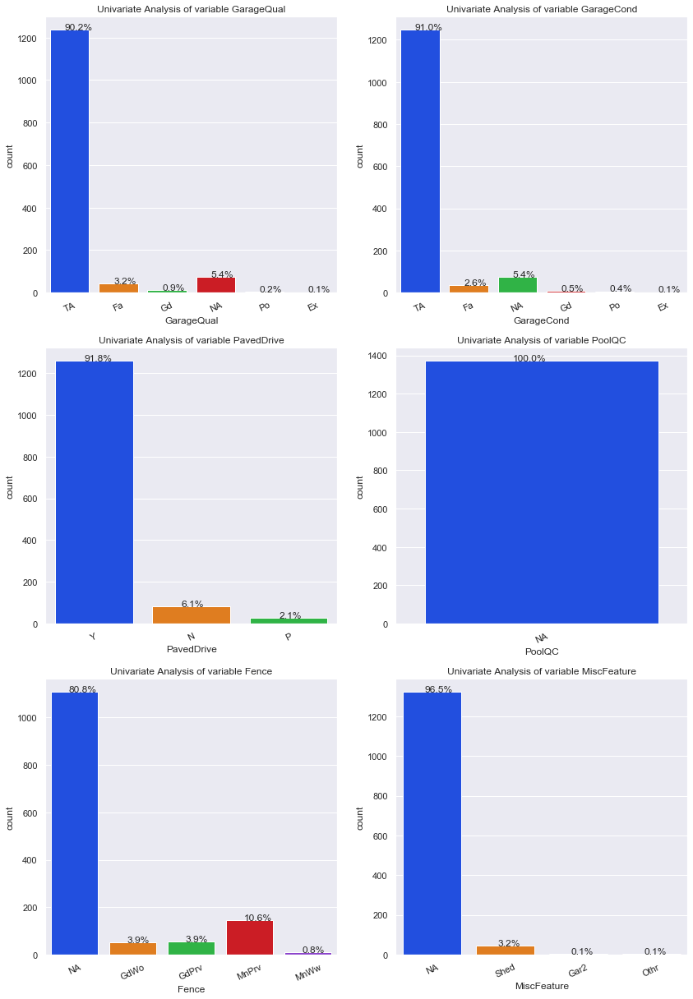

In [107]:
# Part 8
cnt_plt(h_df,3,2,*h_cat_li[38:44])

In [108]:
# update the list of the columns to be dropped
cols2drop.extend(["GarageQual","GarageCond","PavedDrive","PoolQC"])

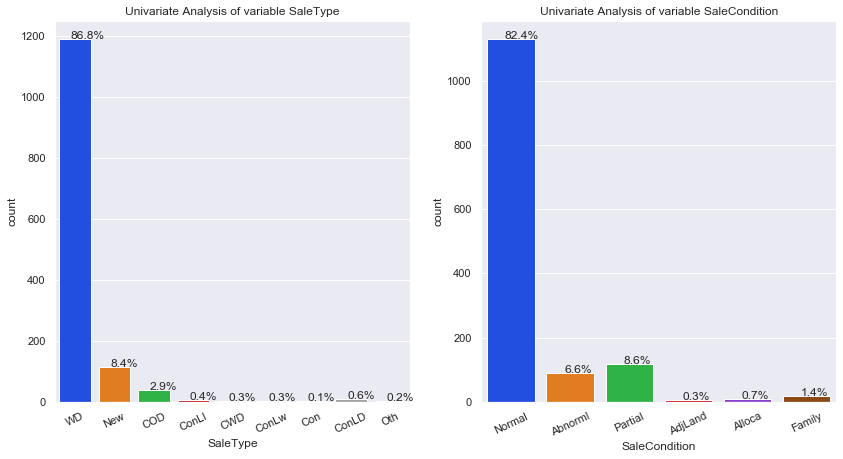

In [109]:
# Part 9
cnt_plt(h_df,1,2,*h_cat_li[44:50])

__Inferences__
1. Toyota has 15.6% of the cars in the current data set.
2. Nissan, Mazda, Honda and Mitsubishi have close to 6 to 8% of the cars in the current data set. 
3. Remaining is distributed with Mercury offerring only 1 in the data set.

### Univariate analysis of numerical variables

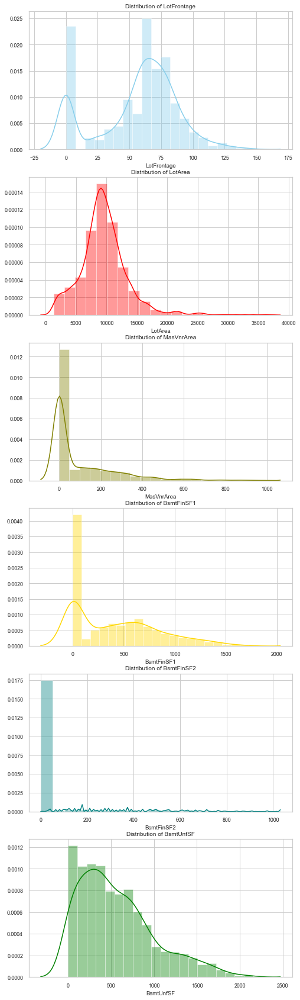

In [110]:
# dist_plt is local function which takes a df, rows, columns of subplot and name of columns as an argument and 
# plots distribution plots
# Part-1
dist_plt(h_df,6,1,*h_num_li[1:7])

__Inferences__
1. Lot frontage is not normally distributed
2. Lot Area, MasVnrArea,BsmtFinSF1,BsmtFinSF2 and BsmtUnfSF is skewed towards right

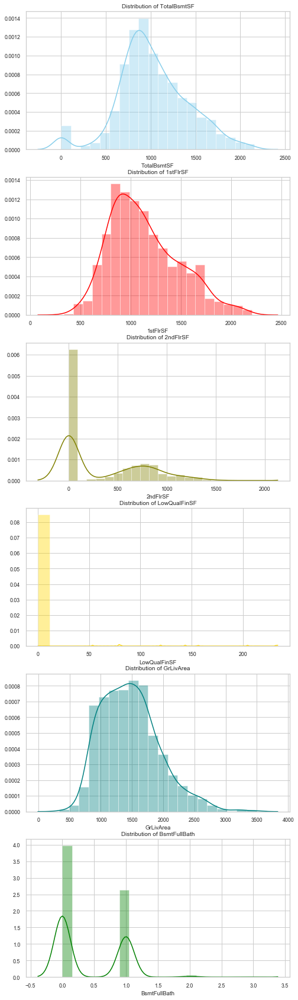

In [111]:
# Part-2
dist_plt(h_df,6,1,*list(h_num_li[7:13]))

__Inferences__
1. TotalBasmtSF is uniformly distributed and has peaked at 0
2. 1st Floor SF is normally distributed and right skewed
3. GrLivArea is normally distributed and has little right skewed
4. BsmtFullBath is peaked either 0 or 1 or 2

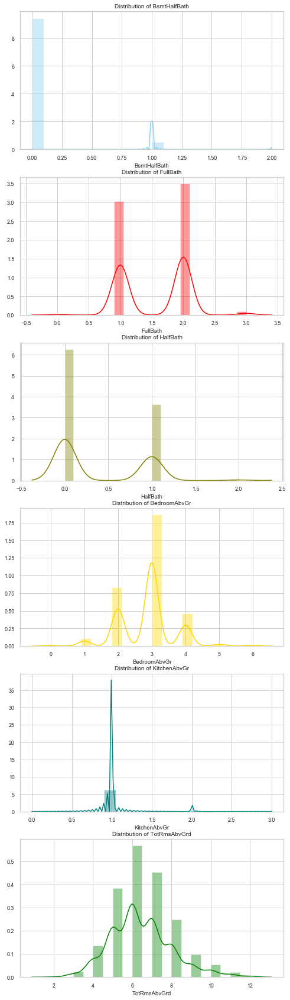

In [112]:
# Part-3
dist_plt(h_df,6,1,*list(h_num_li[13:19]))

__Inferences__
1. BsmthalfBath and Halfbath is either 0 or 1
2. Fullbath is either 1 or 2 or 3 
3. BedroomAbvGr is either 2 or 3 or 4
4. TotRmsAbvGrd is normally distributed

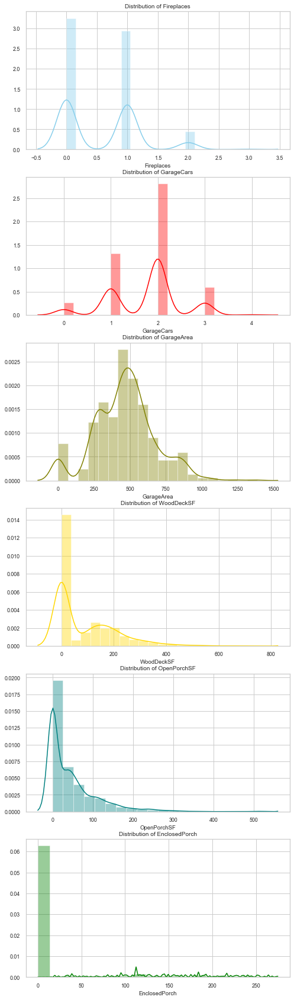

In [113]:
# Part-4
dist_plt(h_df,6,1,*list(h_num_li[19:25]))

__Inferences__
1. OpenPorchSF and WoodDeckSF are right skewed
2. No of Garage cars ranges from 0 to 3 
3. Concentration of EclosedPorch is 0 to 10
4. Garage Area is normally distributed when garage is present

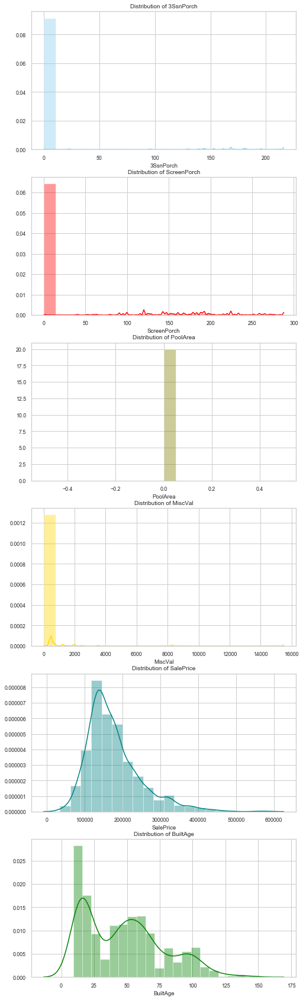

In [114]:
# Part-5
dist_plt(h_df,6,1,*list(h_num_li[25:31]))

__Inferences__
1. Target variable "Sale Price", is right skewed and the house prices ranges from 35000 to 582933.
2.3Snporch, ScreenPorch, Poolarea and Miscval are peaked at 0

In [115]:
# update the list of the columns to be dropped
cols2drop.extend(["PoolArea"])

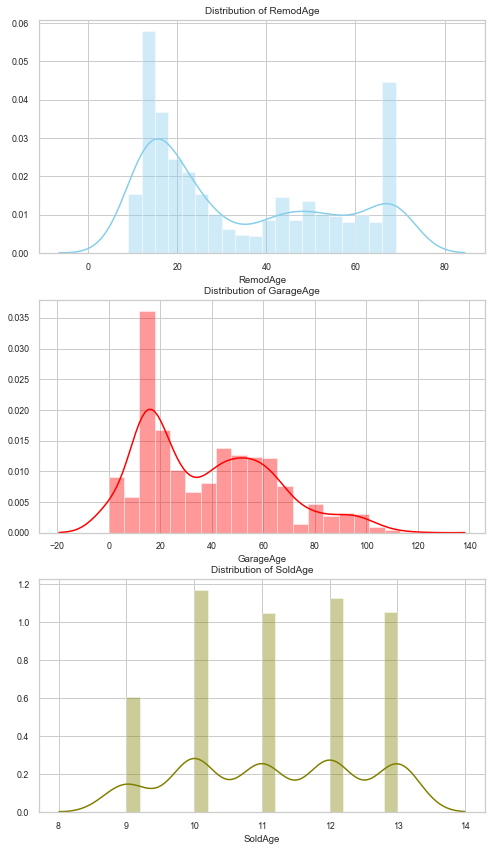

In [116]:
# Part-5
dist_plt(h_df,6,1,*list(h_num_li[31:37]))

__Inferences__
1. Age of the house ranges from 15 to 125 years
2. Remodelling age ranges from 10 to 70 years
3. Garage age ranges from 5 to 120 years
4. House Sold age ranges from 9 to 13 years

## Bivariate analysis

### Correlation of the numerical variables

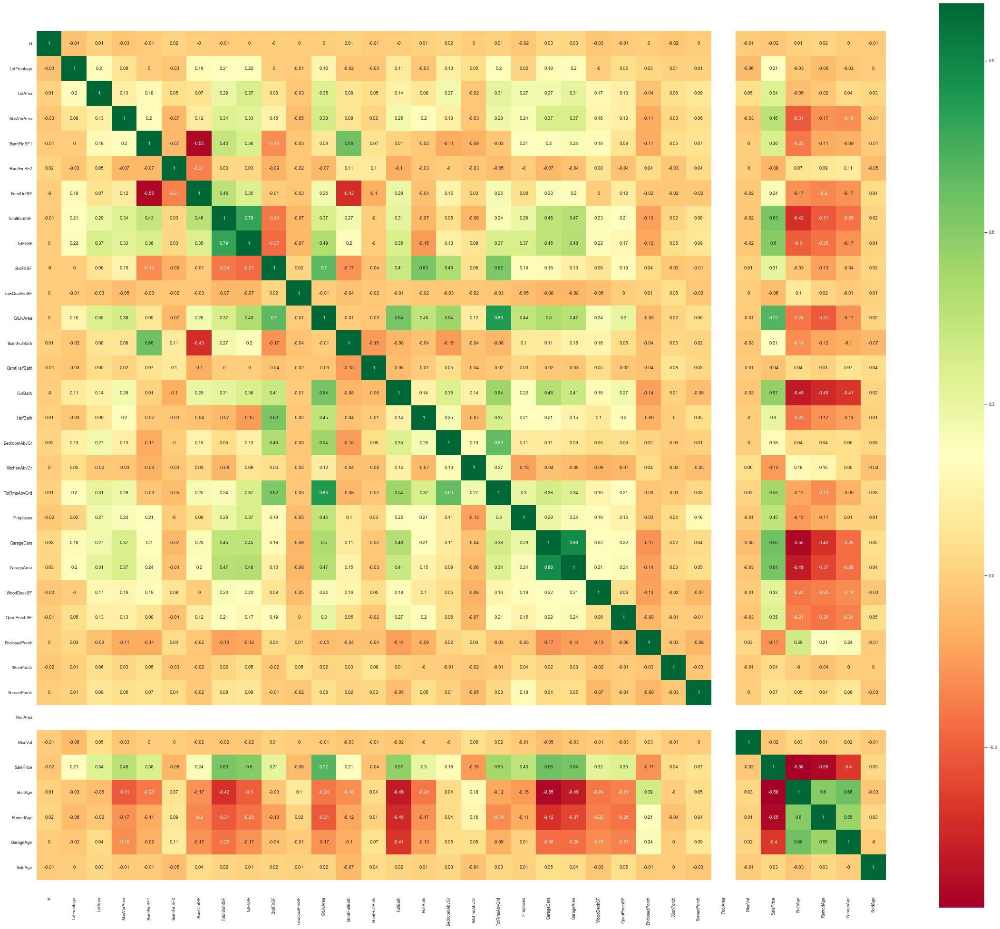

In [117]:
plt.figure(figsize=(40,35))
ax = sns.heatmap(round(h_df[h_num_li].corr(),2),cmap="RdYlGn", annot=True,square=True)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.show()

In [118]:
hs_price = round(h_df[h_num_li].corr(),2)
hs_price

,Id,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice,BuiltAge,RemodAge,GarageAge,SoldAge
Id,1.00,-0.04,0.01,-0.03,-0.01,0.02,-0.00,-0.01,0.00,-0.00,0.00,0.00,0.01,-0.01,-0.00,0.01,0.02,0.00,0.01,-0.02,0.03,0.03,-0.03,-0.01,0.00,-0.02,0.00,NaN,-0.01,-0.02,0.01,0.02,0.00,-0.01
LotFrontage,-0.04,1.00,0.20,0.08,0.00,-0.03,0.19,0.21,0.22,0.00,-0.01,0.16,-0.02,-0.03,0.11,-0.03,0.13,0.05,0.20,0.02,0.18,0.20,-0.00,0.05,0.03,0.01,0.01,NaN,-0.06,0.21,-0.03,-0.06,-0.02,0.00
LotArea,0.01,0.20,1.00,0.13,0.18,0.05,0.07,0.29,0.37,0.08,-0.03,0.35,0.08,0.05,0.14,0.09,0.27,-0.02,0.31,0.27,0.27,0.31,0.17,0.13,-0.04,0.06,0.09,NaN,0.05,0.34,-0.05,-0.02,0.04,0.03
MasVnrArea,-0.03,0.08,0.13,1.00,0.20,-0.07,0.12,0.34,0.33,0.15,-0.05,0.38,0.08,0.02,0.26,0.20,0.13,-0.03,0.28,0.24,0.37,0.37,0.16,0.13,-0.11,0.03,0.06,NaN,-0.03,0.46,-0.31,-0.17,-0.18,-0.01
BsmtFinSF1,-0.01,0.00,0.18,0.20,1.00,-0.07,-0.55,0.43,0.36,-0.19,-0.03,0.09,0.66,0.07,0.01,-0.02,-0.11,-0.09,-0.03,0.21,0.20,0.24,0.19,0.08,-0.11,0.05,0.07,NaN,0.00,0.36,-0.23,-0.11,-0.09,-0.01
BsmtFinSF2,0.02,-0.03,0.05,-0.07,-0.07,1.00,-0.21,0.03,0.03,-0.09,-0.02,-0.07,0.11,0.10,-0.10,-0.03,-0.00,-0.03,-0.05,-0.00,-0.07,-0.04,0.08,-0.04,0.04,-0.03,0.04,NaN,0.00,-0.08,0.07,0.09,0.11,-0.05
BsmtUnfSF,-0.00,0.19,0.07,0.12,-0.55,-0.21,1.00,0.46,0.35,-0.01,-0.03,0.26,-0.43,-0.10,0.29,-0.04,0.15,0.03,0.25,0.06,0.23,0.20,0.00,0.12,-0.02,-0.02,-0.02,NaN,-0.02,0.24,-0.17,-0.20,-0.17,0.04
TotalBsmtSF,-0.01,0.21,0.29,0.34,0.43,0.03,0.46,1.00,0.79,-0.24,-0.07,0.37,0.27,-0.00,0.31,-0.07,0.05,-0.08,0.24,0.29,0.45,0.47,0.23,0.21,-0.13,0.02,0.08,NaN,-0.02,0.63,-0.42,-0.31,-0.25,0.02
1stFlrSF,0.00,0.22,0.37,0.33,0.36,0.03,0.35,0.79,1.00,-0.27,-0.07,0.49,0.20,-0.00,0.36,-0.15,0.13,0.08,0.37,0.37,0.45,0.48,0.22,0.17,-0.12,0.05,0.09,NaN,-0.02,0.60,-0.30,-0.25,-0.17,0.01
2ndFlrSF,-0.00,0.00,0.08,0.15,-0.19,-0.09,-0.01,-0.24,-0.27,1.00,0.02,0.70,-0.17,-0.04,0.41,0.63,0.49,0.06,0.62,0.19,0.18,0.13,0.08,0.19,0.04,-0.02,-0.01,NaN,0.01,0.31,-0.03,-0.13,-0.04,0.02


In [119]:
# List the features that are positively correlated with SalePrice
print(color.BOLD+"Features that are positively correlated with Sale Price")
pv_corr = list(hs_price[(hs_price["SalePrice"] > 0.1)].SalePrice.sort_values(ascending=False).index)
display(hs_price[(hs_price["SalePrice"] > 0.1)].SalePrice.sort_values(ascending=False))
print(pv_corr)

Features that are positively correlated with Sale Price


SalePrice       1.00
GrLivArea       0.72
GarageCars      0.66
GarageArea      0.64
TotalBsmtSF     0.63
1stFlrSF        0.60
FullBath        0.57
TotRmsAbvGrd    0.53
MasVnrArea      0.46
Fireplaces      0.45
BsmtFinSF1      0.36
OpenPorchSF     0.35
LotArea         0.34
WoodDeckSF      0.32
2ndFlrSF        0.31
HalfBath        0.30
BsmtUnfSF       0.24
BsmtFullBath    0.21
LotFrontage     0.21
BedroomAbvGr    0.18
Name: SalePrice, dtype: float64

['SalePrice', 'GrLivArea', 'GarageCars', 'GarageArea', 'TotalBsmtSF', '1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 'MasVnrArea', 'Fireplaces', 'BsmtFinSF1', 'OpenPorchSF', 'LotArea', 'WoodDeckSF', '2ndFlrSF', 'HalfBath', 'BsmtUnfSF', 'BsmtFullBath', 'LotFrontage', 'BedroomAbvGr']


In [120]:
# List the features that are negatively correlated with SalePrice
print(color.BOLD+"Features that are negatively correlated with Sale Price")
nv_corr = list(hs_price[(hs_price["SalePrice"] < -0.1)].SalePrice.sort_values(ascending=False).index)
display(hs_price[(hs_price["SalePrice"] < -0.1)].SalePrice.sort_values(ascending=False))
print(nv_corr)

Features that are negatively correlated with Sale Price


KitchenAbvGr    -0.15
EnclosedPorch   -0.17
GarageAge       -0.40
RemodAge        -0.55
BuiltAge        -0.58
Name: SalePrice, dtype: float64

['KitchenAbvGr', 'EnclosedPorch', 'GarageAge', 'RemodAge', 'BuiltAge']


In [121]:
# List the features that are not correlated with SalePrice
print(color.BOLD+"Features that are not correlated with Sale Price")
no_corr = list(hs_price[(hs_price["SalePrice"] > -0.1) & (hs_price["SalePrice"] < 0.1)].SalePrice.index)
display(hs_price[(hs_price["SalePrice"] > -0.1) & (hs_price["SalePrice"] < 0.1)].SalePrice)
print(no_corr)

Features that are not correlated with Sale Price


Id             -0.02
BsmtFinSF2     -0.08
LowQualFinSF   -0.06
BsmtHalfBath   -0.04
3SsnPorch       0.04
ScreenPorch     0.07
MiscVal        -0.02
SoldAge         0.03
Name: SalePrice, dtype: float64

['Id', 'BsmtFinSF2', 'LowQualFinSF', 'BsmtHalfBath', '3SsnPorch', 'ScreenPorch', 'MiscVal', 'SoldAge']


In [122]:
# drop the columns which do not have any correlation with the target variable
cols2drop.extend(list(hs_price[(hs_price["SalePrice"] > -0.1) & (hs_price["SalePrice"] < 0.1)].SalePrice.index))
cols2drop

['MSSubClass',
 'Utilities',
 'Condition2',
 'RoofMatl',
 'BsmtFinType2',
 'Heating',
 'CentralAir',
 'Electrical',
 'Functional',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'PoolQC',
 'PoolArea',
 'Id',
 'BsmtFinSF2',
 'LowQualFinSF',
 'BsmtHalfBath',
 '3SsnPorch',
 'ScreenPorch',
 'MiscVal',
 'SoldAge']

### Correlation of the categorical variables with respect to Target variable "Price"

In [123]:
#  Function to plot 2 or more box plots
def comp_box_plt(l_df,n_r,n_c,l_dep,*args):
    j=1
    rot = 0
    if n_c == 1 and n_r == 1:
        rot = 90
    fig_h = n_r * 5
    plt.figure(1,figsize=(20,fig_h))
    # set palette 
    palette = itertools.cycle(sns.color_palette())
    sns.set(style="whitegrid",font_scale=1,palette='Set2')

    for i in args:
        plt.subplot(n_r,n_c,j)
        sns.boxplot(x=i,y=l_dep,orient="v",data=l_df)
        ax = sns.stripplot(x=i,y=l_dep, data=l_df, color="red", jitter=0.2, size=3)
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=rot)
        plt.title('{} spread across {}'.format(l_dep,i),fontsize=12)
        j+=1
    plt.show()    

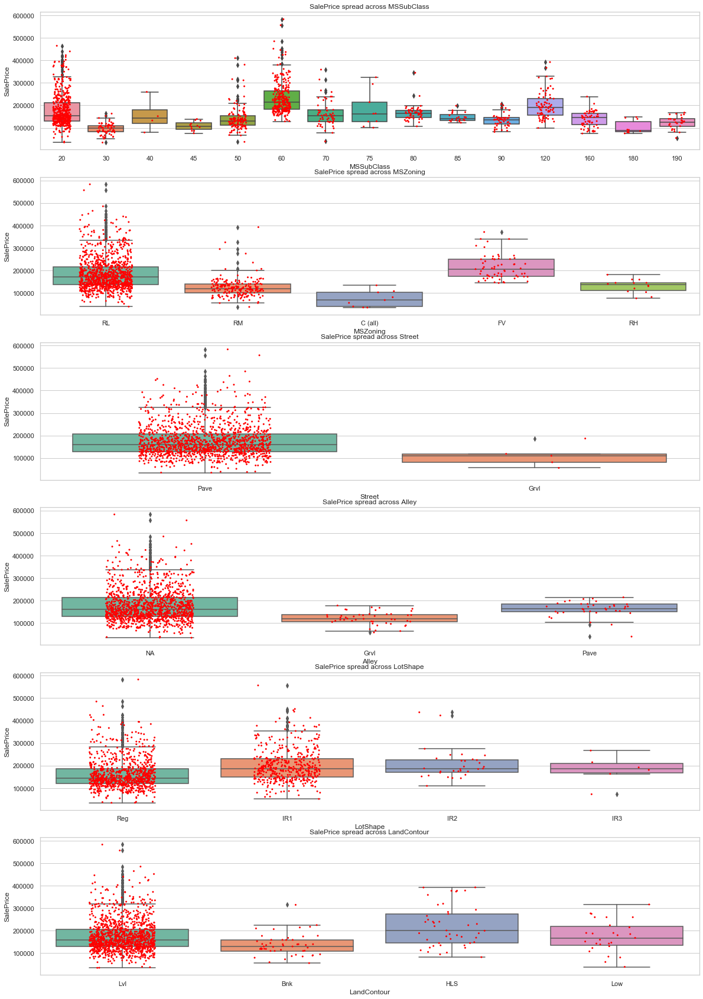

In [124]:
# comp_box_plt is local function which takes a df,target column, rows, columns of subplot and name of columns as an argument and 
# plots box plots
# correlation of price with other categorical variables
# Part-I
comp_box_plt(h_df,6,1,"SalePrice",*h_cat_li[0:6])

__Inferences__
1. Target variable SalesPrice is correlated with all the features except with LotShape

In [125]:
# update the list of the columns to be dropped
cols2drop.extend(["LotShape"])

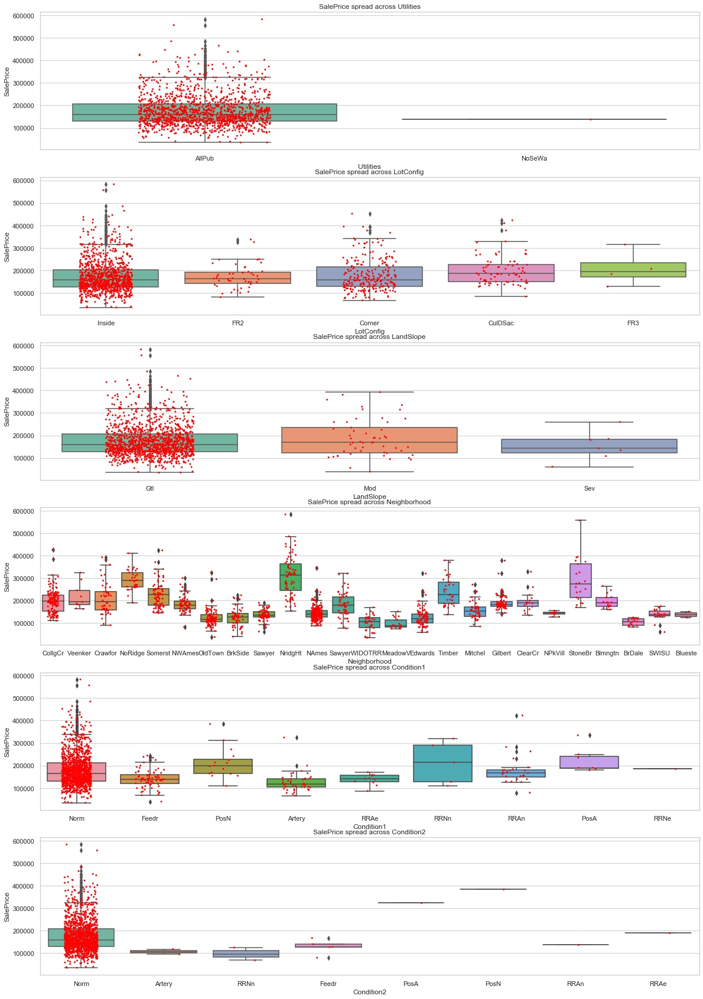

In [126]:
# Part-II
comp_box_plt(h_df,6,1,"SalePrice",*h_cat_li[6:12])

__Inferences__
1. Target variable SalesPrice is correlated with all the features except with LotConfig

In [127]:
# update the list of the columns to be dropped
cols2drop.extend(["LotConfig"])

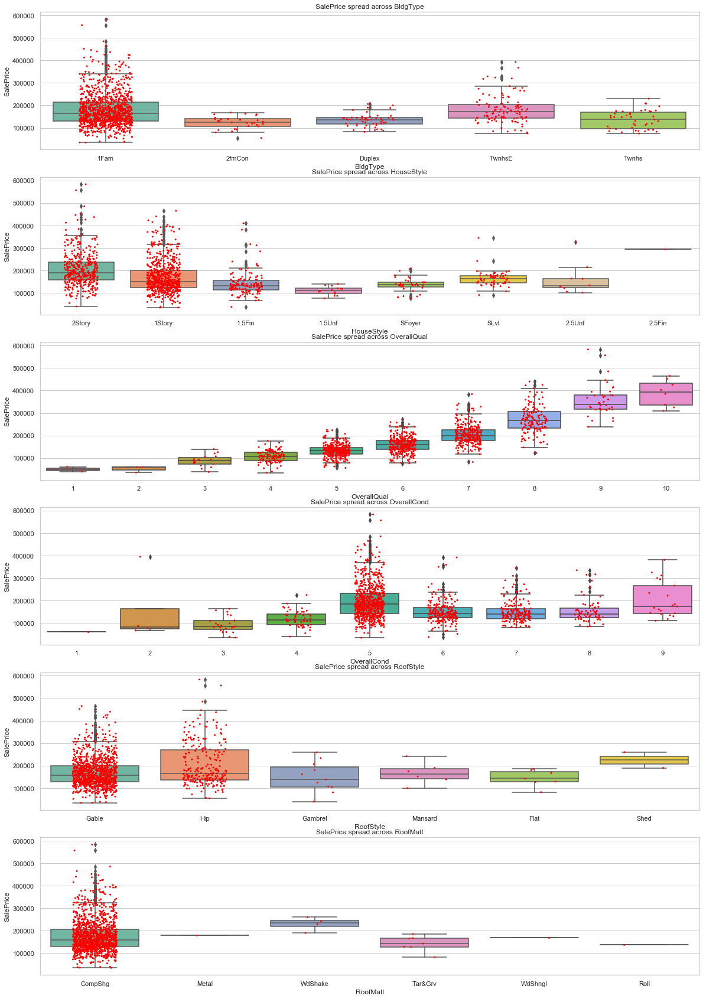

In [128]:
# Part-III
comp_box_plt(h_df,6,1,"SalePrice",*h_cat_li[12:18])

__Inferences__
1. Target variable SalesPrice is correlated with all the features in the above part.

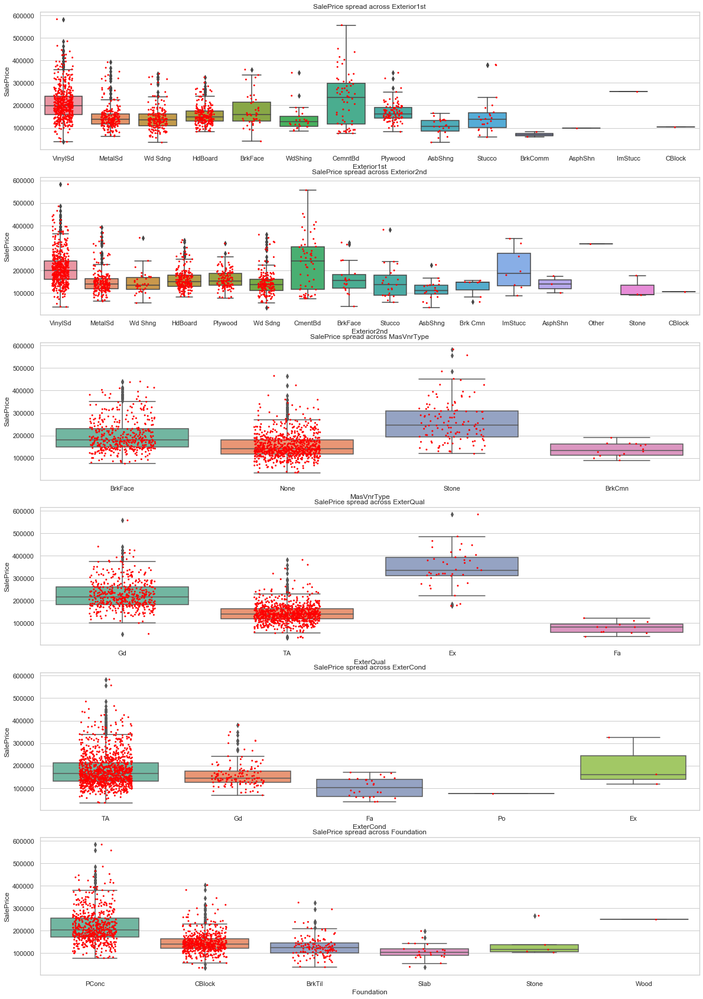

In [129]:
# Part-IV
comp_box_plt(h_df,6,1,"SalePrice",*h_cat_li[18:24])

__Inferences__
1. Target variable SalesPrice is correlated with all the features in the above part.

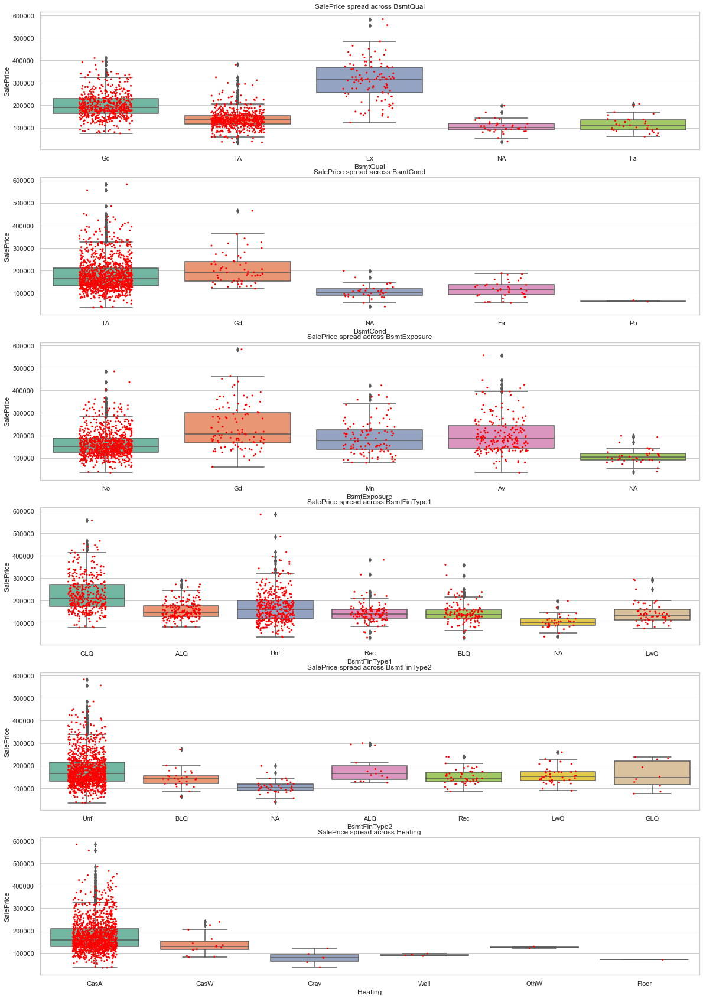

In [130]:
# Part-V
comp_box_plt(h_df,6,1,"SalePrice",*h_cat_li[24:30])

__Inferences__
1. Target variable SalesPrice is correlated with all the features in the above part.

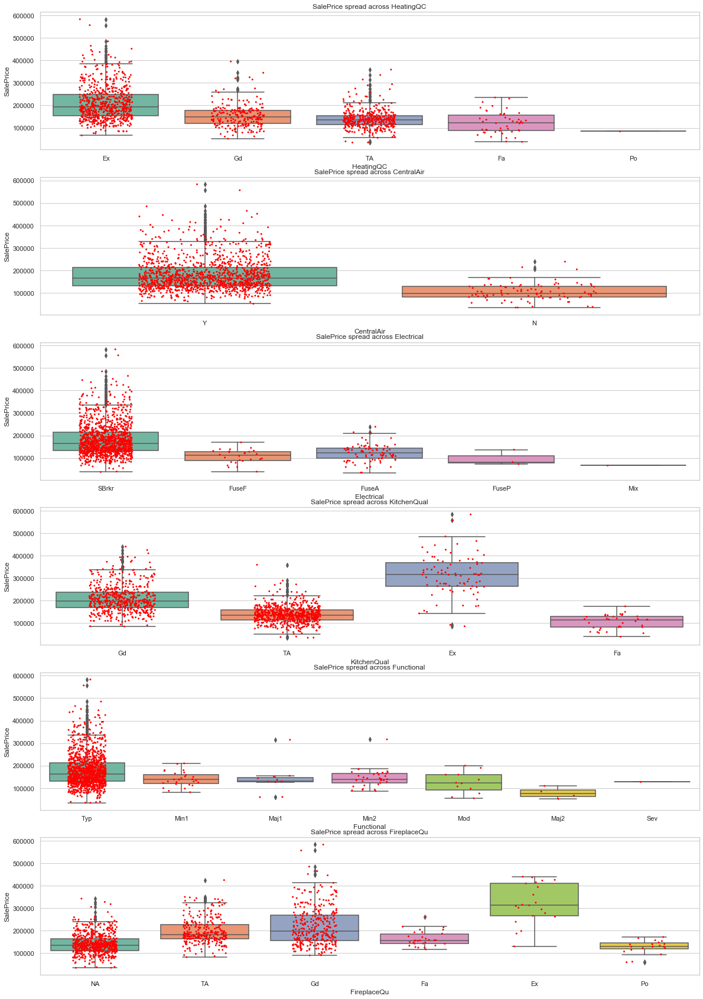

In [131]:
# Part-V
comp_box_plt(h_df,6,1,"SalePrice",*h_cat_li[30:36])

__Inferences__
1. Target variable SalesPrice is correlated with all the features in the above part.

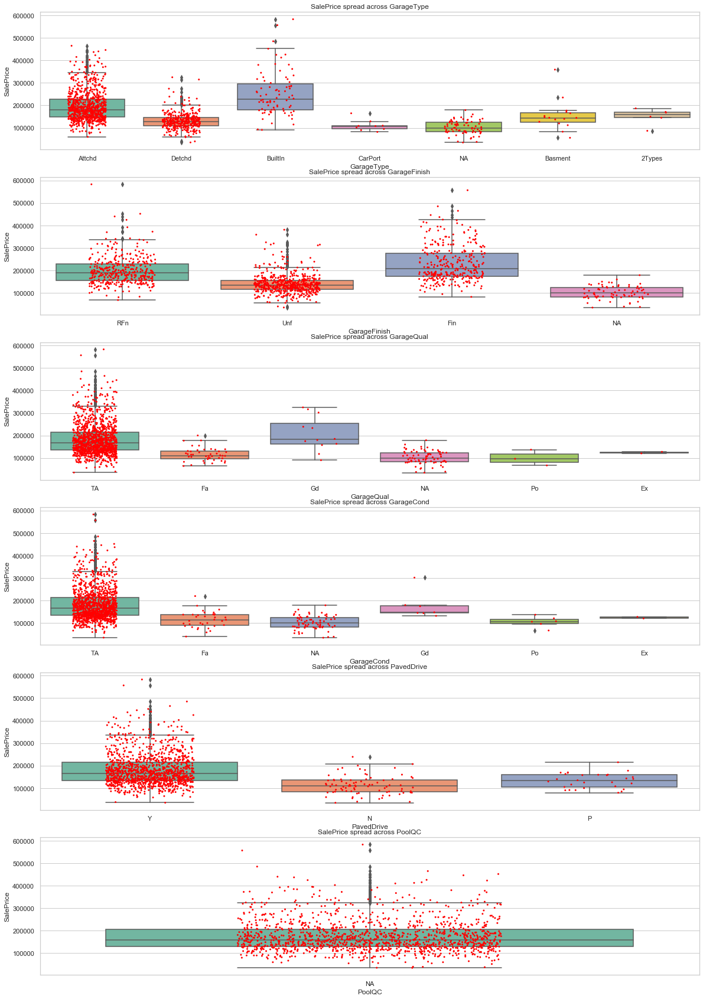

In [132]:
# Part-VI
comp_box_plt(h_df,6,1,"SalePrice",*h_cat_li[36:42])

__Inferences__
1. Target variable SalesPrice is correlated with all the features in the above part.

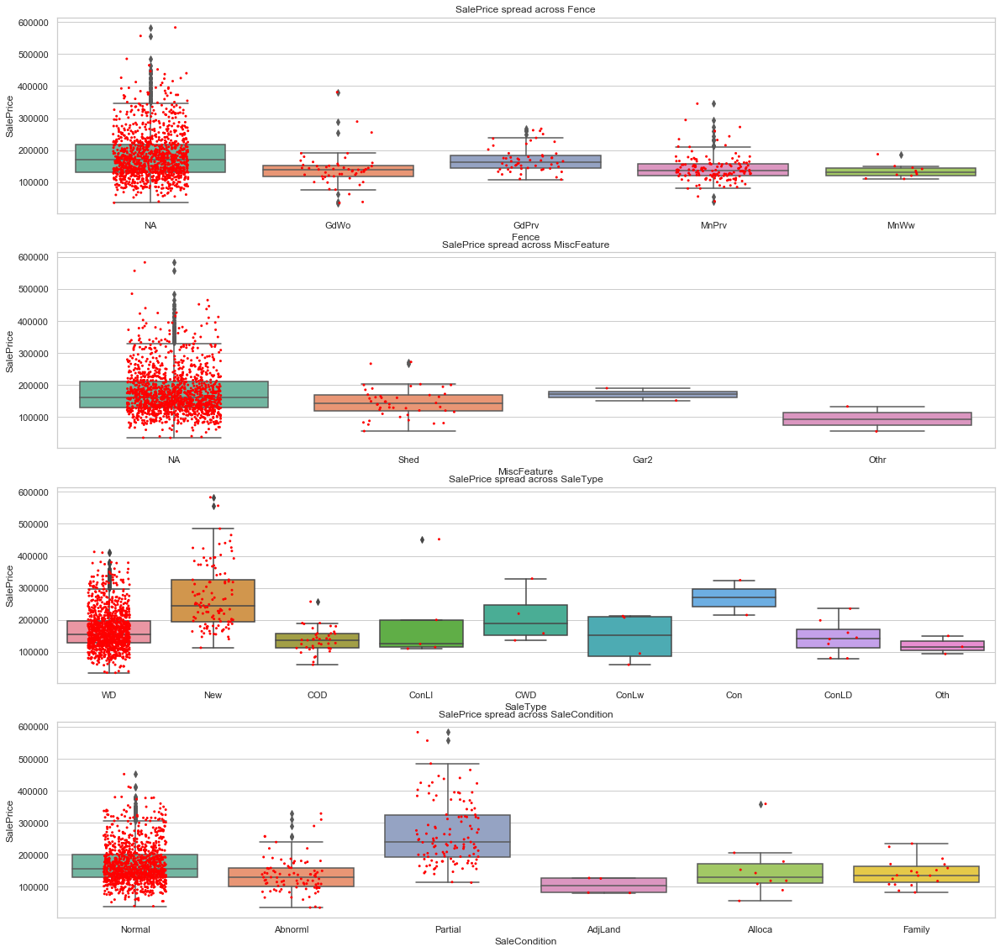

In [133]:
# Part-VII
comp_box_plt(h_df,6,1,"SalePrice",*h_cat_li[42:50])

__Inferences__
1. Target variable SalesPrice is correlated with all the features in the above part.

In [134]:
# Drop the columns which are not correlated with Target variable
h_df.drop(columns=cols2drop,inplace=True)

# Inspect the DF
h_df.head()

,MSZoning,LotFrontage,LotArea,Street,Alley,LandContour,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,Fence,MiscFeature,SaleType,SaleCondition,SalePrice,BuiltAge,RemodAge,GarageAge
0,RL,65.0,8450,Pave,NA,Lvl,Gtl,CollgCr,Norm,1Fam,2Story,7,5,Gable,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,150,856,Ex,856,854,1710,1,2,1,3,1,Gd,8,0,NA,Attchd,RFn,2,548,0,61,0,NA,NA,WD,Normal,208500,16,16,16.0
1,RL,80.0,9600,Pave,NA,Lvl,Gtl,Veenker,Feedr,1Fam,1Story,6,8,Gable,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,284,1262,Ex,1262,0,1262,0,2,0,3,1,TA,6,1,TA,Attchd,RFn,2,460,298,0,0,NA,NA,WD,Normal,181500,43,43,43.0
2,RL,68.0,11250,Pave,NA,Lvl,Gtl,CollgCr,Norm,1Fam,2Story,7,5,Gable,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,434,920,Ex,920,866,1786,1,2,1,3,1,Gd,6,1,TA,Attchd,RFn,2,608,0,42,0,NA,NA,WD,Normal,223500,18,17,18.0
3,RL,60.0,9550,Pave,NA,Lvl,Gtl,Crawfor,Norm,1Fam,2Story,7,5,Gable,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,540,756,Gd,961,756,1717,1,1,0,3,1,Gd,7,1,Gd,Detchd,Unf,3,642,0,35,272,NA,NA,WD,Abnorml,140000,104,49,21.0
4,RL,84.0,14260,Pave,NA,Lvl,Gtl,NoRidge,Norm,1Fam,2Story,8,5,Gable,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,490,1145,Ex,1145,1053,2198,1,2,1,4,1,Gd,9,1,TA,Attchd,RFn,3,836,192,84,0,NA,NA,WD,Normal,250000,19,19,19.0


In [135]:
# Update the list of numerical and categorical variables for future analysis
h_num_li = list(h_df.select_dtypes(include=np.number).columns)
h_cat_li = list(h_df.select_dtypes(exclude=np.number).columns)
print(color.BOLD+"\nNumerical Columns -"+color.END,h_num_li)
print(color.BOLD+"\nCategorical Columns -"+color.END,h_cat_li)


Numerical Columns - ['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'SalePrice', 'BuiltAge', 'RemodAge', 'GarageAge']

Categorical Columns - ['MSZoning', 'Street', 'Alley', 'LandContour', 'LandSlope', 'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'HeatingQC', 'KitchenQual', 'FireplaceQu', 'GarageType', 'GarageFinish', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']


## Preparing the data for modelling(encoding,train-test split, rescaling etc)

### Encoding of Categorical variables

In [136]:
# Inspect the categorical variables
h_df[h_cat_li].head()

,MSZoning,Street,Alley,LandContour,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,FireplaceQu,GarageType,GarageFinish,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NA,Lvl,Gtl,CollgCr,Norm,1Fam,2Story,7,5,Gable,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Ex,Gd,NA,Attchd,RFn,NA,NA,WD,Normal
1,RL,Pave,NA,Lvl,Gtl,Veenker,Feedr,1Fam,1Story,6,8,Gable,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Ex,TA,TA,Attchd,RFn,NA,NA,WD,Normal
2,RL,Pave,NA,Lvl,Gtl,CollgCr,Norm,1Fam,2Story,7,5,Gable,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Ex,Gd,TA,Attchd,RFn,NA,NA,WD,Normal
3,RL,Pave,NA,Lvl,Gtl,Crawfor,Norm,1Fam,2Story,7,5,Gable,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Gd,Gd,Gd,Detchd,Unf,NA,NA,WD,Abnorml
4,RL,Pave,NA,Lvl,Gtl,NoRidge,Norm,1Fam,2Story,8,5,Gable,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Ex,Gd,TA,Attchd,RFn,NA,NA,WD,Normal


In [137]:
# Inspect no of lables in each of the categorical column
display({col:len(h_df[col].unique()) for col in h_df[h_cat_li].columns}) 

{'MSZoning': 5,
 'Street': 2,
 'Alley': 3,
 'LandContour': 4,
 'LandSlope': 3,
 'Neighborhood': 25,
 'Condition1': 9,
 'BldgType': 5,
 'HouseStyle': 8,
 'OverallQual': 10,
 'OverallCond': 9,
 'RoofStyle': 6,
 'Exterior1st': 14,
 'Exterior2nd': 16,
 'MasVnrType': 4,
 'ExterQual': 4,
 'ExterCond': 5,
 'Foundation': 6,
 'BsmtQual': 5,
 'BsmtCond': 5,
 'BsmtExposure': 5,
 'BsmtFinType1': 7,
 'HeatingQC': 5,
 'KitchenQual': 4,
 'FireplaceQu': 6,
 'GarageType': 7,
 'GarageFinish': 4,
 'Fence': 5,
 'MiscFeature': 4,
 'SaleType': 9,
 'SaleCondition': 6}

In [138]:
# Inspect no of lables in each of the categorical column
display({col:list(h_df[col].value_counts().index) for col in h_df[h_cat_li].columns}) 

{'MSZoning': ['RL', 'RM', 'FV', 'RH', 'C (all)'],
 'Street': ['Pave', 'Grvl'],
 'Alley': ['NA', 'Grvl', 'Pave'],
 'LandContour': ['Lvl', 'Bnk', 'HLS', 'Low'],
 'LandSlope': ['Gtl', 'Mod', 'Sev'],
 'Neighborhood': ['NAmes',
  'CollgCr',
  'OldTown',
  'Edwards',
  'Somerst',
  'Gilbert',
  'Sawyer',
  'NridgHt',
  'NWAmes',
  'BrkSide',
  'SawyerW',
  'Mitchel',
  'Crawfor',
  'IDOTRR',
  'Timber',
  'NoRidge',
  'StoneBr',
  'SWISU',
  'MeadowV',
  'Blmngtn',
  'ClearCr',
  'BrDale',
  'Veenker',
  'NPkVill',
  'Blueste'],
 'Condition1': ['Norm',
  'Feedr',
  'Artery',
  'RRAn',
  'PosN',
  'RRAe',
  'PosA',
  'RRNn',
  'RRNe'],
 'BldgType': ['1Fam', 'TwnhsE', 'Duplex', 'Twnhs', '2fmCon'],
 'HouseStyle': ['1Story',
  '2Story',
  '1.5Fin',
  'SLvl',
  'SFoyer',
  '1.5Unf',
  '2.5Unf',
  '2.5Fin'],
 'OverallQual': [5, 6, 7, 8, 4, 9, 3, 10, 2, 1],
 'OverallCond': [5, 6, 7, 8, 4, 3, 9, 2, 1],
 'RoofStyle': ['Gable', 'Hip', 'Gambrel', 'Flat', 'Mansard', 'Shed'],
 'Exterior1st': ['VinylSd',


__Segragation__
   -  __Ordinal Categorical Variables__ - OverallQual and OverallCond are ordinal categorical variables and are already represented as numbers. Hence there is no need for encoding.
   -  __Binary Categorical Variables__ - Street has only 2 unique values and I will use Binary Encoding. For Alley and LandSlope, I use mapping numbers from 0 to 2.
   -  __Create Dummies__ - For remaining categorical variables I plan to use pandas dummies for encdoing.

#### Encoding of Nominals - Binary Encoding

In [139]:
# Encoding of Nominals - Binary encoding
h_df["Street"] = h_df["Street"].map({'Pave':0,'Grvl':1})
h_df["Alley"] = h_df["Alley"].map({'NA':0,'Grvl':1,'Pave':2})
h_df["LandSlope"] = h_df["LandSlope"].map({'Gtl':0,'Mod':1,'Sev':2})

#### Encoding of Ordinals - OneHot Encoding

In [140]:
# Encoding of Nominals - Create Dummies
oht_li = [x for x in list(h_cat_li) if x not in ["OverallQual","OverallCond","Street","Alley","LandSlope"]]


h_df = pd.concat([h_df,pd.get_dummies(h_df[oht_li],prefix=oht_li, drop_first=True)],axis=1)

In [141]:
# list of one hot encoded variables
display(oht_li)

#drop the variables
h_df.drop(oht_li,axis=1,inplace=True)

#Inspect the df
h_df.head()

['MSZoning',
 'LandContour',
 'Neighborhood',
 'Condition1',
 'BldgType',
 'HouseStyle',
 'RoofStyle',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'HeatingQC',
 'KitchenQual',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'Fence',
 'MiscFeature',
 'SaleType',
 'SaleCondition']

,LotFrontage,LotArea,Street,Alley,LandSlope,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,SalePrice,BuiltAge,RemodAge,GarageAge,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LandContour_HLS,LandContour_Low,LandContour_Lvl,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NA,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,BsmtFinType1_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_NA,MiscFeature_NA,MiscFeature_Othr,MiscFeature_Shed,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,65.0,8450,0,0,0,7,5,196.0,706,150,856,856,854,1710,1,2,1,3,1,8,0,2,548,0,61,0,208500,16,16,16.0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1,80.0,9600,0,0,0,6,8,0.0,978,284,1262,1262,0,1262,0,2,0,3,1,6,1,2,460,298,0,0,181500,43,43,43.0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
2,68.0,11250,0,0,0,7,5,162.0,486,434,920,920,866,1786,1,2,1,3,1,6,1,2,608,0,42,0,223500,18,17,18.0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1

### Correlation of the variables after encoding

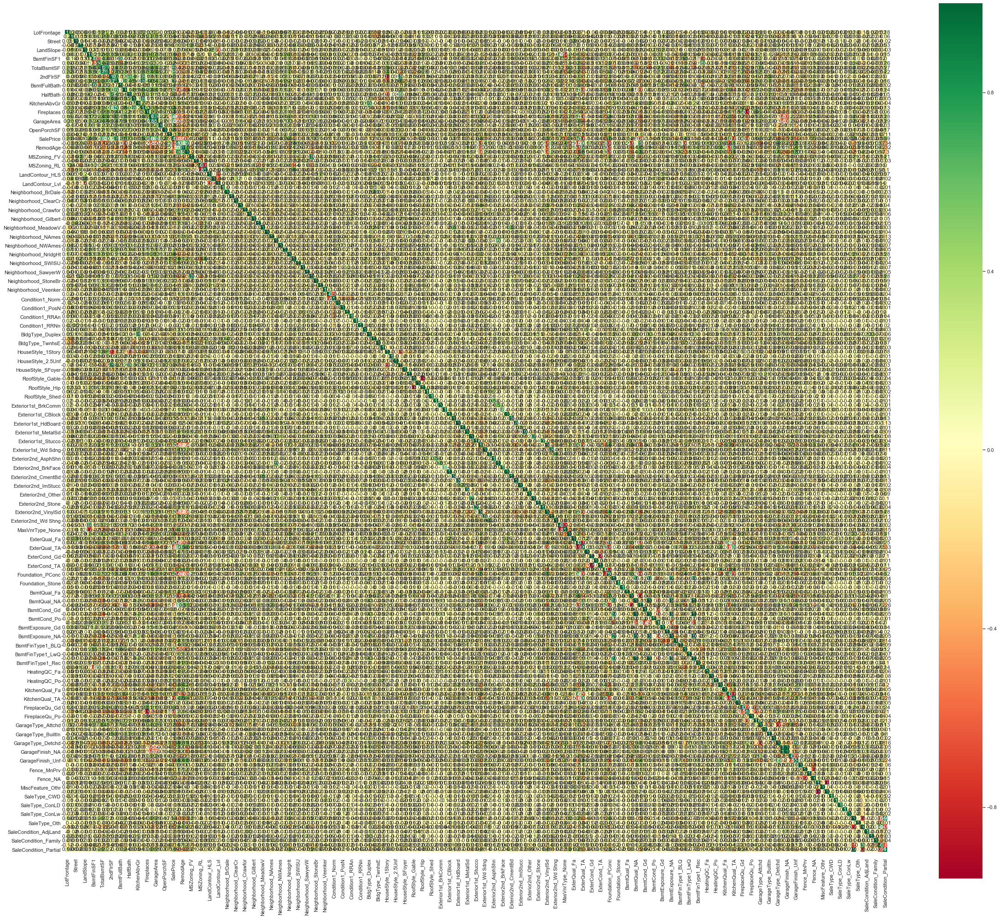

In [142]:
# Plot the heatmap
plt.figure(figsize=(40,35))
ax = sns.heatmap(round(h_df.corr(),2),cmap="RdYlGn", annot=True,square=True)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.show()

In [143]:
# create a df with correlation matrix
hs_df = round(h_df.corr(),2)
hs_df

,LotFrontage,LotArea,Street,Alley,LandSlope,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,SalePrice,BuiltAge,RemodAge,GarageAge,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LandContour_HLS,LandContour_Low,LandContour_Lvl,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NA,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,BsmtFinType1_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_NA,MiscFeature_NA,MiscFeature_Othr,MiscFeature_Shed,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
LotFrontage,1.00,0.20,0.05,-0.06,-0.06,0.08,0.00,0.19,0.21,0.22,0.00,0.16,-0.02,0.11,-0.03,0.13,0.05,0.20,0.02,0.18,0.20,-0.00,0.05,0.03,0.21,-0.03,-0.06,-0.02,-0.03,-0.04,0.13,-0.13,0.06,-0.08,-0.00,-0.04,-0.12,-0.04,-0.06,0.04,0.01,0.03,-0.09,-0.00,-0.11,-0.04,0.06,-0.08,-0.06,0.07,0.17,0.03,-0.02,-0.07,0.04,0.02,-0.02,0.05,-0.05,0.02,-0.02,-0.02,-0.08,-0.02,0.01,0.02,0.02,0.03,0.05,-0.19,-0.21,-0.02,0.06,0.03,-0.00,-0.02,-0.05,-0.03,-0.11,0.01,0.12,0.06,-0.07,0.02,0.02,0.03,0.03,-0.02,-0.08,0.03,-0.03,-0.09,-0.02,0.13,-0.01,0.02,0.03,-0.04,0.01,0.03,-0.02,-0.08,0.01,-0.04,0.01,-0.07,0.00,-0.02,0.13,0.01,-0.03,-0.04,-0.03,0.12,0.03,0.07,-0.11,-0.00,-0.06,-0.00,0.06,-0.05,0.06,-0.02,0.02,-0.05,0.02,-0.07,-0.01,-0.04,0.00,-0.01,-0.03,0.00,0.03,0.02,-0.01,-0.05,-0.04,-0.00,-0.04,-0.01,0.05,0.06,-0.05,-0.03,-0.01,-0.06,0.01,0.01,-0.08,-0.02,0.12,-0.03,-0.03,-0.09,0.09,0.01,-0.00,0.03,-0.08,-0.04,-0.04,0.07,-0.08,0.00,-0.01,0.02,0.00,0.03,0.01,-0.02,0.02,-0.01,0.03,0.01,-0.02,0.18,0.00,-0.15,-0.00,0.02,0.01,-0.12,0.18
LotArea,0.

In [144]:
# List the features that are positively correlated with SalePrice
print(color.BOLD+"Features that are positively correlated with Sale Price")
hs_pv_corr = list(hs_df[(hs_df["SalePrice"] > 0.1)].SalePrice.index)
display(hs_df[(hs_df["SalePrice"] > 0.1)].SalePrice)
print(hs_pv_corr)

Features that are positively correlated with Sale Price


LotFrontage              0.21
LotArea                  0.34
MasVnrArea               0.46
BsmtFinSF1               0.36
BsmtUnfSF                0.24
TotalBsmtSF              0.63
1stFlrSF                 0.60
2ndFlrSF                 0.31
GrLivArea                0.72
BsmtFullBath             0.21
FullBath                 0.57
HalfBath                 0.30
BedroomAbvGr             0.18
TotRmsAbvGrd             0.53
Fireplaces               0.45
GarageCars               0.66
GarageArea               0.64
WoodDeckSF               0.32
OpenPorchSF              0.35
SalePrice                1.00
MSZoning_FV              0.12
MSZoning_RL              0.25
LandContour_HLS          0.11
Neighborhood_CollgCr     0.11
Neighborhood_NoRidge     0.26
Neighborhood_NridgHt     0.44
Neighborhood_Somerst     0.18
Neighborhood_StoneBr     0.20
Neighborhood_Timber      0.14
Condition1_Norm          0.12
HouseStyle_2Story        0.26
RoofStyle_Hip            0.20
Exterior1st_CemntBd      0.15
Exterior1s

['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'SalePrice', 'MSZoning_FV', 'MSZoning_RL', 'LandContour_HLS', 'Neighborhood_CollgCr', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Neighborhood_Timber', 'Condition1_Norm', 'HouseStyle_2Story', 'RoofStyle_Hip', 'Exterior1st_CemntBd', 'Exterior1st_VinylSd', 'Exterior2nd_CmentBd', 'Exterior2nd_VinylSd', 'MasVnrType_BrkFace', 'MasVnrType_Stone', 'ExterQual_Gd', 'ExterCond_TA', 'Foundation_PConc', 'BsmtQual_Gd', 'BsmtCond_TA', 'BsmtExposure_Gd', 'BsmtFinType1_GLQ', 'KitchenQual_Gd', 'FireplaceQu_Gd', 'FireplaceQu_TA', 'GarageType_Attchd', 'GarageType_BuiltIn', 'GarageFinish_RFn', 'Fence_NA', 'SaleType_New', 'SaleCondition_Partial']


In [145]:
# List the features that are negatively correlated with SalePrice
print(color.BOLD+"Features that are negatively correlated with Sale Price")
hs_nv_corr = list(hs_df[(hs_df["SalePrice"] < -0.1)].SalePrice.index)
display(hs_df[(hs_df["SalePrice"] < -0.1)].SalePrice)
print(hs_nv_corr)

Features that are negatively correlated with Sale Price


KitchenAbvGr           -0.15
EnclosedPorch          -0.17
BuiltAge               -0.58
RemodAge               -0.55
GarageAge              -0.40
MSZoning_RM            -0.31
Neighborhood_BrDale    -0.11
Neighborhood_BrkSide   -0.15
Neighborhood_Edwards   -0.19
Neighborhood_IDOTRR    -0.17
Neighborhood_MeadowV   -0.12
Neighborhood_NAmes     -0.20
Neighborhood_OldTown   -0.21
Neighborhood_Sawyer    -0.13
Condition1_Feedr       -0.11
BldgType_2fmCon        -0.11
BldgType_Duplex        -0.12
RoofStyle_Gable        -0.18
Exterior1st_HdBoard    -0.11
Exterior1st_MetalSd    -0.16
Exterior1st_Wd Sdng    -0.19
Exterior2nd_MetalSd    -0.15
Exterior2nd_Wd Sdng    -0.17
MasVnrType_None        -0.40
ExterQual_Fa           -0.13
ExterQual_TA           -0.62
ExterCond_Fa           -0.14
Foundation_CBlock      -0.37
Foundation_Slab        -0.13
BsmtQual_Fa            -0.14
BsmtQual_NA            -0.16
BsmtQual_TA            -0.47
BsmtCond_NA            -0.16
BsmtExposure_NA        -0.16
BsmtExposure_N

['KitchenAbvGr', 'EnclosedPorch', 'BuiltAge', 'RemodAge', 'GarageAge', 'MSZoning_RM', 'Neighborhood_BrDale', 'Neighborhood_BrkSide', 'Neighborhood_Edwards', 'Neighborhood_IDOTRR', 'Neighborhood_MeadowV', 'Neighborhood_NAmes', 'Neighborhood_OldTown', 'Neighborhood_Sawyer', 'Condition1_Feedr', 'BldgType_2fmCon', 'BldgType_Duplex', 'RoofStyle_Gable', 'Exterior1st_HdBoard', 'Exterior1st_MetalSd', 'Exterior1st_Wd Sdng', 'Exterior2nd_MetalSd', 'Exterior2nd_Wd Sdng', 'MasVnrType_None', 'ExterQual_Fa', 'ExterQual_TA', 'ExterCond_Fa', 'Foundation_CBlock', 'Foundation_Slab', 'BsmtQual_Fa', 'BsmtQual_NA', 'BsmtQual_TA', 'BsmtCond_NA', 'BsmtExposure_NA', 'BsmtExposure_No', 'BsmtFinType1_BLQ', 'BsmtFinType1_NA', 'BsmtFinType1_Rec', 'HeatingQC_Fa', 'HeatingQC_Gd', 'HeatingQC_TA', 'KitchenQual_Fa', 'KitchenQual_TA', 'FireplaceQu_NA', 'GarageType_Detchd', 'GarageType_NA', 'GarageFinish_NA', 'GarageFinish_Unf', 'Fence_MnPrv', 'SaleType_WD', 'SaleCondition_Normal']


In [146]:
# List the features that are not correlated with SalePrice
print(color.BOLD+"Features that are not correlated with Sale Price")
hs_no_corr = list(hs_df[(hs_df["SalePrice"] > -0.1) & (hs_df["SalePrice"] < 0.1)].SalePrice.index)
display(hs_df[(hs_df["SalePrice"] > -0.1) & (hs_df["SalePrice"] < 0.1)].SalePrice)
print(hs_no_corr)

Features that are not correlated with Sale Price


Street                  -0.06
LandSlope                0.02
MSZoning_RH             -0.06
LandContour_Low         -0.00
LandContour_Lvl         -0.00
Neighborhood_Blueste    -0.02
Neighborhood_ClearCr     0.03
Neighborhood_Crawfor     0.09
Neighborhood_Gilbert     0.05
Neighborhood_Mitchel    -0.05
Neighborhood_NPkVill    -0.04
Neighborhood_NWAmes      0.03
Neighborhood_SWISU      -0.06
Neighborhood_SawyerW     0.02
Neighborhood_Veenker     0.05
Condition1_PosA          0.05
Condition1_PosN          0.05
Condition1_RRAe         -0.05
Condition1_RRAn          0.01
Condition1_RRNe          0.00
Condition1_RRNn          0.03
BldgType_TwnhsE          0.02
HouseStyle_1.5Unf       -0.09
HouseStyle_1Story       -0.07
HouseStyle_2.5Fin        0.05
HouseStyle_2.5Unf       -0.02
HouseStyle_SLvl         -0.04
RoofStyle_Gambrel       -0.03
RoofStyle_Mansard       -0.01
RoofStyle_Shed           0.03
Exterior1st_AsphShn     -0.03
Exterior1st_BrkComm     -0.06
Exterior1st_BrkFace     -0.00
Exterior1s

['Street', 'LandSlope', 'MSZoning_RH', 'LandContour_Low', 'LandContour_Lvl', 'Neighborhood_Blueste', 'Neighborhood_ClearCr', 'Neighborhood_Crawfor', 'Neighborhood_Gilbert', 'Neighborhood_Mitchel', 'Neighborhood_NPkVill', 'Neighborhood_NWAmes', 'Neighborhood_SWISU', 'Neighborhood_SawyerW', 'Neighborhood_Veenker', 'Condition1_PosA', 'Condition1_PosN', 'Condition1_RRAe', 'Condition1_RRAn', 'Condition1_RRNe', 'Condition1_RRNn', 'BldgType_TwnhsE', 'HouseStyle_1.5Unf', 'HouseStyle_1Story', 'HouseStyle_2.5Fin', 'HouseStyle_2.5Unf', 'HouseStyle_SLvl', 'RoofStyle_Gambrel', 'RoofStyle_Mansard', 'RoofStyle_Shed', 'Exterior1st_AsphShn', 'Exterior1st_BrkComm', 'Exterior1st_BrkFace', 'Exterior1st_CBlock', 'Exterior1st_ImStucc', 'Exterior1st_Plywood', 'Exterior1st_Stucco', 'Exterior1st_WdShing', 'Exterior2nd_AsphShn', 'Exterior2nd_Brk Cmn', 'Exterior2nd_BrkFace', 'Exterior2nd_CBlock', 'Exterior2nd_HdBoard', 'Exterior2nd_ImStucc', 'Exterior2nd_Other', 'Exterior2nd_Plywood', 'Exterior2nd_Stone', 'Exter

In [147]:
# Drop the columns which are not correlated with Target variable
h_df.drop(columns=hs_no_corr,inplace=True)

# Inspect the DF
h_df.head()

,LotFrontage,LotArea,Alley,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,SalePrice,BuiltAge,RemodAge,GarageAge,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_HLS,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Edwards,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_NAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Feedr,Condition1_Norm,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,HouseStyle_2Story,HouseStyle_SFoyer,RoofStyle_Gable,RoofStyle_Hip,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_CmentBd,Exterior2nd_MetalSd,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NA,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_TA,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf,Fence_GdWo,Fence_MnPrv,Fence_NA,SaleType_New,SaleType_WD,SaleCondition_Normal,SaleCondition_Partial
0,65.0,8450,0,7,5,196.0,706,150,856,856,854,1710,1,2,1,3,1,8,0,2,548,0,61,0,208500,16,16,16.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,1,1,0
1,80.0,9600,0,6,8,0.0,978,284,1262,1262,0,1262,0,2,0,3,1,6,1,2,460,298,0,0,181500,43,43,43.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,1,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,1,0,1,1,0
2,68.0,11250,0,7,5,162.0,486,434,920,920,866,1786,1,2,1,3,1,6,1,2,608,0,42,0,223500,18,17,18.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,1,0,1,1,0
3,60.0,9550,0,7,5,0.0,216,540,756,961,756,1717,1,1,0,3,1,7,1,3,642,0,35,272,140000,104,49,21.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0
4,84.0,14260,0,8,5,350.0,655,490,1145,1145,1053,2198,1,2,1,4,1,9,1,3,836,192,84,0,250000,19,19,19.0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,1,0,1,1,0


### Splitting the data into train and test

In [148]:
df_train,df_test = train_test_split(h_df,train_size=0.70,random_state=rndm_stat)
print(df_train.shape)
print(df_test.shape)

(959, 113)
(412, 113)


### Rescaling of the variables

__Rescaling the Features__

As we know, scaling doesn't impact your model. Here we can see that except , ['wheelbase', 'carlength', 'carwidth', 'carheight', 'curbweight', 'enginesize', 'boreratio', 'stroke', 'compressionratio', 'horsepower', 'peakrpm', 'citympg', 'highwaympg', 'price', 'symboling', 'cylindernumber'] all the columns have small integer values. So it is extremely important to rescale the variables so that they have a comparable scale. If we don't have comparable scales, then some of the coefficients as obtained by fitting the regression model might be very large or very small as compared to the other coefficients. This might become very annoying at the time of model evaluation. So it is advised to use standardization or normalization so that the units of the coefficients obtained are all on the same scale. As you know, there are two common ways of rescaling:

1. Min-Max scaling 
2. Standardisation (mean-0, sigma-1) 

__Approach__

My approach is to have 3 different models and see how the results vary and choose the best model. So I decide to use Standardization with 2 models and MinMaxScaler for other model.

1. LR M1 - Will have scaling using Standardisation
2. LR M2 - Will have scaling using MinMaxScaler
3. LR M3 - Will have scaling using Standardisation

In [149]:
# 2 Models are created and hence 2 copies of df_train and test to perform the analysis
m1_train = df_train.copy()
m2_train = df_train.copy()

m1_test = df_test.copy()
m2_test = df_test.copy()

In [150]:
# List of features that need to be scaled
# add other columns to h_num_li which needs to be scaled
scl_li = list(h_num_li)+["OverallQual","OverallCond","Alley"]
print(scl_li)

['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'SalePrice', 'BuiltAge', 'RemodAge', 'GarageAge', 'OverallQual', 'OverallCond', 'Alley']


#### Scaling of Transform Data LR Model 1 and Model 2 using Standardization

In [151]:
# This can be achieved using sklearn MinMaxScaler
# 1. Initiate an object
m12_scaler = StandardScaler()

# 2. Fit and transform on data
m1_train[scl_li] = m12_scaler.fit_transform(m1_train[scl_li])
m2_train[scl_li] = m12_scaler.fit_transform(m2_train[scl_li])

display(m1_train.head(),m2_train.head())

,LotFrontage,LotArea,Alley,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,SalePrice,BuiltAge,RemodAge,GarageAge,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_HLS,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Edwards,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_NAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Feedr,Condition1_Norm,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,HouseStyle_2Story,HouseStyle_SFoyer,RoofStyle_Gable,RoofStyle_Hip,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_CmentBd,Exterior2nd_MetalSd,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NA,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_TA,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf,Fence_GdWo,Fence_MnPrv,Fence_NA,SaleType_New,SaleType_WD,SaleCondition_Normal,SaleCondition_Partial
943,1.370451,3.730663,-0.254024,-0.784556,-1.400244,-0.60638,-1.006517,2.446673,1.541022,1.425716,-0.797786,0.337267,-0.815340,0.806338,-0.751952,1.532255,4.263998,1.024847,-0.927176,0.331671,0.522122,-0.750858,-0.703612,-0.378526,-0.462236,0.134233,0.859501,0.538919,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,1,0,1,1,0
838,0.602451,-0.016877,-0.254024,-0.784556,0.386628,-0.60638,-1.006517,1.228668,0.171726,-0.109559,-0.797786,-0.802552,-0.815340,-1.052503,1.262354,0.208442,-0.224667,-0.285591,-0.927176,-1.010408,-0.541209,1.575169,-0.703612,-0.378526,-0.448409,-0.780829,-1.026681,-0.699352,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,1,1,0
651,0.141651,-0.123673,-0.254024,-1.526557,-0.506808,-0.60638,-1.006517,0.442564,-0.712022,-1.100430,0.994280,0.076370,1.129713,-1.052503,-0.751952,1.532255,-0.224667,0.369628,0.652153,-1.010408,-0.807042,0.253183,-0.703612,-0.378526,-0.946192,1.016614,1.681683,1.583710,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,1,0,1,0,0,1,1,0
1332,0.356691,-0.173801,-0.254024,-1.526557,0.386628,-0.60638,0.611004,-0.994819,-0.555311,-0.924724,-0.797786,-1.407747,1.129713,-1.052503,-0.751952,-1.115371,-0.224667,-2.251248,0.652153,-1.010408,-0.845018,-0.750858,-0.703612,-0.378526,-1.056811,1.081976,1.294774,0.887183,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,1,0,0,1,0,1,1,0
539,-1.701548,0.442757,-0.254024,1.441447,-0.506808,2.42444,2.176952,-0.773156,1.410001,1.336422,-0.797786,0.270974,1.129713,0.806338,-0.751952,0.208442,-0.224667,-0.285591,0.652153,0.331671,0.968341,0.755203,-0.703612,-0.378526,1.321487,-0.976913,-0.833226,-0.776744,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,1,0


,LotFrontage,LotArea,Alley,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,SalePrice,BuiltAge,RemodAge,GarageAge,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_HLS,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Edwards,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_NAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Feedr,Condition1_Norm,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,HouseStyle_2Story,HouseStyle_SFoyer,RoofStyle_Gable,RoofStyle_Hip,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_CmentBd,Exterior2nd_MetalSd,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NA,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_TA,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf,Fence_GdWo,Fence_MnPrv,Fence_NA,SaleType_New,SaleType_WD,SaleCondition_Normal,SaleCondition_Partial
943,1.370451,3.730663,-0.254024,-0.784556,-1.400244,-0.60638,-1.006517,2.446673,1.541022,1.425716,-0.797786,0.337267,-0.815340,0.806338,-0.751952,1.532255,4.263998,1.024847,-0.927176,0.331671,0.522122,-0.750858,-0.703612,-0.378526,-0.462236,0.134233,0.859501,0.538919,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,1,0,1,1,0
838,0.602451,-0.016877,-0.254024,-0.784556,0.386628,-0.60638,-1.006517,1.228668,0.171726,-0.109559,-0.797786,-0.802552,-0.815340,-1.052503,1.262354,0.208442,-0.224667,-0.285591,-0.927176,-1.010408,-0.541209,1.575169,-0.703612,-0.378526,-0.448409,-0.780829,-1.026681,-0.699352,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,1,1,0
651,0.141651,-0.123673,-0.254024,-1.526557,-0.506808,-0.60638,-1.006517,0.442564,-0.712022,-1.100430,0.994280,0.076370,1.129713,-1.052503,-0.751952,1.532255,-0.224667,0.369628,0.652153,-1.010408,-0.807042,0.253183,-0.703612,-0.378526,-0.946192,1.016614,1.681683,1.583710,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,1,0,1,0,0,1,1,0
1332,0.356691,-0.173801,-0.254024,-1.526557,0.386628,-0.60638,0.611004,-0.994819,-0.555311,-0.924724,-0.797786,-1.407747,1.129713,-1.052503,-0.751952,-1.115371,-0.224667,-2.251248,0.652153,-1.010408,-0.845018,-0.750858,-0.703612,-0.378526,-1.056811,1.081976,1.294774,0.887183,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,1,0,0,1,0,1,1,0
539,-1.701548,0.442757,-0.254024,1.441447,-0.506808,2.42444,2.176952,-0.773156,1.410001,1.336422,-0.797786,0.270974,1.129713,0.806338,-0.751952,0.208442,-0.224667,-0.285591,0.652153,0.331671,0.968341,0.755203,-0.703612,-0.378526,1.321487,-0.976913,-0.833226,-0.776744,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,1,0


#### Scaling of Test Data LR Model 1 and Model 2 using Standardization

In [152]:
# Transform test data
m1_test[scl_li] = m12_scaler.transform(m1_test[scl_li])
m2_test[scl_li] = m12_scaler.transform(m2_test[scl_li])

display(m1_test.head(),m2_test.head())

,LotFrontage,LotArea,Alley,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,SalePrice,BuiltAge,RemodAge,GarageAge,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_HLS,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Edwards,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_NAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Feedr,Condition1_Norm,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,HouseStyle_2Story,HouseStyle_SFoyer,RoofStyle_Gable,RoofStyle_Hip,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_CmentBd,Exterior2nd_MetalSd,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NA,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_TA,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf,Fence_GdWo,Fence_MnPrv,Fence_NA,SaleType_New,SaleType_WD,SaleCondition_Normal,SaleCondition_Partial
468,1.309011,0.443968,-0.254024,1.441447,-0.506808,0.962812,-1.006517,2.432962,1.525607,1.431477,-0.797786,0.341544,-0.81534,0.806338,-0.751952,0.208442,-0.224667,0.369628,0.652153,1.673751,1.898756,-0.750858,-0.004836,-0.378526,1.017286,-1.140317,-1.026681,-0.970224,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,1,1,0
633,0.756051,-0.083473,-0.254024,-0.784556,1.280063,-0.606380,0.118715,-1.035952,0.061258,-0.233418,-0.797786,-0.894507,-0.81534,-1.052503,-0.751952,0.208442,-0.224667,-0.285591,-0.927176,-1.010408,-0.977934,2.512273,-0.703612,-0.378526,-0.512015,0.559083,-0.978317,1.041967,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,1,0,1,1,0
324,1.247571,0.406916,-0.254024,0.699446,1.280063,1.291837,-1.006517,0.339730,-0.827628,2.191913,1.765699,3.215684,-0.81534,0.806338,1.262354,2.856068,-0.224667,2.990505,0.652153,0.331671,0.465158,1.257223,-0.703612,-0.378526,0.906668,0.134233,-1.075045,0.771095,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0
200,0.756051,-0.253959,-0.254024,-1.526557,-0.506808,-0.606380,-1.006517,1.278942,0.228245,-0.046189,-0.797786,-0.755505,-0.81534,0.806338,-0.751952,-1.115371,-0.224667,-0.940810,-0.927176,0.331671,-0.123472,0.353587,0.312790,-0.378526,-0.503718,-1.042275,-0.929954,-0.854136,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0,0,1,0,1,1,0
268,0.479571,-0.652566,-0.254024,-0.784556,0.386628,-0.606380,-0.061791,-0.798293,-0.750557,-1.034180,-0.797786,-1.489010,-0.81534,-1.052503,-0.751952,-1.115371,-0.224667,-1.596029,0.652153,-1.010408,2.174083,-0.750858,-0.306580,-0.378526,-0.773351,1.016614,1.439865,0.577615,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0


,LotFrontage,LotArea,Alley,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,SalePrice,BuiltAge,RemodAge,GarageAge,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_HLS,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Edwards,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_NAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Feedr,Condition1_Norm,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,HouseStyle_2Story,HouseStyle_SFoyer,RoofStyle_Gable,RoofStyle_Hip,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_CmentBd,Exterior2nd_MetalSd,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NA,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_TA,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf,Fence_GdWo,Fence_MnPrv,Fence_NA,SaleType_New,SaleType_WD,SaleCondition_Normal,SaleCondition_Partial
468,1.309011,0.443968,-0.254024,1.441447,-0.506808,0.962812,-1.006517,2.432962,1.525607,1.431477,-0.797786,0.341544,-0.81534,0.806338,-0.751952,0.208442,-0.224667,0.369628,0.652153,1.673751,1.898756,-0.750858,-0.004836,-0.378526,1.017286,-1.140317,-1.026681,-0.970224,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,1,1,0
633,0.756051,-0.083473,-0.254024,-0.784556,1.280063,-0.606380,0.118715,-1.035952,0.061258,-0.233418,-0.797786,-0.894507,-0.81534,-1.052503,-0.751952,0.208442,-0.224667,-0.285591,-0.927176,-1.010408,-0.977934,2.512273,-0.703612,-0.378526,-0.512015,0.559083,-0.978317,1.041967,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,1,0,1,1,0
324,1.247571,0.406916,-0.254024,0.699446,1.280063,1.291837,-1.006517,0.339730,-0.827628,2.191913,1.765699,3.215684,-0.81534,0.806338,1.262354,2.856068,-0.224667,2.990505,0.652153,0.331671,0.465158,1.257223,-0.703612,-0.378526,0.906668,0.134233,-1.075045,0.771095,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0
200,0.756051,-0.253959,-0.254024,-1.526557,-0.506808,-0.606380,-1.006517,1.278942,0.228245,-0.046189,-0.797786,-0.755505,-0.81534,0.806338,-0.751952,-1.115371,-0.224667,-0.940810,-0.927176,0.331671,-0.123472,0.353587,0.312790,-0.378526,-0.503718,-1.042275,-0.929954,-0.854136,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0,0,1,0,1,1,0
268,0.479571,-0.652566,-0.254024,-0.784556,0.386628,-0.606380,-0.061791,-0.798293,-0.750557,-1.034180,-0.797786,-1.489010,-0.81534,-1.052503,-0.751952,-1.115371,-0.224667,-1.596029,0.652153,-1.010408,2.174083,-0.750858,-0.306580,-0.378526,-0.773351,1.016614,1.439865,0.577615,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0


In [153]:
# Copy the data for Subjective Questions
q3_train = m1_train.copy()
q3_test = m1_test.copy()

# Model Evaluation Criteria

### Model Evaluation Criteria

Following criteria should be fulfilled for the best model and each model is evaluated based on the following conditions.
1. Residuals (Actual Test data and Predicted Test data) should be normally distributed with mean zero.
2. Residuals (Actual Test data and Predicted Test data) are independent of each other.
3. Residuals (Actual Test data and Predicted Test data)  have constant variance.
4. Model should not be overfit.
5. Adjusted R-Square should be little less but comapritively closer to R-Square.
6. R-Square should be comparitvely high suggesting a good fit.
7. R-Square of Test and Train should be closer to each other suggesting that model has worked well with unseen data.
8. Check the RMSE, MSE and MAE of each model and compare it among the 3 models.

# LR Model 1 using Ridge Regression

__Ridge Regression Steps__
* 1) Prepare the data for modelling
* 2) Hyperparameter tuning and selection using GridSearchCV
* 3) Build the Ridge Regression Model using optimal Lambda value
* 4) Predict on Train Set
* 5) Predict on Test Set

## Prepare the data for Modelling

In [154]:
# Target variable is removed from predictor variables
my1_train = m1_train.pop("SalePrice")
MX1_train = m1_train

display(my1_train.head())
display(MX1_train.head())

943    -0.462236
838    -0.448409
651    -0.946192
1332   -1.056811
539     1.321487
Name: SalePrice, dtype: float64

,LotFrontage,LotArea,Alley,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,BuiltAge,RemodAge,GarageAge,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_HLS,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Edwards,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_NAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Feedr,Condition1_Norm,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,HouseStyle_2Story,HouseStyle_SFoyer,RoofStyle_Gable,RoofStyle_Hip,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_CmentBd,Exterior2nd_MetalSd,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NA,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_TA,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf,Fence_GdWo,Fence_MnPrv,Fence_NA,SaleType_New,SaleType_WD,SaleCondition_Normal,SaleCondition_Partial
943,1.370451,3.730663,-0.254024,-0.784556,-1.400244,-0.60638,-1.006517,2.446673,1.541022,1.425716,-0.797786,0.337267,-0.815340,0.806338,-0.751952,1.532255,4.263998,1.024847,-0.927176,0.331671,0.522122,-0.750858,-0.703612,-0.378526,0.134233,0.859501,0.538919,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,1,0,1,1,0
838,0.602451,-0.016877,-0.254024,-0.784556,0.386628,-0.60638,-1.006517,1.228668,0.171726,-0.109559,-0.797786,-0.802552,-0.815340,-1.052503,1.262354,0.208442,-0.224667,-0.285591,-0.927176,-1.010408,-0.541209,1.575169,-0.703612,-0.378526,-0.780829,-1.026681,-0.699352,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,1,1,0
651,0.141651,-0.123673,-0.254024,-1.526557,-0.506808,-0.60638,-1.006517,0.442564,-0.712022,-1.100430,0.994280,0.076370,1.129713,-1.052503,-0.751952,1.532255,-0.224667,0.369628,0.652153,-1.010408,-0.807042,0.253183,-0.703612,-0.378526,1.016614,1.681683,1.583710,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,1,0,1,0,0,1,1,0
1332,0.356691,-0.173801,-0.254024,-1.526557,0.386628,-0.60638,0.611004,-0.994819,-0.555311,-0.924724,-0.797786,-1.407747,1.129713,-1.052503,-0.751952,-1.115371,-0.224667,-2.251248,0.652153,-1.010408,-0.845018,-0.750858,-0.703612,-0.378526,1.081976,1.294774,0.887183,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,1,0,0,1,0,1,1,0
539,-1.701548,0.442757,-0.254024,1.441447,-0.506808,2.42444,2.176952,-0.773156,1.410001,1.336422,-0.797786,0.270974,1.129713,0.806338,-0.751952,0.208442,-0.224667,-0.285591,0.652153,0.331671,0.968341,0.755203,-0.703612,-0.378526,-0.976913,-0.833226,-0.776744,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,1,0


## Build the Model

### Hyperparameter Tuning and Selection using GrideSearchCV - scoring r2

In [155]:
# list of alphas to tune
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}


ridge = Ridge()

# cross validation
folds = KFold(n_splits = 5, shuffle = True, random_state = rndm_stat)
ridge_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'r2',
                        #scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
ridge_cv.fit(MX1_train, my1_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 140 out of 140 | elapsed:    1.2s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             error_score='raise-deprecating',
             estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=None, normalize=False, random_state=None,
                             solver='auto', tol=0.001),
             iid='warn', n_jobs=None,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='r2', verbose=1)

In [156]:
# explore the results
rcv_results = pd.DataFrame(ridge_cv.cv_results_)
rcv_results = rcv_results[rcv_results['param_alpha']<=200]
rcv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.007833,0.005683,0.002604,0.000476,0.0001,{'alpha': 0.0001},0.872059,0.884476,0.876555,0.926376,0.894638,0.890817,0.019372,24,0.927838,0.927008,0.927940,0.918000,0.923517,0.924861,0.003790
1,0.003523,0.002011,0.002003,0.002454,0.001,{'alpha': 0.001},0.872063,0.884487,0.876556,0.926377,0.894641,0.890821,0.019371,23,0.927838,0.927008,0.927940,0.918000,0.923517,0.924861,0.003790
2,0.004536,0.000777,0.002014,0.002466,0.01,{'alpha': 0.01},0.872107,0.884582,0.876565,0.926385,0.894677,0.890859,0.019359,21,0.927837,0.927006,0.927940,0.918000,0.923517,0.924860,0.003790
3,0.005562,0.001050,0.000406,0.000813,0.05,{'alpha': 0.05},0.872291,0.884794,0.876604,0.926427,0.894832,0.890986,0.019326,20,0.927832,0.926991,0.927933,0.917994,0.923511,0.924852,0.003789
4,0.006414,0.003664,0.003493,0.001878,0.1,{'alpha': 0.1},0.872504,0.884911,0.876647,0.926483,0.895022,0.891109,0.019299,19,0.927820,0.926967,0.927916,0.917978,0.923494,0.924835,0.003789


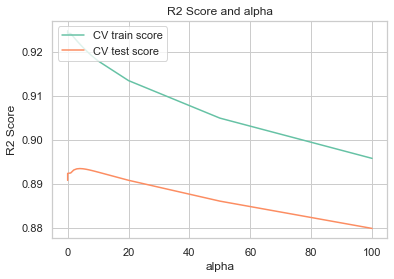

In [157]:
# plotting mean test and train scoes with alpha 
rcv_results['param_alpha'] = rcv_results['param_alpha'].astype('int32')

# plotting
plt.plot(rcv_results['param_alpha'], rcv_results['mean_train_score'])
plt.plot(rcv_results['param_alpha'], rcv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('R2 Score')
plt.title("R2 Score and alpha")
plt.legend(['CV train score', 'CV test score'], loc='upper left')
plt.show()

In [158]:
# Check the best params and score
print("Model:{}\nBest Params:{}\nScore:{}".format(ridge_cv.best_estimator_,ridge_cv.best_params_,ridge_cv.best_score_))
r_lambda = list(ridge_cv.best_params_.values())

Model:Ridge(alpha=4.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)
Best Params:{'alpha': 4.0}
Score:0.8934980218460821


### Build the Model using the selected Lambda

In [159]:
# Build the model with optimal Lambda.
ridge = Ridge(alpha=r_lambda)

ridge.fit(MX1_train, my1_train)
ridge.coef_

array([ 0.01532819,  0.04490514, -0.01267824,  0.14016462,  0.11356881,
        0.03755864,  0.06615654, -0.00231455,  0.14599516,  0.09137788,
        0.15868109,  0.151632  ,  0.02597053,  0.03933707,  0.02053777,
       -0.05261454, -0.06798309,  0.05791343,  0.03929576,  0.0395613 ,
        0.05366767,  0.02286838,  0.01324273,  0.01372326, -0.10044856,
       -0.00978861,  0.02634924,  0.14066403,  0.12016098, -0.03430405,
        0.16061854,  0.00858296,  0.08612674,  0.04270497, -0.13069845,
       -0.07125202, -0.13080291, -0.05552227,  0.30283764,  0.25884083,
       -0.07678905, -0.01283096,  0.06713958,  0.34817409, -0.04150139,
       -0.02294153,  0.10928879, -0.01544204, -0.05806801, -0.18273034,
       -0.01029002, -0.00602618,  0.12139934,  0.13151467,  0.02569868,
       -0.04366148,  0.00642224, -0.06698586, -0.12008347,  0.16090796,
       -0.0015499 ,  0.06857454,  0.09727436,  0.08985816,  0.12417781,
        0.1488949 , -0.14012515, -0.17333806, -0.21127329,  0.05

### Extract the coefficents and rank them

In [160]:
# Ridge Model params
r_trn_df = pd.DataFrame(MX1_train.columns,columns=["Coefficients"])
r_trn_df['Coefficient_Estimate'] = pd.Series(ridge.coef_)
r_trn_df.iloc[0]=["Constant",0]
r_coeff = r_trn_df.sort_values(by="Coefficient_Estimate",ascending=False)
display(r_coeff)

,Coefficients,Coefficient_Estimate
43,Neighborhood_StoneBr,0.348174
38,Neighborhood_NoRidge,0.302838
108,SaleType_New,0.265960
39,Neighborhood_NridgHt,0.258841
81,BsmtExposure_Gd,0.195341
59,Exterior2nd_CmentBd,0.160908
30,LandContour_HLS,0.160619
10,2ndFlrSF,0.158681
11,GrLivArea,0.151632
65,MasVnrType_Stone,0.148895


In [161]:
# Under Ridge Regression no of Coefficents which are no equivalent to 0
len(r_coeff[r_coeff.Coefficient_Estimate != 0])

111

__Observations__
  * As it can be seen, there are Ridge Regression has not sparsed any of the features. There nearly 111 features which are not equivalent to 0. For constant the coefficent value is 0 which has been added manually

## Predictions on the train set

In [162]:
my1_train_pred = ridge.predict(MX1_train)

### Residual Analysis and validating the assumptions on Train Set

#### Error terms are normally distributed with mean zero

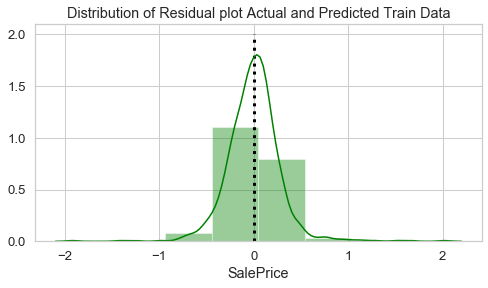

In [163]:
# Calculate the Residuals and check if they are normally distributed or not
res_m1 = my1_train - my1_train_pred
plt.figure(1,figsize=(8,4))
sns.set(style="whitegrid",font_scale=1.2)
sns.distplot(round(res_m1,2),bins=8,color="green")
plt.vlines(round(res_m1,2).mean(),ymin=0,ymax=2,linewidth=3.0,color="black",linestyles='dotted')
plt.title('Distribution of Residual plot Actual and Predicted Train Data')
plt.show()

In [164]:
# Mean of Residuals
round(res_m1,2).mean()

-0.0001772679874869601

* The mean of residuals is observed to be very close 0

#### Error terms are independent of each other:

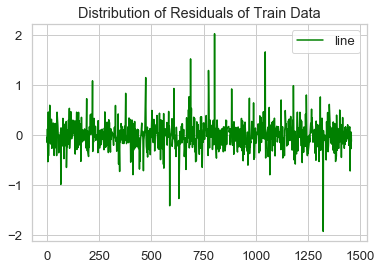

In [165]:
# check if the Residuals are normally distributed or not
plt.figure(1,figsize=(6,4))
sns.set(style="whitegrid",font_scale=1.2)
ax = sns.lineplot(data=res_m1, color="green", label="line")
plt.title('Distribution of Residuals of Train Data')
plt.show()

* There is no specific visible pattern

#### Error terms have constant variance (homoscedasticity):

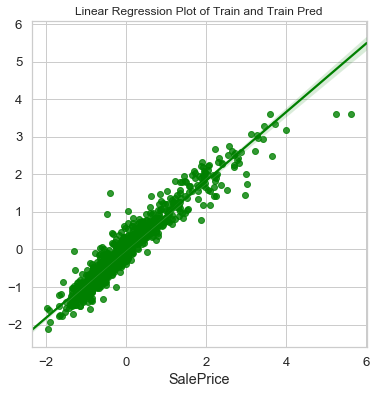

In [166]:
plt.figure(2,figsize=(6,6))
sns.set(style="whitegrid",font_scale=1.2)
ax1 = sns.regplot(x=my1_train,y=my1_train_pred,color='green')
plt.title('Linear Regression Plot of Train and Train Pred',fontsize=12)
plt.show()

* Error terms have constant variance but in the end couple of points are out of the variance

In [167]:
# calculate the RSquared and RMSE for test data and Predicted data
m1_rsqr_train = r2_score(y_true=my1_train,y_pred=my1_train_pred)
m1_mar_train = mean_absolute_error(y_true=my1_train,y_pred=my1_train_pred)
m1_mse_train = mean_squared_error(my1_train, my1_train_pred)
m1_rmse_train = sqrt(mean_squared_error(my1_train, my1_train_pred))
m1_adjr_train = 1 - float(len(my1_train)-1)/(len(my1_train)-len(ridge.coef_)-1)*(1 - m1_rsqr_train)

print(color.BOLD+"Model Evalutation metrics of train set")
print(color.BOLD+"RSquare of the Model is ",round(m1_rsqr_train,2))
print(color.BOLD+"Adj RSquare of the Model is ",round(m1_adjr_train,2))
print(color.BOLD+"Mean Absolute Error of the Model is",round(m1_mar_train,2))
print(color.BOLD+"MSE of the model is ",round(m1_mse_train,2))
print(color.BOLD+"RMSE of the model is ",round(m1_rmse_train,2))

Model Evalutation metrics of train set
RSquare of the Model is  0.92
Adj RSquare of the Model is  0.91
Mean Absolute Error of the Model is 0.2
MSE of the model is  0.08
RMSE of the model is  0.28


### __Observations on Training Set__
1. Residuals (Actual Train data and Predicted Train data) are be normally distributed with mean zero.
   - Here it is close to 0
2. Residuals (Actual Train data and Predicted Train data) are independent of each other.
3. Residuals (Actual Train data and Predicted Train data)  have constant variance.
4. Adjusted R-Square and R-Square are close to each other and Adjusted R-Square is below R-Square.
___Hence the basic checks are good on training data, this model can be used on test set for further evaluations___

## Prediction and Evaluation on the Test Set

* Make predictions on the test set (y_test_pred)
* evaluate the model, r-squared on the test set

### Preprocessing of Test Set Data based on Train Set

In [168]:
display(m1_test.head())

,LotFrontage,LotArea,Alley,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,SalePrice,BuiltAge,RemodAge,GarageAge,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_HLS,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Edwards,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_NAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Feedr,Condition1_Norm,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,HouseStyle_2Story,HouseStyle_SFoyer,RoofStyle_Gable,RoofStyle_Hip,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_CmentBd,Exterior2nd_MetalSd,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NA,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_TA,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf,Fence_GdWo,Fence_MnPrv,Fence_NA,SaleType_New,SaleType_WD,SaleCondition_Normal,SaleCondition_Partial
468,1.309011,0.443968,-0.254024,1.441447,-0.506808,0.962812,-1.006517,2.432962,1.525607,1.431477,-0.797786,0.341544,-0.81534,0.806338,-0.751952,0.208442,-0.224667,0.369628,0.652153,1.673751,1.898756,-0.750858,-0.004836,-0.378526,1.017286,-1.140317,-1.026681,-0.970224,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,1,1,0
633,0.756051,-0.083473,-0.254024,-0.784556,1.280063,-0.606380,0.118715,-1.035952,0.061258,-0.233418,-0.797786,-0.894507,-0.81534,-1.052503,-0.751952,0.208442,-0.224667,-0.285591,-0.927176,-1.010408,-0.977934,2.512273,-0.703612,-0.378526,-0.512015,0.559083,-0.978317,1.041967,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,1,0,1,1,0
324,1.247571,0.406916,-0.254024,0.699446,1.280063,1.291837,-1.006517,0.339730,-0.827628,2.191913,1.765699,3.215684,-0.81534,0.806338,1.262354,2.856068,-0.224667,2.990505,0.652153,0.331671,0.465158,1.257223,-0.703612,-0.378526,0.906668,0.134233,-1.075045,0.771095,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0
200,0.756051,-0.253959,-0.254024,-1.526557,-0.506808,-0.606380,-1.006517,1.278942,0.228245,-0.046189,-0.797786,-0.755505,-0.81534,0.806338,-0.751952,-1.115371,-0.224667,-0.940810,-0.927176,0.331671,-0.123472,0.353587,0.312790,-0.378526,-0.503718,-1.042275,-0.929954,-0.854136,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0,0,1,0,1,1,0
268,0.479571,-0.652566,-0.254024,-0.784556,0.386628,-0.606380,-0.061791,-0.798293,-0.750557,-1.034180,-0.797786,-1.489010,-0.81534,-1.052503,-0.751952,-1.115371,-0.224667,-1.596029,0.652153,-1.010408,2.174083,-0.750858,-0.306580,-0.378526,-0.773351,1.016614,1.439865,0.577615,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0


In [169]:
# Create y_test and X_train
display(m1_test.shape)
my1_test = m1_test.pop("SalePrice")
MX1_test = m1_test
display(my1_test.head())
display(MX1_test.head())

(412, 113)

468    1.017286
633   -0.512015
324    0.906668
200   -0.503718
268   -0.773351
Name: SalePrice, dtype: float64

,LotFrontage,LotArea,Alley,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,BuiltAge,RemodAge,GarageAge,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_HLS,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Edwards,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_NAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Feedr,Condition1_Norm,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,HouseStyle_2Story,HouseStyle_SFoyer,RoofStyle_Gable,RoofStyle_Hip,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_CmentBd,Exterior2nd_MetalSd,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NA,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_TA,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf,Fence_GdWo,Fence_MnPrv,Fence_NA,SaleType_New,SaleType_WD,SaleCondition_Normal,SaleCondition_Partial
468,1.309011,0.443968,-0.254024,1.441447,-0.506808,0.962812,-1.006517,2.432962,1.525607,1.431477,-0.797786,0.341544,-0.81534,0.806338,-0.751952,0.208442,-0.224667,0.369628,0.652153,1.673751,1.898756,-0.750858,-0.004836,-0.378526,-1.140317,-1.026681,-0.970224,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,1,1,0
633,0.756051,-0.083473,-0.254024,-0.784556,1.280063,-0.606380,0.118715,-1.035952,0.061258,-0.233418,-0.797786,-0.894507,-0.81534,-1.052503,-0.751952,0.208442,-0.224667,-0.285591,-0.927176,-1.010408,-0.977934,2.512273,-0.703612,-0.378526,0.559083,-0.978317,1.041967,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,1,0,1,1,0
324,1.247571,0.406916,-0.254024,0.699446,1.280063,1.291837,-1.006517,0.339730,-0.827628,2.191913,1.765699,3.215684,-0.81534,0.806338,1.262354,2.856068,-0.224667,2.990505,0.652153,0.331671,0.465158,1.257223,-0.703612,-0.378526,0.134233,-1.075045,0.771095,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0
200,0.756051,-0.253959,-0.254024,-1.526557,-0.506808,-0.606380,-1.006517,1.278942,0.228245,-0.046189,-0.797786,-0.755505,-0.81534,0.806338,-0.751952,-1.115371,-0.224667,-0.940810,-0.927176,0.331671,-0.123472,0.353587,0.312790,-0.378526,-1.042275,-0.929954,-0.854136,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0,0,1,0,1,1,0
268,0.479571,-0.652566,-0.254024,-0.784556,0.386628,-0.606380,-0.061791,-0.798293,-0.750557,-1.034180,-0.797786,-1.489010,-0.81534,-1.052503,-0.751952,-1.115371,-0.224667,-1.596029,0.652153,-1.010408,2.174083,-0.750858,-0.306580,-0.378526,1.016614,1.439865,0.577615,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0


### Predict on Test Data

In [170]:
# predict y_test_pred based on our model
my1_test_pred = ridge.predict(MX1_test)

### Model Evalution of Metrics of Test Data

In [171]:
# calculate the RSquared and RMSE for test data and Predicted data
m1_rsqr_test = r2_score(y_true=my1_test,y_pred=my1_test_pred)
m1_mar_test = mean_absolute_error(y_true=my1_test,y_pred=my1_test_pred)
m1_mse_test = mean_squared_error(my1_test, my1_test_pred)
m1_rmse_test = sqrt(mean_squared_error(my1_test, my1_test_pred))
m1_adjr_test = 1 - float(len(my1_test)-1)/(len(my1_test)-len(ridge.coef_)-1)*(1 - m1_rsqr_test)


print(color.BOLD+"RSquare of the test set is ",round(m1_rsqr_test,2))
print(color.BOLD+"Adj RSquare of the Model is ",round(m1_adjr_test,2))
print(color.BOLD+"Mean Absolute Error ",round(m1_mar_test,2))
print(color.BOLD+"Mean Squared Error ",round(m1_mse_test,2))
print(color.BOLD+"RMSE of the model is ",round(m1_rmse_test,2))

RSquare of the test set is  0.92
Adj RSquare of the Model is  0.89
Mean Absolute Error  0.19
Mean Squared Error  0.07
RMSE of the model is  0.26


### Residual Analysis and validating the assumptions on Test Set

#### Error terms are normally distributed with mean zero

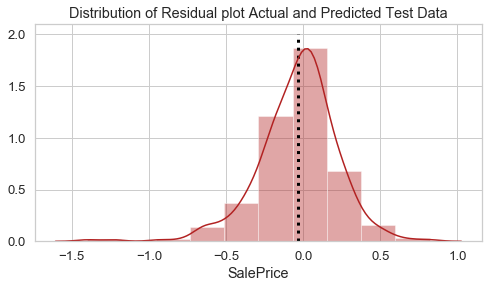

In [172]:
# Calculate the Residuals and check if they are normally distributed or not
res_test_m1 = my1_test - my1_test_pred
plt.figure(1,figsize=(8,4))
sns.set(style="whitegrid",font_scale=1.2)
sns.distplot(round(res_test_m1,2),bins=10,color="firebrick")
plt.vlines(round(res_test_m1,2).mean(),ymin=0,ymax=2,linewidth=3.0,color="black",linestyles='dotted')
plt.title('Distribution of Residual plot Actual and Predicted Test Data')
plt.show()

In [173]:
# Mean of Residuals
round(res_test_m1,2).mean()

-0.033446601941747596

* The mean of residuals is observed to be very close 0

#### Error terms are independent of each other:

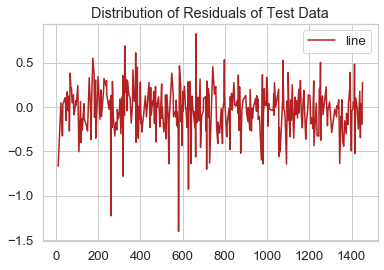

In [174]:
plt.figure(1,figsize=(6,4))
sns.set(style="whitegrid",font_scale=1.2)
ax = sns.lineplot(data=res_test_m1, color="firebrick", label="line")
plt.title('Distribution of Residuals of Test Data')
plt.show()

* There is no specific visible pattern

#### Error terms have constant variance (homoscedasticity):

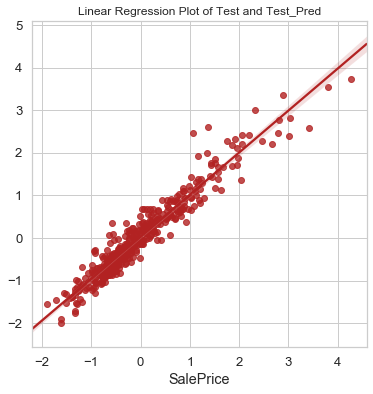

In [175]:
plt.figure(2,figsize=(6,6))
sns.set(style="whitegrid",font_scale=1.2)
ax1 = sns.regplot(x=my1_test,y=my1_test_pred,color="firebrick")
plt.title('Linear Regression Plot of Test and Test_Pred',fontsize=12)
plt.show()

* Error terms have constant variance but in the end couple of points are out of the variance

#### Distribution of Actual Test Data and Predicted Test Data

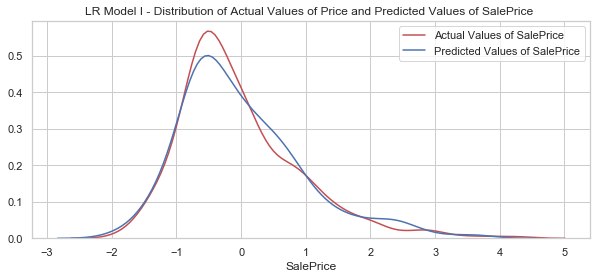

In [176]:
# Plot the distribution of Actual values of Price and Predicted values of Price
plt.figure(1,figsize=(10,4))
sns.set(style="whitegrid",font_scale=1)
ax1 = sns.distplot(my1_test, hist=False, color="r", label="Actual Values of SalePrice")
sns.distplot(my1_test_pred, hist=False, color="b", label="Predicted Values of SalePrice" , ax=ax1)
plt.title('LR Model I - Distribution of Actual Values of Price and Predicted Values of SalePrice ',fontsize=12)
plt.show()

### __Summary and Observations of LR-M I__

In [177]:
print(color.BOLD+"Linear Regression Model-I Evalutation metrics of train set")
print(color.BOLD+"RSquare of the is ",round(m1_rsqr_train,4))
print(color.BOLD+"Mean Absolute Error ",round(m1_mar_train,4))
print(color.BOLD+"MSE of the model is ",round(m1_mse_train,4))
print(color.BOLD+"RMSE of the model is ",round(m1_rmse_train,4))
print(color.BOLD+"Adj RSquare of the Model is ",round(m1_adjr_train,4))
print("\n")
print(color.BOLD+"Linear Regression Model-I Evalutation metrics of test set")
print(color.BOLD+"RSquare of the test set is ",round(m1_rsqr_test,4))
print(color.BOLD+"Mean Absolute Error ",round(m1_mar_test,4))
print(color.BOLD+"Mean Squared Error ",round(m1_mse_test,4))
print(color.BOLD+"RMSE of the model is ",round(m1_rmse_test,4))
print(color.BOLD+"Adj RSquare of the Model is ",round(m1_adjr_test,4))
print("\n")
print(color.BOLD+"Optimal Lambda choosen for the model is ",r_lambda[0])
print(color.BOLD+"\nTop 10 coefficients of Ridge Based Model\n",r_coeff[:10])
print(color.BOLD+"\nList of Top 10 coefficients of Ridge Based Model\n",r_coeff.Coefficients[:10].values)

Linear Regression Model-I Evalutation metrics of train set
RSquare of the is  0.9197
Mean Absolute Error  0.1968
MSE of the model is  0.0803
RMSE of the model is  0.2834
Adj RSquare of the Model is  0.9091


Linear Regression Model-I Evalutation metrics of test set
RSquare of the test set is  0.9232
Mean Absolute Error  0.1889
Mean Squared Error  0.0675
RMSE of the model is  0.2597
Adj RSquare of the Model is  0.8944


Optimal Lambda choosen for the model is  4.0

Top 10 coefficients of Ridge Based Model
              Coefficients  Coefficient_Estimate
43   Neighborhood_StoneBr              0.348174
38   Neighborhood_NoRidge              0.302838
108          SaleType_New              0.265960
39   Neighborhood_NridgHt              0.258841
81        BsmtExposure_Gd              0.195341
59    Exterior2nd_CmentBd              0.160908
30        LandContour_HLS              0.160619
10               2ndFlrSF              0.158681
11              GrLivArea              0.151632
65       

__Observations of LR Model:__
1. Residuals (Actual Test data and Predicted Test data) should be normally distributed with mean zero both across Train and Test Data.
   * Mean of Residuals on Training data is -0.0001 and Test Data is -0.0334
2. Residuals (Actual Test data and Predicted Test data) are independent of each other.
3. Residuals (Actual Test data and Predicted Test data)  have constant variance.
4. Adjusted R-Square should be little less but comapritively closer to R-Square. 
   * (0.894 < 0.923)
5. R-Square should be comparitvely high suggesting a good fit. 
   * (0.923)
6. R-Square of Test and Train should be closer to each other suggesting that model has worked well with unseen data. 
   * R-Squared using RFE Train Set    :  0.9197
   * R-Squared using RFE Test Set     :  0.9232
7. RMSE is of LR Model I is 0.2834 suggesting very less variance in the error terms is very less on unseen data

Conclusions on the model:
   * __This model explains 91% variance of predictor Price by the dependent variables both on Training data  and 92% on Test Data__

# LR Model 2 using Lasso Regression

__Lasso Regression Steps__
* 1) Prepare the data for modelling
* 2) Hyperparameter tuning and selection using GridSearchCV
* 3) Build the Ridge Regression Model using optimal Lambda value
* 4) Predict on Train Set
* 5) Predict on Test Set

## Prepare the data for Modelling

In [178]:
# Target variable is removed from predictor variables
my2_train = m2_train.pop("SalePrice")
MX2_train = m2_train

display(my2_train.head())
display(MX2_train.head())

943    -0.462236
838    -0.448409
651    -0.946192
1332   -1.056811
539     1.321487
Name: SalePrice, dtype: float64

,LotFrontage,LotArea,Alley,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,BuiltAge,RemodAge,GarageAge,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_HLS,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Edwards,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_NAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Feedr,Condition1_Norm,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,HouseStyle_2Story,HouseStyle_SFoyer,RoofStyle_Gable,RoofStyle_Hip,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_CmentBd,Exterior2nd_MetalSd,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NA,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_TA,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf,Fence_GdWo,Fence_MnPrv,Fence_NA,SaleType_New,SaleType_WD,SaleCondition_Normal,SaleCondition_Partial
943,1.370451,3.730663,-0.254024,-0.784556,-1.400244,-0.60638,-1.006517,2.446673,1.541022,1.425716,-0.797786,0.337267,-0.815340,0.806338,-0.751952,1.532255,4.263998,1.024847,-0.927176,0.331671,0.522122,-0.750858,-0.703612,-0.378526,0.134233,0.859501,0.538919,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,1,0,1,1,0
838,0.602451,-0.016877,-0.254024,-0.784556,0.386628,-0.60638,-1.006517,1.228668,0.171726,-0.109559,-0.797786,-0.802552,-0.815340,-1.052503,1.262354,0.208442,-0.224667,-0.285591,-0.927176,-1.010408,-0.541209,1.575169,-0.703612,-0.378526,-0.780829,-1.026681,-0.699352,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,1,1,0
651,0.141651,-0.123673,-0.254024,-1.526557,-0.506808,-0.60638,-1.006517,0.442564,-0.712022,-1.100430,0.994280,0.076370,1.129713,-1.052503,-0.751952,1.532255,-0.224667,0.369628,0.652153,-1.010408,-0.807042,0.253183,-0.703612,-0.378526,1.016614,1.681683,1.583710,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,1,0,1,0,0,1,1,0
1332,0.356691,-0.173801,-0.254024,-1.526557,0.386628,-0.60638,0.611004,-0.994819,-0.555311,-0.924724,-0.797786,-1.407747,1.129713,-1.052503,-0.751952,-1.115371,-0.224667,-2.251248,0.652153,-1.010408,-0.845018,-0.750858,-0.703612,-0.378526,1.081976,1.294774,0.887183,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,1,0,0,1,0,1,1,0
539,-1.701548,0.442757,-0.254024,1.441447,-0.506808,2.42444,2.176952,-0.773156,1.410001,1.336422,-0.797786,0.270974,1.129713,0.806338,-0.751952,0.208442,-0.224667,-0.285591,0.652153,0.331671,0.968341,0.755203,-0.703612,-0.378526,-0.976913,-0.833226,-0.776744,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,1,0


## Build the Model

### Hyperparameter Tuning and Selection using GrideSearchCV - scoring r2

In [179]:
# list of alphas to tune
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0]}

lasso = Lasso()

# cross validation
folds = KFold(n_splits = 5, shuffle = True, random_state = rndm_stat)
lasso_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'r2',
                        #scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
lasso_cv.fit(MX2_train, my2_train) 

Fitting 5 folds for each of 15 candidates, totalling 75 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  75 out of  75 | elapsed:    1.2s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             error_score='raise-deprecating',
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='r2', verbose=1)

In [180]:
# explore the results
lcv_results = pd.DataFrame(lasso_cv.cv_results_)
lcv_results = lcv_results[lcv_results['param_alpha']<=10]
lcv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.067479,0.026754,0.004122,0.005867,0.0001,{'alpha': 0.0001},0.873364,0.884605,0.876930,0.926724,0.895510,0.891422,0.019222,2,0.927709,0.926833,0.927790,0.917846,0.923364,0.924708,0.003793
1,0.052246,0.007766,0.003323,0.006160,0.001,{'alpha': 0.001},0.872055,0.884927,0.874794,0.925223,0.900184,0.891427,0.019568,1,0.923998,0.922392,0.923317,0.913574,0.919357,0.920528,0.003822
2,0.010247,0.008068,0.003276,0.004598,0.01,{'alpha': 0.01},0.847751,0.870414,0.847150,0.890757,0.892472,0.869685,0.019759,3,0.891658,0.890168,0.892749,0.881225,0.884539,0.888068,0.004438
3,0.004335,0.003792,0.001197,0.000977,0.05,{'alpha': 0.05},0.796776,0.824127,0.811627,0.841688,0.845195,0.823860,0.018197,4,0.838896,0.832897,0.837507,0.827426,0.826705,0.832686,0.005006
4,0.004737,0.005735,0.000198,0.000396,0.1,{'alpha': 0.1},0.773501,0.799846,0.794926,0.808251,0.819439,0.799172,0.015295,5,0.815291,0.806243,0.812111,0.799429,0.802449,0.807105,0.005889


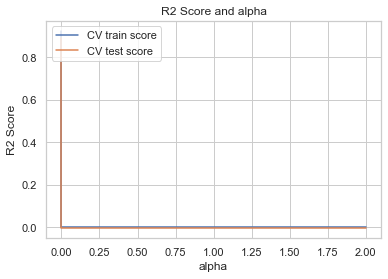

In [181]:
# plotting mean test and train scoes with alpha 
lcv_results['param_alpha'] = lcv_results['param_alpha'].astype('int32')

# plotting
plt.plot(lcv_results['param_alpha'], lcv_results['mean_train_score'])
plt.plot(lcv_results['param_alpha'], lcv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('R2 Score')
plt.title("R2 Score and alpha")
plt.legend(['CV train score', 'CV test score'], loc='upper left')
plt.show()

In [182]:
# Check the best params and score
print("Model:{}\nBest Params:{}\nScore:{}".format(lasso_cv.best_estimator_,lasso_cv.best_params_,lasso_cv.best_score_))
l_lambda = list(lasso_cv.best_params_.values())

Model:Lasso(alpha=0.001, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)
Best Params:{'alpha': 0.001}
Score:0.8914273130792366


### Build the Model using the selected Lambda

In [183]:
# Build the model with optimal Lambda
lasso = Lasso(alpha=l_lambda)

lasso.fit(MX2_train, my2_train)
lasso.coef_

array([ 1.38540341e-02,  4.48270895e-02, -1.34963575e-02,  1.44620170e-01,
        1.15799400e-01,  3.50230516e-02,  7.14592818e-02,  0.00000000e+00,
        1.31456348e-01,  0.00000000e+00,  3.31986236e-02,  2.90669456e-01,
        2.44490141e-02,  3.41774438e-02,  1.62296743e-02, -4.53336701e-02,
       -7.19984520e-02,  5.18784499e-02,  3.02896375e-02,  3.61236023e-02,
        4.47975145e-02,  1.81362735e-02,  1.22906289e-02,  1.19501597e-02,
       -1.05571735e-01, -3.24765880e-03,  4.56786748e-03,  1.47941986e-01,
        1.22679905e-01, -3.59643581e-02,  1.55663941e-01,  0.00000000e+00,
        1.02286599e-01,  4.70315493e-02, -8.84234996e-02, -0.00000000e+00,
       -5.52819594e-02, -2.84199846e-02,  3.33397322e-01,  2.76959963e-01,
       -2.60013345e-02, -0.00000000e+00,  6.32861464e-02,  3.80277057e-01,
       -0.00000000e+00, -0.00000000e+00,  1.13403689e-01,  0.00000000e+00,
       -0.00000000e+00, -1.71585248e-01, -0.00000000e+00, -0.00000000e+00,
        3.92435015e-02,  

### Extract the coefficents and rank them

In [184]:
# Lasso Model params
l_trn_df = pd.DataFrame(MX2_train.columns,columns=["Coefficients"])
l_trn_df['Coefficient_Estimate'] = pd.Series(lasso.coef_)
l_trn_df.iloc[0]=["Constant",0]
l_coeff = l_trn_df.sort_values(by="Coefficient_Estimate",ascending=False)
display(l_coeff)

,Coefficients,Coefficient_Estimate
43,Neighborhood_StoneBr,3.802771e-01
108,SaleType_New,3.581959e-01
38,Neighborhood_NoRidge,3.333973e-01
11,GrLivArea,2.906695e-01
39,Neighborhood_NridgHt,2.769600e-01
81,BsmtExposure_Gd,1.872779e-01
59,Exterior2nd_CmentBd,1.707528e-01
30,LandContour_HLS,1.556639e-01
27,MSZoning_FV,1.479420e-01
3,OverallQual,1.446202e-01


In [185]:
# Under Lasso Regression no of Coefficents which are no equivalent to 0
len(l_coeff[l_coeff.Coefficient_Estimate != 0])

81

__Observations__
  * As it can be seen, there are Lasso Regression has sparsed nearly 31 features equal to 0. There is a feature selection and we see that the final no of features are 81 from 112.

## Predictions on the train set

In [186]:
my2_train_pred = lasso.predict(MX2_train)

### Residual Analysis and validating the assumptions on Train Set

#### Error terms are normally distributed with mean zero

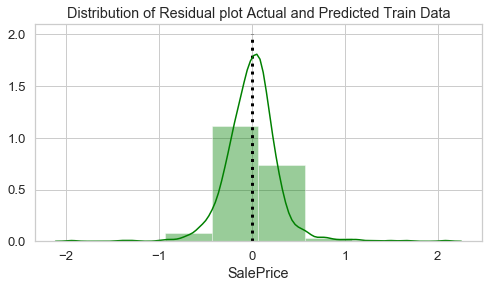

In [187]:
# Calculate the Residuals and check if they are normally distributed or not
res_m2 = my2_train - my2_train_pred
plt.figure(1,figsize=(8,4))
sns.set(style="whitegrid",font_scale=1.2)
sns.distplot(round(res_m2,2),bins=8,color="green")
plt.vlines(round(res_m2,2).mean(),ymin=0,ymax=2,linewidth=3.0,color="black",linestyles='dotted')
plt.title('Distribution of Residual plot Actual and Predicted Train Data')
plt.show()

In [188]:
# Mean of Residuals
round(res_m2,2).mean()

7.299270072992319e-05

* The mean of residuals is observed to be very close 0

#### Error terms are independent of each other:

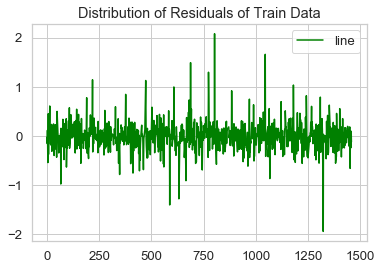

In [189]:
# check if the Residuals are normally distributed or not
plt.figure(1,figsize=(6,4))
sns.set(style="whitegrid",font_scale=1.2)
ax = sns.lineplot(data=res_m2, color="green", label="line")
plt.title('Distribution of Residuals of Train Data')
plt.show()

* There is no specific visible pattern

#### Error terms have constant variance (homoscedasticity):

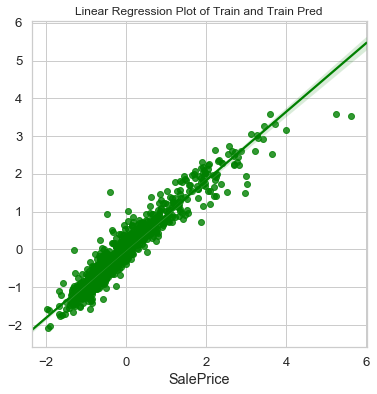

In [190]:
plt.figure(2,figsize=(6,6))
sns.set(style="whitegrid",font_scale=1.2)
ax1 = sns.regplot(x=my2_train,y=my2_train_pred,color='green')
plt.title('Linear Regression Plot of Train and Train Pred',fontsize=12)
plt.show()

* Error terms have constant variance but in the end couple of points are out of the variance

In [191]:
# calculate the RSquared and RMSE for test data and Predicted data
m2_rsqr_train = r2_score(y_true=my2_train,y_pred=my2_train_pred)
m2_mar_train = mean_absolute_error(y_true=my2_train,y_pred=my2_train_pred)
m2_mse_train = mean_squared_error(my2_train, my2_train_pred)
m2_rmse_train = sqrt(mean_squared_error(my2_train, my2_train_pred))
m2_adjr_train = 1 - float(len(my2_train)-1)/(len(my1_train)-len(lasso.coef_)-1)*(1 - m2_rsqr_train)


print(color.BOLD+"Model Evalutation metrics of train set")
print(color.BOLD+"RSquare of the is ",round(m2_rsqr_train,2))
print(color.BOLD+"Adj RSquare of the Model is ",round(m2_adjr_train,2))
print(color.BOLD+"Mean Absolute Error ",round(m2_mar_train,2))
print(color.BOLD+"MSE of the model is ",round(m2_mse_train,2))
print(color.BOLD+"RMSE of the model is ",round(m2_rmse_train,2))

Model Evalutation metrics of train set
RSquare of the is  0.92
Adj RSquare of the Model is  0.91
Mean Absolute Error  0.2
MSE of the model is  0.08
RMSE of the model is  0.29


### __Observations on Training Set__
1. Residuals (Actual Train data and Predicted Train data) are be normally distributed with mean zero.
   - Here it is close to 0
2. Residuals (Actual Train data and Predicted Train data) are independent of each other.
3. Residuals (Actual Train data and Predicted Train data)  have constant variance.
4. Adjusted R-Square and R-Square are close to each other and Adjusted R-Square is below R-Square.
___Hence the basic checks are good on training data, this model can be used on test set for further evaluations___

## Prediction and Evaluation on the Test Set

* Make predictions on the test set (y_test_pred)
* evaluate the model, r-squared on the test set

### Preprocessing of Test Set Data based on Train Set

In [192]:
display(m2_test.head())

,LotFrontage,LotArea,Alley,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,SalePrice,BuiltAge,RemodAge,GarageAge,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_HLS,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Edwards,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_NAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Feedr,Condition1_Norm,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,HouseStyle_2Story,HouseStyle_SFoyer,RoofStyle_Gable,RoofStyle_Hip,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_CmentBd,Exterior2nd_MetalSd,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NA,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_TA,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf,Fence_GdWo,Fence_MnPrv,Fence_NA,SaleType_New,SaleType_WD,SaleCondition_Normal,SaleCondition_Partial
468,1.309011,0.443968,-0.254024,1.441447,-0.506808,0.962812,-1.006517,2.432962,1.525607,1.431477,-0.797786,0.341544,-0.81534,0.806338,-0.751952,0.208442,-0.224667,0.369628,0.652153,1.673751,1.898756,-0.750858,-0.004836,-0.378526,1.017286,-1.140317,-1.026681,-0.970224,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,1,1,0
633,0.756051,-0.083473,-0.254024,-0.784556,1.280063,-0.606380,0.118715,-1.035952,0.061258,-0.233418,-0.797786,-0.894507,-0.81534,-1.052503,-0.751952,0.208442,-0.224667,-0.285591,-0.927176,-1.010408,-0.977934,2.512273,-0.703612,-0.378526,-0.512015,0.559083,-0.978317,1.041967,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,1,0,1,1,0
324,1.247571,0.406916,-0.254024,0.699446,1.280063,1.291837,-1.006517,0.339730,-0.827628,2.191913,1.765699,3.215684,-0.81534,0.806338,1.262354,2.856068,-0.224667,2.990505,0.652153,0.331671,0.465158,1.257223,-0.703612,-0.378526,0.906668,0.134233,-1.075045,0.771095,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0
200,0.756051,-0.253959,-0.254024,-1.526557,-0.506808,-0.606380,-1.006517,1.278942,0.228245,-0.046189,-0.797786,-0.755505,-0.81534,0.806338,-0.751952,-1.115371,-0.224667,-0.940810,-0.927176,0.331671,-0.123472,0.353587,0.312790,-0.378526,-0.503718,-1.042275,-0.929954,-0.854136,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0,0,1,0,1,1,0
268,0.479571,-0.652566,-0.254024,-0.784556,0.386628,-0.606380,-0.061791,-0.798293,-0.750557,-1.034180,-0.797786,-1.489010,-0.81534,-1.052503,-0.751952,-1.115371,-0.224667,-1.596029,0.652153,-1.010408,2.174083,-0.750858,-0.306580,-0.378526,-0.773351,1.016614,1.439865,0.577615,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0


In [193]:
# Create y_test and X_train
display(m2_test.shape)
my2_test = m2_test.pop("SalePrice")
MX2_test = m2_test
display(my2_test.head())
display(MX2_test.head())

(412, 113)

468    1.017286
633   -0.512015
324    0.906668
200   -0.503718
268   -0.773351
Name: SalePrice, dtype: float64

,LotFrontage,LotArea,Alley,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,BuiltAge,RemodAge,GarageAge,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_HLS,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Edwards,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_NAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Feedr,Condition1_Norm,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,HouseStyle_2Story,HouseStyle_SFoyer,RoofStyle_Gable,RoofStyle_Hip,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_CmentBd,Exterior2nd_MetalSd,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NA,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_TA,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf,Fence_GdWo,Fence_MnPrv,Fence_NA,SaleType_New,SaleType_WD,SaleCondition_Normal,SaleCondition_Partial
468,1.309011,0.443968,-0.254024,1.441447,-0.506808,0.962812,-1.006517,2.432962,1.525607,1.431477,-0.797786,0.341544,-0.81534,0.806338,-0.751952,0.208442,-0.224667,0.369628,0.652153,1.673751,1.898756,-0.750858,-0.004836,-0.378526,-1.140317,-1.026681,-0.970224,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,1,1,0
633,0.756051,-0.083473,-0.254024,-0.784556,1.280063,-0.606380,0.118715,-1.035952,0.061258,-0.233418,-0.797786,-0.894507,-0.81534,-1.052503,-0.751952,0.208442,-0.224667,-0.285591,-0.927176,-1.010408,-0.977934,2.512273,-0.703612,-0.378526,0.559083,-0.978317,1.041967,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,1,0,1,1,0
324,1.247571,0.406916,-0.254024,0.699446,1.280063,1.291837,-1.006517,0.339730,-0.827628,2.191913,1.765699,3.215684,-0.81534,0.806338,1.262354,2.856068,-0.224667,2.990505,0.652153,0.331671,0.465158,1.257223,-0.703612,-0.378526,0.134233,-1.075045,0.771095,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0
200,0.756051,-0.253959,-0.254024,-1.526557,-0.506808,-0.606380,-1.006517,1.278942,0.228245,-0.046189,-0.797786,-0.755505,-0.81534,0.806338,-0.751952,-1.115371,-0.224667,-0.940810,-0.927176,0.331671,-0.123472,0.353587,0.312790,-0.378526,-1.042275,-0.929954,-0.854136,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0,0,1,0,1,1,0
268,0.479571,-0.652566,-0.254024,-0.784556,0.386628,-0.606380,-0.061791,-0.798293,-0.750557,-1.034180,-0.797786,-1.489010,-0.81534,-1.052503,-0.751952,-1.115371,-0.224667,-1.596029,0.652153,-1.010408,2.174083,-0.750858,-0.306580,-0.378526,1.016614,1.439865,0.577615,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0


### Predict on Test Data

In [194]:
# predict y_test_pred based on our model
my2_test_pred = lasso.predict(MX2_test)

### Model Evalution of Metrics of Test Data

In [195]:
# calculate the RSquared and RMSE for test data and Predicted data
m2_rsqr_test = r2_score(y_true=my2_test,y_pred=my2_test_pred)
m2_mar_test = mean_absolute_error(y_true=my2_test,y_pred=my2_test_pred)
m2_mse_test = mean_squared_error(my2_test, my2_test_pred)
m2_rmse_test = sqrt(mean_squared_error(my2_test, my2_test_pred))
m2_adjr_test = 1 - float(len(my2_test)-1)/(len(my2_test)-len(lasso.coef_)-1)*(1 - m2_rsqr_test)


print(color.BOLD+"RSquare of the test set is ",round(m2_rsqr_test,2))
print(color.BOLD+"Adj RSquare of the Model is ",round(m2_adjr_test,2))
print(color.BOLD+"Mean Absolute Error ",round(m2_mar_test,2))
print(color.BOLD+"Mean Squared Error ",round(m2_mse_test,2))
print(color.BOLD+"RMSE of the model is ",round(m2_rmse_test,2))

RSquare of the test set is  0.92
Adj RSquare of the Model is  0.9
Mean Absolute Error  0.19
Mean Squared Error  0.07
RMSE of the model is  0.26


### Residual Analysis and validating the assumptions on Test Set

#### Error terms are normally distributed with mean zero

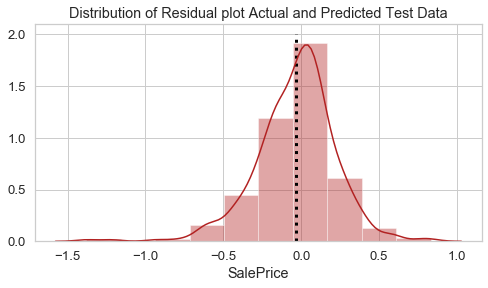

In [196]:
# Calculate the Residuals and check if they are normally distributed or not
res_test_m2 = my2_test - my2_test_pred
plt.figure(1,figsize=(8,4))
sns.set(style="whitegrid",font_scale=1.2)
sns.distplot(round(res_test_m2,2),bins=10,color="firebrick")
plt.vlines(round(res_test_m2,2).mean(),ymin=0,ymax=2,linewidth=3.0,color="black",linestyles='dotted')
plt.title('Distribution of Residual plot Actual and Predicted Test Data')
plt.show()

In [197]:
# Mean of Residuals
round(res_test_m2,2).mean()

-0.03483009708737864

* The mean of residuals is observed to be very close 0

#### Error terms are independent of each other:

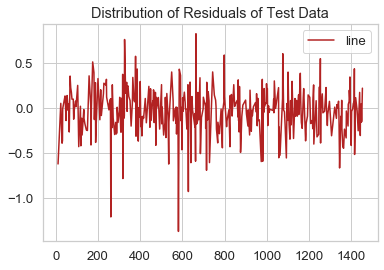

In [198]:
plt.figure(1,figsize=(6,4))
sns.set(style="whitegrid",font_scale=1.2)
ax = sns.lineplot(data=res_test_m2, color="firebrick", label="line")
plt.title('Distribution of Residuals of Test Data')
plt.show()

* There is no specific visible pattern

#### Error terms have constant variance (homoscedasticity):

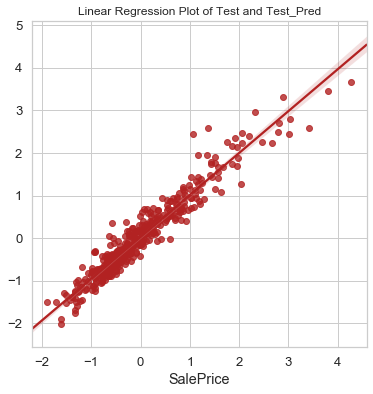

In [199]:
plt.figure(2,figsize=(6,6))
sns.set(style="whitegrid",font_scale=1.2)
ax1 = sns.regplot(x=my2_test,y=my2_test_pred,color="firebrick")
plt.title('Linear Regression Plot of Test and Test_Pred',fontsize=12)
plt.show()

* Error terms have constant variance but in the end couple of points are out of the variance

#### Distribution of Actual Test Data and Predicted Test Data

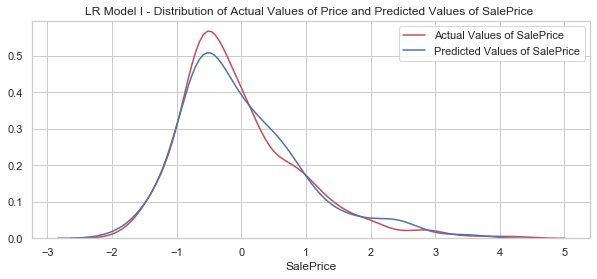

In [200]:
# Plot the distribution of Actual values of Price and Predicted values of Price
plt.figure(1,figsize=(10,4))
sns.set(style="whitegrid",font_scale=1)
ax1 = sns.distplot(my2_test, hist=False, color="r", label="Actual Values of SalePrice")
sns.distplot(my2_test_pred, hist=False, color="b", label="Predicted Values of SalePrice" , ax=ax1)
plt.title('LR Model I - Distribution of Actual Values of Price and Predicted Values of SalePrice ',fontsize=12)
plt.show()

### __Summary and Observations of LR-M II__

In [201]:
# Summary of LR Model I
print(color.BOLD+"Linear Regression Model-II Evalutation metrics of train set")
print(color.BOLD+"RSquare of the is ",round(m2_rsqr_train,4))
print(color.BOLD+"Mean Absolute Error ",round(m2_mar_train,4))
print(color.BOLD+"MSE of the model is ",round(m2_mse_train,4))
print(color.BOLD+"RMSE of the model is ",round(m2_rmse_train,4))
print(color.BOLD+"Adj RSquare of the Model is ",round(m2_adjr_train,4))
print("\n")
print(color.BOLD+"Linear Regression Model-II Evalutation metrics of test set")
print(color.BOLD+"RSquare of the test set is ",round(m2_rsqr_test,4))
print(color.BOLD+"Mean Absolute Error ",round(m2_mar_test,4))
print(color.BOLD+"Mean Squared Error ",round(m2_mse_test,4))
print(color.BOLD+"RMSE of the model is ",round(m2_rmse_test,4))
print(color.BOLD+"Adj RSquare of the Model is ",round(m2_adjr_test,4))
print("\n")
print(color.BOLD+"Optimal Lambda choosen for the model is ",l_lambda[0])
print(color.BOLD+"\nTop 10 coefficients of Lasso Based Model\n",l_coeff[:10])
print(color.BOLD+"\nList of Top 10 coefficients of Lasso Based Model\n",l_coeff.Coefficients[:10].values)

Linear Regression Model-II Evalutation metrics of train set
RSquare of the is  0.9176
Mean Absolute Error  0.1985
MSE of the model is  0.0824
RMSE of the model is  0.2871
Adj RSquare of the Model is  0.9066


Linear Regression Model-II Evalutation metrics of test set
RSquare of the test set is  0.924
Mean Absolute Error  0.1879
Mean Squared Error  0.0667
RMSE of the model is  0.2584
Adj RSquare of the Model is  0.8955


Optimal Lambda choosen for the model is  0.001

Top 10 coefficients of Lasso Based Model
              Coefficients  Coefficient_Estimate
43   Neighborhood_StoneBr              0.380277
108          SaleType_New              0.358196
38   Neighborhood_NoRidge              0.333397
11              GrLivArea              0.290669
39   Neighborhood_NridgHt              0.276960
81        BsmtExposure_Gd              0.187278
59    Exterior2nd_CmentBd              0.170753
30        LandContour_HLS              0.155664
27            MSZoning_FV              0.147942
3     

In [202]:
# Bottom variables
list(l_coeff.Coefficients[-11:-1])

['Neighborhood_Edwards',
 'BuiltAge',
 'ExterQual_Gd',
 'ExterQual_TA',
 'BsmtQual_Fa',
 'BldgType_Twnhs',
 'KitchenQual_Fa',
 'KitchenQual_Gd',
 'KitchenQual_TA',
 'BsmtQual_TA']

__Observations of LR Model:__
1. Residuals (Actual Test data and Predicted Test data) should be normally distributed with mean zero both across Train and Test Data.
   * Mean of Residuals on Training data is 0.0000 and Test Data is -0.0348
2. Residuals (Actual Test data and Predicted Test data) are independent of each other.
3. Residuals (Actual Test data and Predicted Test data)  have constant variance.
4. Adjusted R-Square on unseen data should be little less but comapritively closer to R-Square. 
   * (0.895 < 0.924)
5. R-Square on unseen data is comparitvely high suggesting a good fit. 
   * (0.924)
6. R-Square of Test and Train should be closer to each other suggesting that model has worked well with unseen data. 
   * R-Squared using Lasso Train Set    :  0.917
   * R-Squared using Lasso Test Set     :  0.924
7. RMSE is of LR Model I is 0.2584 suggesting very less variance in the error terms is very less on unseen data

Conclusions on the model:
   * __This model explains 91% variance of predictor Price by the dependent variables both on Training data  and 92% on Test Data__

# __Conclusions and Selction of the Model of the Model__

<table>
  <tr>
    <th>Advanced Regression Results</th>
    <th>MLR Model I with Ridge Regularization</th>
    <th>MLR Model II with Lasso Regularization</th>
  </tr>
  <tr>
    <td>Optimal Lambda value</td>
    <td>4</td>
    <td>0.001</td>
  </tr>
  <tr>
    <td>No of the Features</td>
    <td>111</td>
    <td>81</td>
  </tr>
  <tr>
    <td>Residuals of Mean - Test Data</td>
    <td>-0.0334</td>
    <td>-0.0348</td>
  </tr>
  <tr>
    <td>Residuals variance - Test Data</td>
    <td>Couple points are present out of the variance</td>
    <td>Variance is uniform compared to other models</td>
  </tr>
  <tr>
    <td>Adjusted R-Square - Test Data</td>
    <td>0.894</td>
    <td>0.895</td>
  </tr>
  <tr>
    <td>R-Sqaure - Train Data</td>
    <td>0.919</td>
    <td>0.917</td>
  </tr>
  <tr>
    <td>R-Sqaure - Test Data</td>
    <td>0.923</td>
    <td>0.924</td>
  </tr>
  <tr>
    <td>RMSE - Test Data</td>
    <td>0.025</td>
    <td>0.028</td>
  </tr>
</table>

__Observations from the MLR Model comparisions__
* From Model evaluation criteria, both the models have decent perforamance and have fullfilled the criteria defined earlier.
* Both the models are compartively equivalent and both the models are working better on unseen data and R2 Square, RMSE and Adjusted Rsquare are equal.

___However, following observations are used to conclude the final model___
* Lasso Regression has only 81 features while Ridge Regression has 111 features. Considering this fact, I choose Lasso as my final model due to less no of features.

__Based on following conclusions, I choose Model II to be the best fit model__
1. Residuals (Actual Test data and Predicted Test data) should be normally distributed with mean zero both across Train and Test Data.
   * Mean of Residuals on Training data is 0.0000 and Test Data is -0.0348
2. Residuals (Actual Test data and Predicted Test data) are independent of each other.
3. Residuals (Actual Test data and Predicted Test data)  have constant variance.
4. Adjusted R-Square on unseen data should be little less but comapritively closer to R-Square. 
   * (0.895 < 0.924)
5. R-Square on unseen data is comparitvely high suggesting a good fit. 
   * (0.924)
6. R-Square of Test and Train should be closer to each other suggesting that model has worked well with unseen data. 
   * R-Squared using Lasso Train Set    :  0.917
   * R-Squared using Lasso Test Set     :  0.924
7. RMSE is of LR Model I is 0.2584 suggesting very less variance in the error terms is very less on unseen data. Error terms are spread in +/- of 0.2 range suggesting good fit.

Conclusions on the model:
   * __This model explains 91% variance of predictor Price by the dependent variables both on Training data  and 92% on Test Data__
   * __Top features contributing to this model are__
     -  'Neighborhood_StoneBr'  
     - 'SaleType_New'
     - 'Neighborhood_NoRidge'
     - 'GrLivArea'
     - 'Neighborhood_NridgHt'
     - 'BsmtExposure_Gd'
     - 'Exterior2nd_CmentBd'
     - 'LandContour_HLS'
     - 'MSZoning_FV'  

### MLR Model II - Actual vs Predicted along with RMSE

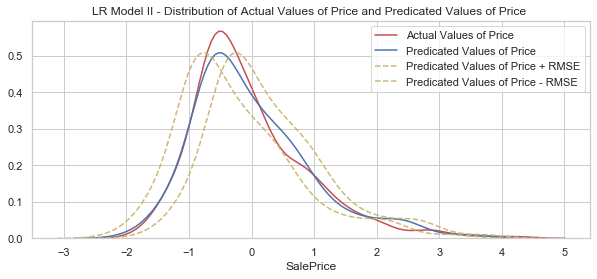

In [203]:
# Plot the Actual values of Price vs Predicted values of Price
plt.figure(1,figsize=(10,4))
sns.set(style="whitegrid",font_scale=1)
ax1 = sns.distplot(my2_test, hist=False, color="r", label="Actual Values of Price")
sns.distplot(my2_test_pred, hist=False, color="b", label="Predicated Values of Price" , ax=ax1)
sns.distplot((my2_test_pred+m2_rmse_test), hist=False, color="y", label="Predicated Values of Price + RMSE" , ax=ax1, kde_kws={'linestyle':'--'})
sns.distplot((my2_test_pred-m2_rmse_test), hist=False, color="y", label="Predicated Values of Price - RMSE" , ax=ax1, kde_kws={'linestyle':'--'})
plt.title('LR Model II - Distribution of Actual Values of Price and Predicated Values of Price ',fontsize=12)
plt.show()

### Business Conclusions based on Advancved Regression - Model II and EDA

__EDA - Numerical Correlations of Sales Price__
   * __Positively Correlated Numerical Features__
     - 'GrLivArea'
     - 'GarageCars'
     - 'GarageArea'
     - 'TotalBsmtSF'
     - '1stFlrSF',
   
   * __Negatively  Correlated Numerical Features__
     - 'KitchenAbvGr'
     - 'EnclosedPorch'
     - 'GarageAge'
     - 'RemodAge'
     - 'BuiltAge

__EDA - Categorical Correlations of Sales Price__
     
     - 'OverallQual'
     - 'OverallCond'
     - 'Condition1'
      
__Charactersistics of Sales Price based on Advanced Linear Regression Model - II which explains the 92% of dependendent features__
     
     - 'Neighborhood_StoneBr'  
     - 'SaleType_New'
     - 'Neighborhood_NoRidge'
     - 'GrLivArea'
     - 'Neighborhood_NridgHt'
     - 'BsmtExposure_Gd'
     - 'Exterior2nd_CmentBd'
     - 'LandContour_HLS'
     - 'MSZoning_FV'  

__Final Features that our customer should consider the house price This is based on EDA and LR Modelling__
   1. Locality of the house
   2. Type of the House (New or Old)
   3. Ground Living Area in sq feet
   3. MS Zoning (FV, High Density etc)
   4. Overall Quality
   5. Overall Condidtion
   6. Condition1 of the house

#  Part 2 - Subjective Questions

## Question 1
What is the optimal value of alpha for ridge and lasso regression? What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? What will be the most important predictor variables after the change is implemented?


### Ridge Regression

#### Build the Model using the selected Lambda

In [204]:
# Build the model with optimal Lambda.
qr_lambda = r_lambda[0]*2
print("Optimal Ridge Lambda",r_lambda[0])
print("Double the Optimal Ridge Lambda",qr_lambda)

Optimal Ridge Lambda 4.0
Double the Optimal Ridge Lambda 8.0


In [205]:
# build the new model with double the optimal lambda
q1_ridge = Ridge(alpha=qr_lambda)

q1_ridge.fit(MX1_train, my1_train)
q1_ridge.coef_

array([ 1.72057886e-02,  4.44450210e-02, -1.33686197e-02,  1.52934249e-01,
        1.13234143e-01,  4.29540054e-02,  7.56716453e-02,  5.48411810e-03,
        1.43397768e-01,  8.34169064e-02,  1.46249551e-01,  1.62187286e-01,
        2.71833136e-02,  3.84323922e-02,  2.12891718e-02, -5.24572577e-02,
       -7.02859594e-02,  5.82849665e-02,  3.81303389e-02,  4.13866970e-02,
        5.20465455e-02,  2.39980013e-02,  1.44924800e-02,  1.41160492e-02,
       -1.04375607e-01, -1.10578018e-02,  1.93008199e-02,  1.08056511e-01,
        1.04178995e-01, -5.54303789e-02,  1.47845945e-01, -1.38895852e-04,
        8.66422157e-02,  2.67290548e-02, -1.14867183e-01, -5.45909888e-02,
       -8.67376002e-02, -4.79622790e-02,  2.34932665e-01,  2.25245723e-01,
       -6.20684231e-02, -5.28805002e-03,  5.22905317e-02,  2.71058804e-01,
       -4.23967165e-02, -2.10910736e-02,  1.09868524e-01, -8.31642910e-03,
       -4.56941880e-02, -1.60078528e-01, -7.80008405e-03, -1.20232696e-02,
        8.52780641e-02,  

#### Extract the coefficents and rank them

In [206]:
# Ridge Model params
q1r_trn_df = pd.DataFrame(MX1_train.columns,columns=["Coefficients"])
q1r_trn_df['Coefficient_Estimate'] = pd.Series(q1_ridge.coef_)
q1r_trn_df.iloc[0]=["Constant",0]
q1r_coeff = q1r_trn_df.sort_values(by="Coefficient_Estimate",ascending=False)
display(q1r_coeff)

,Coefficients,Coefficient_Estimate
43,Neighborhood_StoneBr,0.271059
38,Neighborhood_NoRidge,0.234933
39,Neighborhood_NridgHt,0.225246
108,SaleType_New,0.212122
81,BsmtExposure_Gd,0.178978
11,GrLivArea,0.162187
3,OverallQual,0.152934
30,LandContour_HLS,0.147846
10,2ndFlrSF,0.146250
8,TotalBsmtSF,0.143398


In [207]:
# Under Ridge Regression no of Coefficents which are no equivalent to 0
len(q1r_coeff[q1r_coeff.Coefficient_Estimate != 0])

111

__Observations__
  * As it can be seen, there are Ridge Regression has not sparsed any of the features. There nearly 111 features which are not equivalent to 0. For constant the coefficent value is 0 which has been added manually

#### Predictions on the train set

In [208]:
q1y1_train_pred = q1_ridge.predict(MX1_train)

#### Predict on Test Data

In [209]:
# predict y_test_pred based on our model
q1y1_test_pred = q1_ridge.predict(MX1_test)

#### Model Evalution of Metrics of Test Data

In [210]:
# calculate the RSquared and RMSE for test data and Predicted data
q1_rsqr_test = r2_score(y_true=my1_test,y_pred=q1y1_test_pred)
q1_mar_test = mean_absolute_error(y_true=my1_test,y_pred=q1y1_test_pred)
q1_mse_test = mean_squared_error(my1_test, q1y1_test_pred)
q1_rmse_test = sqrt(mean_squared_error(my1_test, q1y1_test_pred))
q1_adjr_test = 1 - float(len(my1_test)-1)/(len(my1_test)-len(q1_ridge.coef_)-1)*(1 - q1_rsqr_test)

print(color.BOLD+"Linear Regression Model - Ridge Evalutation metrics on test set with double the optimal lambda")
print(color.BOLD+"RSquare of the test set is ",round(q1_rsqr_test,2))
print(color.BOLD+"Adj RSquare of the Model is ",round(q1_adjr_test,2))
print(color.BOLD+"Mean Absolute Error ",round(q1_mar_test,2))
print(color.BOLD+"Mean Squared Error ",round(q1_mse_test,2))
print(color.BOLD+"RMSE of the model is ",round(q1_rmse_test,2))
print("\n")
print(color.BOLD+"Optimal Lambda choosen for the model is ",qr_lambda)
print(color.BOLD+"\nTop 10 coefficients of Ridge Based Model\n",q1r_coeff[:10])
print("\nList of the Coefficents are with Ridge Based Model when Optimal Model is doubled\n")
print(q1r_coeff.Coefficients[:10].values)

Linear Regression Model - Ridge Evalutation metrics on test set with double the optimal lambda
RSquare of the test set is  0.93
Adj RSquare of the Model is  0.9
Mean Absolute Error  0.19
Mean Squared Error  0.07
RMSE of the model is  0.26


Optimal Lambda choosen for the model is  8.0

Top 10 coefficients of Ridge Based Model
              Coefficients  Coefficient_Estimate
43   Neighborhood_StoneBr              0.271059
38   Neighborhood_NoRidge              0.234933
39   Neighborhood_NridgHt              0.225246
108          SaleType_New              0.212122
81        BsmtExposure_Gd              0.178978
11              GrLivArea              0.162187
3             OverallQual              0.152934
30        LandContour_HLS              0.147846
10               2ndFlrSF              0.146250
8             TotalBsmtSF              0.143398

List of the Coefficents are with Ridge Based Model when Optimal Model is doubled

['Neighborhood_StoneBr' 'Neighborhood_NoRidge' 'Neighborhood

### Lasso Regression

### Build the Model using the selected Lambda

In [211]:
# Build the model with optimal Lambda.
ql_lambda = l_lambda[0]*2
print("Optimal Ridge Lambda",l_lambda[0])
print("Double the Optimal Ridge Lambda",ql_lambda)

Optimal Ridge Lambda 0.001
Double the Optimal Ridge Lambda 0.002


In [212]:
# Build the model with optimal Lambda
q1_lasso = Lasso(alpha=ql_lambda)

q1_lasso.fit(MX2_train, my2_train)
q1_lasso.coef_

array([ 1.61346704e-02,  4.81007688e-02, -1.26416200e-02,  1.67438197e-01,
        1.12892319e-01,  3.83384002e-02,  7.55688599e-02,  0.00000000e+00,
        1.34040554e-01,  0.00000000e+00,  2.66926601e-02,  2.97104867e-01,
        2.51307654e-02,  2.87089748e-02,  1.66698607e-02, -4.28228770e-02,
       -6.96968612e-02,  4.91166458e-02,  2.95608540e-02,  3.28359151e-02,
        4.27119772e-02,  1.86743312e-02,  1.33560496e-02,  9.49598989e-03,
       -1.17464724e-01, -8.15755569e-03, -3.69712320e-03,  4.36254082e-02,
        5.11317639e-02, -1.00951694e-01,  1.29486405e-01,  0.00000000e+00,
        9.01006093e-02,  8.94307129e-04, -5.04846082e-02, -0.00000000e+00,
       -0.00000000e+00, -7.35707158e-03,  2.29631203e-01,  2.37555247e-01,
       -0.00000000e+00,  0.00000000e+00,  2.93958494e-02,  2.81157388e-01,
       -0.00000000e+00, -0.00000000e+00,  1.10500550e-01,  0.00000000e+00,
       -0.00000000e+00, -1.34827425e-01, -0.00000000e+00, -0.00000000e+00,
        0.00000000e+00,  

### Extract the coefficents and rank them

In [213]:
# Lasso Model params
q1l_trn_df = pd.DataFrame(MX2_train.columns,columns=["Coefficients"])
q1l_trn_df['Coefficient_Estimate'] = pd.Series(q1_lasso.coef_)
q1l_trn_df.iloc[0]=["Constant",0]
q1l_coeff = q1l_trn_df.sort_values(by="Coefficient_Estimate",ascending=False)
display(q1l_coeff)

,Coefficients,Coefficient_Estimate
108,SaleType_New,3.550553e-01
11,GrLivArea,2.971049e-01
43,Neighborhood_StoneBr,2.811574e-01
39,Neighborhood_NridgHt,2.375552e-01
38,Neighborhood_NoRidge,2.296312e-01
3,OverallQual,1.674382e-01
81,BsmtExposure_Gd,1.626339e-01
59,Exterior2nd_CmentBd,1.619817e-01
8,TotalBsmtSF,1.340406e-01
30,LandContour_HLS,1.294864e-01


In [214]:
# Under Lasso Regression no of Coefficents which are no equivalent to 0
len(q1l_coeff[q1l_coeff.Coefficient_Estimate != 0])

72

__Observations__
  * As it can be seen, there are Lasso Regression has sparsed nearly 41 features equal to 0. There is a feature selection and we see that the final no of features are 72 from 113.
  * As we increase the lambda, we clearly see that the no of features equal to 0 increases.

#### Predictions on the train set

In [215]:
q1y2_train_pred = q1_lasso.predict(MX2_train)

#### Predict on Test Data

In [216]:
# predict y_test_pred based on our model
q1y2_test_pred = q1_lasso.predict(MX2_test)

### Model Evalution of Metrics of Test Data

In [217]:
# calculate the RSquared and RMSE for test data and Predicted data
q2_rsqr_test = r2_score(y_true=my2_test,y_pred=q1y2_test_pred)
q2_mar_test = mean_absolute_error(y_true=my2_test,y_pred=q1y2_test_pred)
q2_mse_test = mean_squared_error(my2_test, q1y2_test_pred)
q2_rmse_test = sqrt(mean_squared_error(my2_test, q1y2_test_pred))
q2_adjr_test = 1 - float(len(my2_test)-1)/(len(my2_test)-len(q1_lasso.coef_)-1)*(1 - q2_rsqr_test)

print(color.BOLD+"Linear Regression Model - Lasso Evalutation metrics on test set with double the optimal lambda")
print(color.BOLD+"RSquare of the test set is ",round(q2_rsqr_test,2))
print(color.BOLD+"Adj RSquare of the Model is ",round(q2_adjr_test,2))
print(color.BOLD+"Mean Absolute Error ",round(q2_mar_test,2))
print(color.BOLD+"Mean Squared Error ",round(q2_mse_test,2))
print(color.BOLD+"RMSE of the model is ",round(q2_rmse_test,2))
print("\n")
print(color.BOLD+"Optimal Lambda choosen for the model is ",ql_lambda)
print(color.BOLD+"\nTop 10 coefficients of Lasso Based Model\n",q1l_coeff[:10])
print("\nList of the Coefficents are with Lasso Based Model when Optimal Model is doubled\n")
print(q1l_coeff.Coefficients[:10].values)

Linear Regression Model - Lasso Evalutation metrics on test set with double the optimal lambda
RSquare of the test set is  0.93
Adj RSquare of the Model is  0.9
Mean Absolute Error  0.19
Mean Squared Error  0.07
RMSE of the model is  0.26


Optimal Lambda choosen for the model is  0.002

Top 10 coefficients of Lasso Based Model
              Coefficients  Coefficient_Estimate
108          SaleType_New              0.355055
11              GrLivArea              0.297105
43   Neighborhood_StoneBr              0.281157
39   Neighborhood_NridgHt              0.237555
38   Neighborhood_NoRidge              0.229631
3             OverallQual              0.167438
81        BsmtExposure_Gd              0.162634
59    Exterior2nd_CmentBd              0.161982
8             TotalBsmtSF              0.134041
30        LandContour_HLS              0.129486

List of the Coefficents are with Lasso Based Model when Optimal Model is doubled

['SaleType_New' 'GrLivArea' 'Neighborhood_StoneBr' 'Neighb

In [218]:
Table = PrettyTable()
Table.field_names = ["Regularizer","Alpha","Count of zero features_lasso", "R_Squared","RMSE"]
Table.add_row(["Ridge", "4", "111", "0.92", "0.25"])
Table.add_row(["Ridge", "8", "111", "0.93", "0.26"])
Table.add_row(["Lasso", "0.001","81", "0.92", "0.25"])  
Table.add_row(["Lasso", "0.002","72", "0.93", "0.26"]) 
print (Table)

+-------------+-------+------------------------------+-----------+------+
| Regularizer | Alpha | Count of zero features_lasso | R_Squared | RMSE |
+-------------+-------+------------------------------+-----------+------+
|    Ridge    |   4   |             111              |    0.92   | 0.25 |
|    Ridge    |   8   |             111              |    0.93   | 0.26 |
|    Lasso    | 0.001 |              81              |    0.92   | 0.25 |
|    Lasso    | 0.002 |              72              |    0.93   | 0.26 |
+-------------+-------+------------------------------+-----------+------+


## Question 3
After building the model, you realised that the five most important predictor variables in the lasso model are not available in the incoming data. You will now have to create another model excluding the five most important predictor variables. Which are the five most important predictor variables now?


## Prepare the data for Modelling

In [219]:
# Target variable is removed from predictor variables
qy3_train = q3_train.pop("SalePrice")
QX3_train = q3_train

display(qy3_train.head())
display(QX3_train.head())

943    -0.462236
838    -0.448409
651    -0.946192
1332   -1.056811
539     1.321487
Name: SalePrice, dtype: float64

,LotFrontage,LotArea,Alley,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,BuiltAge,RemodAge,GarageAge,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_HLS,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Edwards,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_NAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Feedr,Condition1_Norm,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,HouseStyle_2Story,HouseStyle_SFoyer,RoofStyle_Gable,RoofStyle_Hip,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_CmentBd,Exterior2nd_MetalSd,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NA,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_TA,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf,Fence_GdWo,Fence_MnPrv,Fence_NA,SaleType_New,SaleType_WD,SaleCondition_Normal,SaleCondition_Partial
943,1.370451,3.730663,-0.254024,-0.784556,-1.400244,-0.60638,-1.006517,2.446673,1.541022,1.425716,-0.797786,0.337267,-0.815340,0.806338,-0.751952,1.532255,4.263998,1.024847,-0.927176,0.331671,0.522122,-0.750858,-0.703612,-0.378526,0.134233,0.859501,0.538919,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,1,0,1,1,0
838,0.602451,-0.016877,-0.254024,-0.784556,0.386628,-0.60638,-1.006517,1.228668,0.171726,-0.109559,-0.797786,-0.802552,-0.815340,-1.052503,1.262354,0.208442,-0.224667,-0.285591,-0.927176,-1.010408,-0.541209,1.575169,-0.703612,-0.378526,-0.780829,-1.026681,-0.699352,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,1,1,0
651,0.141651,-0.123673,-0.254024,-1.526557,-0.506808,-0.60638,-1.006517,0.442564,-0.712022,-1.100430,0.994280,0.076370,1.129713,-1.052503,-0.751952,1.532255,-0.224667,0.369628,0.652153,-1.010408,-0.807042,0.253183,-0.703612,-0.378526,1.016614,1.681683,1.583710,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,1,0,1,0,0,1,1,0
1332,0.356691,-0.173801,-0.254024,-1.526557,0.386628,-0.60638,0.611004,-0.994819,-0.555311,-0.924724,-0.797786,-1.407747,1.129713,-1.052503,-0.751952,-1.115371,-0.224667,-2.251248,0.652153,-1.010408,-0.845018,-0.750858,-0.703612,-0.378526,1.081976,1.294774,0.887183,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,1,0,0,1,0,1,1,0
539,-1.701548,0.442757,-0.254024,1.441447,-0.506808,2.42444,2.176952,-0.773156,1.410001,1.336422,-0.797786,0.270974,1.129713,0.806338,-0.751952,0.208442,-0.224667,-0.285591,0.652153,0.331671,0.968341,0.755203,-0.703612,-0.378526,-0.976913,-0.833226,-0.776744,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,1,0


In [220]:
# Target variable is removed from predictor variables
l_cols2drop = list(l_coeff.Coefficients[:5].values)
display(l_cols2drop)

QX3_train.drop(columns=l_cols2drop,inplace=True)

display(QX3_train.head())
display(QX3_train.shape)

['Neighborhood_StoneBr',
 'SaleType_New',
 'Neighborhood_NoRidge',
 'GrLivArea',
 'Neighborhood_NridgHt']

,LotFrontage,LotArea,Alley,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,BuiltAge,RemodAge,GarageAge,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_HLS,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Edwards,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_NAmes,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,Neighborhood_Timber,Condition1_Feedr,Condition1_Norm,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,HouseStyle_2Story,HouseStyle_SFoyer,RoofStyle_Gable,RoofStyle_Hip,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_CmentBd,Exterior2nd_MetalSd,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NA,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_TA,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf,Fence_GdWo,Fence_MnPrv,Fence_NA,SaleType_WD,SaleCondition_Normal,SaleCondition_Partial
943,1.370451,3.730663,-0.254024,-0.784556,-1.400244,-0.60638,-1.006517,2.446673,1.541022,1.425716,-0.797786,-0.815340,0.806338,-0.751952,1.532255,4.263998,1.024847,-0.927176,0.331671,0.522122,-0.750858,-0.703612,-0.378526,0.134233,0.859501,0.538919,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,1,1,1,0
838,0.602451,-0.016877,-0.254024,-0.784556,0.386628,-0.60638,-1.006517,1.228668,0.171726,-0.109559,-0.797786,-0.815340,-1.052503,1.262354,0.208442,-0.224667,-0.285591,-0.927176,-1.010408,-0.541209,1.575169,-0.703612,-0.378526,-0.780829,-1.026681,-0.699352,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0,1,1,1,0
651,0.141651,-0.123673,-0.254024,-1.526557,-0.506808,-0.60638,-1.006517,0.442564,-0.712022,-1.100430,0.994280,1.129713,-1.052503,-0.751952,1.532255,-0.224667,0.369628,0.652153,-1.010408,-0.807042,0.253183,-0.703612,-0.378526,1.016614,1.681683,1.583710,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,1,0,1,0,1,1,0
1332,0.356691,-0.173801,-0.254024,-1.526557,0.386628,-0.60638,0.611004,-0.994819,-0.555311,-0.924724,-0.797786,1.129713,-1.052503,-0.751952,-1.115371,-0.224667,-2.251248,0.652153,-1.010408,-0.845018,-0.750858,-0.703612,-0.378526,1.081976,1.294774,0.887183,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,1,0,0,1,1,1,0
539,-1.701548,0.442757,-0.254024,1.441447,-0.506808,2.42444,2.176952,-0.773156,1.410001,1.336422,-0.797786,1.129713,0.806338,-0.751952,0.208442,-0.224667,-0.285591,0.652153,0.331671,0.968341,0.755203,-0.703612,-0.378526,-0.976913,-0.833226,-0.776744,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,1,0,1,1,0


(959, 107)

## Build the Model

### Hyperparameter Tuning and Selection using GrideSearchCV - scoring r2

In [221]:
# list of alphas to tune
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0]}

q3_lasso = Lasso()

# cross validation
folds = KFold(n_splits = 5, shuffle = True, random_state = rndm_stat)
q3_lasso_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'r2',
                        #scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
q3_lasso_cv.fit(QX3_train, qy3_train) 

Fitting 5 folds for each of 15 candidates, totalling 75 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  75 out of  75 | elapsed:    0.8s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             error_score='raise-deprecating',
             estimator=Lasso(alpha=[0.001], copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='r2', verbose=1)

In [222]:
# Check the best params and score
print("Model:{}\nBest Params:{}\nScore:{}".format(q3_lasso_cv.best_estimator_,q3_lasso_cv.best_params_,q3_lasso_cv.best_score_))
q3_l_lambda = list(q3_lasso_cv.best_params_.values())

Model:Lasso(alpha=0.001, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)
Best Params:{'alpha': 0.001}
Score:0.8855495116322608


### Build the Model using the selected Lambda

In [223]:
# Build the model with optimal Lambda
q3_lasso = Lasso(alpha=q3_l_lambda)

q3_lasso.fit(QX3_train, qy3_train)
q3_lasso.coef_

array([ 1.88388737e-02,  4.11113549e-02, -1.23844039e-02,  1.65310854e-01,
        1.09937243e-01,  5.64492943e-02,  7.38841849e-02,  0.00000000e+00,
        1.44611570e-01,  2.19004415e-01,  3.06034340e-01,  2.46078825e-02,
        2.83604680e-02,  1.31112992e-02, -4.96290820e-02, -7.15211830e-02,
        4.51582234e-02,  2.47203113e-02,  3.34122446e-02,  5.81366997e-02,
        2.40559670e-02,  1.23742888e-02,  1.52057434e-02, -1.01488554e-01,
       -3.58966775e-03,  6.42269058e-03,  1.28756361e-01,  1.53264679e-01,
       -3.51129351e-02,  1.42430747e-01,  0.00000000e+00,  1.04576095e-01,
       -2.23422220e-02, -1.10188255e-01, -0.00000000e+00, -4.14064700e-02,
       -3.92439575e-02, -2.45163728e-02,  0.00000000e+00, -0.00000000e+00,
       -9.60473328e-02, -0.00000000e+00,  1.33113060e-01,  0.00000000e+00,
       -0.00000000e+00, -1.39245661e-01, -0.00000000e+00, -0.00000000e+00,
        7.25372765e-02,  7.77303175e-02,  0.00000000e+00, -2.29651237e-02,
        1.25506731e-02, -

### Extract the coefficents and rank them

In [224]:
# Lasso Model params
q3_l_trn_df = pd.DataFrame(QX3_train.columns,columns=["Coefficients"])
q3_l_trn_df['Coefficient_Estimate'] = pd.Series(q3_lasso.coef_)
q3_l_trn_df.iloc[0]=["Constant",0]
q3_l_coeff = q3_l_trn_df.sort_values(by="Coefficient_Estimate",ascending=False)
display(q3_l_coeff)

,Coefficients,Coefficient_Estimate
106,SaleCondition_Partial,3.122073e-01
10,2ndFlrSF,3.060343e-01
9,1stFlrSF,2.190044e-01
55,Exterior2nd_CmentBd,1.788673e-01
3,OverallQual,1.653109e-01
77,BsmtExposure_Gd,1.649886e-01
27,MSZoning_RL,1.532647e-01
8,TotalBsmtSF,1.446116e-01
29,LandContour_HLS,1.424307e-01
42,Condition1_Norm,1.331131e-01


In [225]:
# Under Lasso Regression no of Coefficents which are no equivalent to 0
len(q3_l_coeff[q3_l_coeff.Coefficient_Estimate != 0])

81

__Observations__
  * As it can be seen, there are Lasso Regression has sparsed nearly 31 features equal to 0. There is a feature selection and we see that the final no of features are 81 from 112.

In [226]:
print(color.BOLD+"\nList of Top 5 coefficients of Lasso Based Model for Question 3\n",q3_l_coeff.Coefficients[:5].values)


List of Top 5 coefficients of Lasso Based Model for Question 3
 ['SaleCondition_Partial' '2ndFlrSF' '1stFlrSF' 'Exterior2nd_CmentBd'
 'OverallQual']


In [227]:
print(color.BOLD+"\nList of Top 5 coefficients of Lasso Based Main Model\n",l_coeff.Coefficients[:5].values)


List of Top 5 coefficients of Lasso Based Main Model
 ['Neighborhood_StoneBr' 'SaleType_New' 'Neighborhood_NoRidge' 'GrLivArea'
 'Neighborhood_NridgHt']
